# Telecom Churn Case Study

#### Important Note:
Please install imblearn for class imbalanced handling using SMOTE ("pip install imblearn")

In [1]:
############################################################################################################################
##  
##  Program Name        : Telecom Churn Case Study
##
##  Description         : To predict the churn in the last (i.e. the ninth) month using the data (features) from the 
##                        first three months. To do this task well, understanding the typical customer behaviour during 
##                        churn will be helpful.
##
##  Author(s)           : Sudar Abisheck Saravanan
##                        Ashish Gupta
##                        Bibhuti Bhusan Sahu
##                        Sunil Yousef
##  
############################################################################################################################

import numpy as np # for linear algebra
import pandas as pd # for data processing, CSV file I/O (e.g. pd.read_csv)
import os, psutil, gc # for memory cleaning and garbage collection
import datetime
import seaborn as sns

# A backend should be set before importing pyplot in jupyter. 
# Or in other words, after changing the backend, pyplot needs to be imported again.
# Therefore call %matplotlib ... prior to importing pyplot.
%matplotlib inline
import matplotlib.pyplot as plt # for plotting

from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA #Improting the PCA module
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
# Importing decision tree classifier from sklearn library
from sklearn.tree import DecisionTreeClassifier
# Importing random forest classifier from sklearn library
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE
from imblearn.over_sampling import SMOTE
from statsmodels.stats.outliers_influence import variance_inflation_factor # for VIF

## Data Sourcing

Load and read telecom_churn_data.csv to a data frame

In [2]:
telecom_df = pd.read_csv('telecom_churn_data.csv', encoding="ascii")
telecom_df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


Get the informations of loaded dataset.

In [3]:
nRow, nCol = telecom_df.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 99999 rows and 226 columns


In [4]:
telecom_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


Get the description of data set

In [5]:
pd.set_option('display.max_columns', 250)
telecom_df.describe(include='all')

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999,99398,98899,98340,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000

Lets check the first and last 5 rows of data set

In [6]:
telecom_df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [7]:
telecom_df.tail()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
99994,7001548952,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,18.471,69.161,57.530,29.950,5.40,3.36,5.91,0.00,15.19,54.46,52.79,27.14,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,5.40,3.36,5.91,0.00,12.78,54.46,49.58,24.78,0.00,0.00,0.00,2.25,0.00,0.0,3.21,0.11,18.18,57.83,55.49,27.03,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,2.41,3.01,3.21,0.11,0.00,0.0,0.0,0.0,20.59,60.84,58.71,27.14,27.68,20.78,40.94,22.06,47.96,46.93,76.08,82.89,17.45,5.16,43.79,49.46,93.09,72.88,160.83,154.43,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00

## User Defined Functions

#### Function for calculating vif value

In [8]:
# UDF for calculating vif value
def vif_cal(input_data, dependent_col):
    #from statsmodels.stats.outliers_influence import variance_inflation_factor
    X = input_data.drop([dependent_col], axis=1)
    # For each X, calculate VIF and save in dataframe
    vif = pd.DataFrame(columns = ['Var', 'Vif'])
    vif["Var"] = X.columns
    vif["Vif"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif.sort_values(by = 'Vif', axis=0, ascending=False, inplace=False).round(2)

#### Function to drop column and redo the logistic as it might get repeated many times

In [9]:
#UDF to drop column and redo the logistic as it might get repeated many times
def RedoLogisticModel(ColumnToDrop):
    dropColumns(X_train_final,ColumnToDrop)
    logsk1 = LogisticRegression(solver='liblinear')
    logsk1.fit(X_train_final, y_train)
    logm1 = sm.GLM(y_train,(sm.add_constant(X_train_final)), family = sm.families.Binomial())
    print(logm1.fit().summary())
    return logsk1

#### Function to drop one or more columns

In [10]:
def dropColumns(df, column_list):
    for column in column_list:
        print('Dropping', column, '...')
        try:
            df.drop(column, axis=1, inplace=True)
        except:
            print('\tColumn already dropped...')
            continue

#### Function to get the memory usage of this program

In [11]:
def mem_usage():
    if 'win' in os.sys.platform:
        process = psutil.Process(os.getpid())
        return process.memory_info()[0] / float(2 ** 20)
    else:
        print('Only supported in windows')

#### Function for plotting Distribution graphs (histogram/bar graph) of column data

In [12]:
# histogram / bar graph of features repersented in column data
def plotGraphForEachFeature(df, nGraphShown, nGraphPerRow):
    %matplotlib inline
    import matplotlib.pyplot as plt
    # Restore the rc params from Matplotlib’s internal defaults.
    plt.rcdefaults()
    nunique = df.nunique()
    nRow, nCol = df.shape
    columnNames = list(df)
    nGraphRow = (nCol + nGraphPerRow - 1) / nGraphPerRow
    plt.figure(num = None, figsize = (6 * nGraphPerRow, 4 * nGraphRow), dpi = 80, facecolor = 'w', edgecolor = 'k')
    for i in range(min(nCol, nGraphShown)):
        plt.subplot(nGraphRow, nGraphPerRow, i + 1)
        columnDf = df.iloc[:, i]
        if (not np.issubdtype(type(columnDf.iloc[0]), np.number)):
            valueCounts = columnDf.value_counts()
            valueCounts.plot.bar()
        else:
            columnDf.hist()
        plt.ylabel('counts')
        plt.xticks(rotation = 90)
        plt.title(f'{columnNames[i]} (column {i})')
        del[[columnDf]]
    plt.tight_layout(pad = 1.0, w_pad = 1.0, h_pad = 1.0)
    plt.show()
    del[[columnNames]]
    gc.collect()

#### Function for plotting Scatter and density plots

In [13]:
# Scatter and density plots
def plotScatterForEachFeature(df, hue, plotSize=4, colcount=1):
    %matplotlib inline
    import matplotlib.pyplot as plt
    # Restore the rc params from Matplotlib’s internal defaults.
    plt.rcdefaults()
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    columnNames = list(df)
    loopCount = 1
    if len(columnNames) > colcount: # show scatter plot for colcount rows at a time
        loopCount = round(len(columnNames)/colcount)
    print(f"Plotting {loopCount} row(s) of scatter and density plots...")
    for index in range(0, loopCount):
        tempcolumnNames = columnNames[index*colcount:(index*colcount)+colcount]
        if hue not in tempcolumnNames:
            tempcolumnNames.append(hue)
        else:
            continue
        df1 = df[tempcolumnNames]
        # paiwise scatter plot
        plt.figure(figsize=[plotSize, plotSize])
        ax = sns.pairplot(df1, hue=hue)
        plt.suptitle(f'Scatter and Density Plot {index+1} of {loopCount}')
        plt.show()
        del[[tempcolumnNames, df1]]
    del[[df]]
    del[[columnNames]]
    gc.collect()

#### Funciton to draw a scatter plot

In [14]:
def draw_scatter_plot(df, X, Y, xlabel, ylabel, width=5, height=5, xLblRotation=0, title=None, colors=(0,0,0), alpha=0.5):
    %matplotlib inline
    import matplotlib.pyplot as plt
    # Restore the rc params from Matplotlib’s internal defaults.
    plt.rcdefaults() 
    
    # Set figure size
    plt.figure(figsize=(width, height))
    area = np.pi*3
    plt.scatter(x=X, y=Y, data=df, s=area, c=colors, alpha=alpha)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=xLblRotation)
    plt.title(title)
    plt.show()

#### Function to print values on top of the bars in a plot¶

In [15]:
def show_values_on_bars(axs):
    def _show_on_single_plot(ax):        
        for p in ax.patches:
            _x = p.get_x() + p.get_width() / 2
            _y = p.get_y() + p.get_height()
            value = '{:.0f}'.format(p.get_height())
            ax.text(_x, _y, value, ha="center") 

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _show_on_single_plot(ax)
    else:
        _show_on_single_plot(axs)

#### Function to draw barchart subplot

In [16]:
def draw_bar_chart_subplot(df, x, y, title='', xlabel='', ylabel='',  width=5, height=5, xLblRotation=0,
                           legend=None, message='', showBarVals=False, show=False,
                           subplot_arg1=2, subplot_arg2=2, subplot_arg3=1):
    if subplot_arg3 == 1:
        %matplotlib inline
        # Restore the rc params from Matplotlib’s internal defaults.
        plt.rcdefaults()
        # Set figure size
        plt.figure(figsize=(width, height))
        
    plt.subplot(subplot_arg1, subplot_arg2, subplot_arg3)
    
    # Plot bar chart of data frame 
    ax = sns.barplot(x=x, y=y, data=df)
    if showBarVals == True: 
        show_values_on_bars(ax)
    if xlabel.strip():
        plt.xlabel(xlabel)
    if ylabel.strip():    
        plt.ylabel(ylabel)
    if legend is not None:
        plt.legend(legend)
    if title.strip():
        plt.title(title)
    plt.xticks(rotation=xLblRotation)
    if show == True:
        plt.show()
    if message.strip():
        print(message)

#### Function to draw box plots

In [17]:
def draw_box_plots(df):
    %matplotlib inline
    import matplotlib.pyplot as plt
    # Restore the rc params from Matplotlib’s internal defaults.
    plt.rcdefaults()
    for col in df.columns:
        plt.figure(figsize=(3,3))
        sns.boxplot(y=df[col])
        plt.ylabel(col)
        plt.title(col + ':- Box plot(Univariate)')
        plt.show()

#### Function to draw ROC Curve

In [18]:
def draw_roc( actual, probs ):
    %matplotlib inline
    import matplotlib.pyplot as plt
    # Restore the rc params from Matplotlib’s internal defaults.
    plt.rcdefaults()
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 4))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr, thresholds

#### Function to print metrics computed from confusion_matrix

In [19]:
# function to print Confusion matrix, accuracy, sensitivity, specificity, 
# false postive rate, positive predictive value, Negative predictive value
def compute_and_print_metrics_from_confusion_matrix(y_test, y_pred):
    # Confusion matrix 
    confusion = metrics.confusion_matrix( y_test, y_pred )
    print('Confusion matrix')
    print(confusion)
    #Let's check the overall accuracy.
    overall_accuracy = metrics.accuracy_score( y_test, y_pred )
    print('\nOverall accuracy = ', overall_accuracy)


    TP = confusion[1, 1] # true positive  
    TN = confusion[0, 0] # true negatives
    FP = confusion[0, 1] # false positives
    FN = confusion[1, 0] # false negatives

    print(f'True positive = {TP}, true negatives = {TN}, false positives = {FP}, false negatives = {FN}')

    #TN, FP, FN, TP = confusion_matrix( y_test, y_pred ).ravel()
    #print('TP = ', TP, 'TN = ', TN, 'FP = ', FP, 'FN = ', FN)

    # Let's see the sensitivity of our logistic regression model
    sensitivity = TP / float(TP+FN)
    print('\nSensitivity = ', sensitivity)

    # Let us calculate specificity
    specificity = TN / float(TN+FP)
    print('specificity = ', specificity)

    # Calculate false postive rate - predicting churn when customer does not have churned
    FPR = FP/ float(TN+FP)
    print('\nFalse postive rate = ', FPR)

    # positive predictive value 
    PPV = TP / float(TP+FP)
    print('positive predictive value = ', PPV)

    # Negative predictive value
    NPV = TN / float(TN+ FN)
    print('Negative predictive value = ', NPV)

#### Function to list and plot probability cutoffs

In [20]:
def probability_cutoffs(y_test, y_pred):
    # Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
    cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
    num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
    for i in num:
        tn, fp, fn, tp = confusion_matrix( y_test, y_pred[i] ).ravel()
        # You can obtain all of the parameters from the confusion matrix. 
        # The structure of the confusion matrix(which is 2X2 matrix) is as follows
        #   TP|FP
        #   FN|TN
        accuracy = metrics.accuracy_score( y_test, y_pred[i] )
        sensi = tp/(tp+fn)
        speci = tn/(tn+fp)
        cutoff_df.loc[i] =[ i, accuracy, sensi, speci ]
    print(cutoff_df)
    %matplotlib inline
    import matplotlib.pyplot as plt
    # Restore the rc params from Matplotlib’s internal defaults.
    plt.rcdefaults()
    # Let's plot accuracy sensitivity and specificity for various probabilities.
    cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
    plt.show()

## Data Cleaning

### Rename Columns

Convert all column names to lower case and strip white spaces if any.

In [21]:
telecom_df.columns = telecom_df.columns.str.strip().str.lower()
print('After stripping', telecom_df.columns)

After stripping Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6',
       ...
       'sachet_3g_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g'],
      dtype='object', length=226)


Rename columns to follow the naming conventions

In [22]:
month_name_cols = telecom_df.columns[telecom_df.columns.str.contains(pat = 'sep|jul|jun|aug')]
print("The columns names with month names are...\n", month_name_cols)

The columns names with month names are...
 Index(['aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g'], dtype='object')


Above columns does not follow the numbering convention of months, so rename them to replace with month numbers

In [23]:
telecom_df.rename(columns={'jun_vbc_3g': 'vbc_3g_6', 
                           'jul_vbc_3g': 'vbc_3g_7',
                           'aug_vbc_3g': 'vbc_3g_8',
                           'sep_vbc_3g': 'vbc_3g_9'}, inplace=True)
print('After renaming the columns...\n', telecom_df.columns)

After renaming the columns...
 Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6',
       ...
       'sachet_3g_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9',
       'aon', 'vbc_3g_8', 'vbc_3g_7', 'vbc_3g_6', 'vbc_3g_9'],
      dtype='object', length=226)


### Treat rows with null values more than 70%

Delete the rows which has more than 70% null values

In [24]:
null_perc = 0.7
na_percent_rows = round(telecom_df.isnull().sum(axis=1) / len(telecom_df.columns),2 )
print(f"\nBefore dropping : Number of rows which has more than {round(null_perc*100)}% NULL values = ", 
      na_percent_rows[na_percent_rows > null_perc].count())

thres = np.int(len(telecom_df.columns)*round(1-null_perc, 1))
print("Before dropping : Threshold value = ", thres)

print("Before dropping : Total Number of rows = ", len(telecom_df))
telecom_df.dropna(thresh=thres,inplace=True)

na_percent_rows = round(telecom_df.isnull().sum(axis=1) / len(telecom_df.columns),2 )
print(f"\nAfter dropping : Number of rows which has more than {round(null_perc*100)}% NULL values = ", 
      na_percent_rows[na_percent_rows > null_perc].count())
print(f"After dropping : Total Number of rows = ", len(telecom_df))


Before dropping : Number of rows which has more than 70% NULL values =  510
Before dropping : Threshold value =  67
Before dropping : Total Number of rows =  99999

After dropping : Number of rows which has more than 70% NULL values =  0
After dropping : Total Number of rows =  99489


#### Find average recharge amount in the first two months

- First calculate the total data recharge amount for good phase(i.e. month 6 and 7) and action phase(month 8) 
    - using the equation (total_rech_data * av_rech_amt_data)
- Then calculate the average recharge amount in the first two months (the good phase). i.e month 6 and 7
    - using the equation (total_rech_amt_6 + total_data_rech_6 + total_rech_amt_7 + total_data_rech_7)/2

check if both columns for each month has null values at same index

In [25]:
# Get the index of null vals for both columns and verify if both matches 
# if the result is false it means all rows of total_rech_data and av_rech_amt_data has null at same rows.
res = telecom_df.total_rech_data_6[telecom_df.total_rech_data_6.isna()].index != telecom_df.av_rech_amt_data_6[telecom_df.av_rech_amt_data_6.isna()].index
print('June :', res.any())
res = telecom_df.total_rech_data_7[telecom_df.total_rech_data_7.isna()].index != telecom_df.av_rech_amt_data_7[telecom_df.av_rech_amt_data_7.isna()].index
print('July :', res.any())
res = telecom_df.total_rech_data_8[telecom_df.total_rech_data_8.isna()].index != telecom_df.av_rech_amt_data_8[telecom_df.av_rech_amt_data_8.isna()].index
print('Aug :', res.any())

June : False
July : False
Aug : False


With the above test now we know that if total_rech_data is null then av_rech_amt_data is also null

Impute null values with 0 for both features for each month

In [26]:
telecom_df.total_rech_data_6.fillna(0, inplace=True)
telecom_df.total_rech_data_7.fillna(0, inplace=True)
telecom_df.total_rech_data_8.fillna(0, inplace=True)

telecom_df.av_rech_amt_data_6.fillna(0, inplace=True)
telecom_df.av_rech_amt_data_7.fillna(0, inplace=True)
telecom_df.av_rech_amt_data_8.fillna(0, inplace=True)

Derive new Feature for total data recharge amount of good phase

In [27]:
telecom_df['total_data_rech_6'] = telecom_df.total_rech_data_6 * telecom_df.av_rech_amt_data_6
telecom_df['total_data_rech_7'] = telecom_df.total_rech_data_7 * telecom_df.av_rech_amt_data_7
telecom_df['total_data_rech_8'] = telecom_df.total_rech_data_8 * telecom_df.av_rech_amt_data_8
telecom_df[['total_data_rech_6', 'total_data_rech_7', 'total_data_rech_8']].head()

,total_data_rech_6,total_data_rech_7,total_data_rech_8
0,252.0,252.0,252.0
1,0.0,154.0,100.0
2,0.0,0.0,0.0
3,0.0,0.0,0.0
4,56.0,0.0,0.0


Derive new Feature for keeping average recharge amount of good phase

In [28]:
any(telecom_df.total_rech_amt_6.isna())

False

In [29]:
any(telecom_df.total_rech_amt_7.isna())

False

In [30]:
telecom_df['good_phase_avg'] = (telecom_df.total_rech_amt_6 + telecom_df.total_data_rech_6 +
                                telecom_df.total_rech_amt_7 + telecom_df.total_data_rech_7)/2
telecom_df[['good_phase_avg', 'total_rech_amt_6', 'total_data_rech_6', 'total_rech_amt_7', 'total_data_rech_7']].head()

,good_phase_avg,total_rech_amt_6,total_data_rech_6,total_rech_amt_7,total_data_rech_7
0,559.0,362,252.0,252,252.0
1,306.0,74,0.0,384,154.0
2,241.5,168,0.0,315,0.0
3,270.0,230,0.0,310,0.0
4,301.0,196,56.0,350,0.0


### Filter high-value customers

Define high-value customers as follows: 
- Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).
- After filtering the high-value customers, you should get about 29.9k rows.

Get the 70 percentile of good phase average.

In [31]:
print("70th percentile of the average recharge amount in the first two months  =", telecom_df.good_phase_avg.quantile(0.7))

70th percentile of the average recharge amount in the first two months  = 480.0


#### Create a temp data frame with only high-value customers
- By extracting customers whose good phase average is greater than or equal to 70th percentile of good phase average

In [32]:
print("Number of rows before filtering the high value customers =", len(telecom_df))
high_val_df = pd.DataFrame(telecom_df.loc[telecom_df['good_phase_avg'] >= telecom_df.good_phase_avg.quantile(0.7)])
print("Number of rows after filtering the high value customers =", len(high_val_df))

Number of rows before filtering the high value customers = 99489
Number of rows after filtering the high value customers = 29883


In [33]:
dropColumns(high_val_df, ["good_phase_avg"])

Dropping good_phase_avg ...


### Tag churners and remove attributes of the churn phase

Now tag the churned customers (churn=1, else 0) based on the fourth month as follows: Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase. 

The attributes you need to use to tag churners are:
- total_ic_mou_9
- total_og_mou_9
- vol_2g_mb_9
- vol_3g_mb_9 

In [34]:
high_val_df['churn'] = high_val_df.apply(lambda x: 1 if(x.total_ic_mou_9 == 0 and 
                                                        x.total_og_mou_9 == 0 and 
                                                        x.vol_2g_mb_9 == 0 and 
                                                        x.vol_3g_mb_9 == 0) else 0, axis=1)

verify that the churn is tagged correctly

In [35]:
high_val_df[['churn','total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']]

,churn,total_ic_mou_9,total_og_mou_9,vol_2g_mb_9,vol_3g_mb_9
0,1,0.00,0.00,0.00,0.00
7,1,0.00,0.00,0.00,0.00
8,0,34.91,142.18,0.00,0.00
21,0,252.61,1031.53,0.00,0.00
23,0,127.48,127.63,13.93,314.74
33,0,114.16,1.70,30.92,5588.11
38,0,114.09,708.04,0.00,0.00
41,0,165.84,89.13,0.00,0.00
48,0,894.81,2319.01,0.00,0.00
53,0,680.61,503.06,0.82,0.00


### After defining the y variable by tagging churners delete the columns having _9 attribute in their name

- After tagging churners, remove all the attributes corresponding to the churn phase 
    - (all attributes having ‘ _9’, etc. in their names).

Get the list of columns which has name ends with _9 attribute

In [36]:
# find the columns which has name ends with _9 attribute
month_9_cols = high_val_df.columns[high_val_df.columns.str.endswith(pat = '_9')]
print("The columns names ends with _9 are given below...")
month_9_cols

The columns names ends with _9 are given below...


Index(['last_date_of_month_9', 'arpu_9', 'onnet_mou_9', 'offnet_mou_9',
       'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9',
       'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9',
       'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9',
       'std_og_t2f_mou_9', 'std_og_t2c_mou_9', 'std_og_mou_9', 'isd_og_mou_9',
       'spl_og_mou_9', 'og_others_9', 'total_og_mou_9', 'loc_ic_t2t_mou_9',
       'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_9',
       'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9',
       'std_ic_t2o_mou_9', 'std_ic_mou_9', 'total_ic_mou_9', 'spl_ic_mou_9',
       'isd_ic_mou_9', 'ic_others_9', 'total_rech_num_9', 'total_rech_amt_9',
       'max_rech_amt_9', 'date_of_last_rech_9', 'last_day_rch_amt_9',
       'date_of_last_rech_data_9', 'total_rech_data_9', 'max_rech_data_9',
       'count_rech_2g_9', 'count_rech_3g_9', 'av_rech_amt_data_9',
       'vol_2g_mb_9', 'vol_3g_mb_9', 'arpu_3g_9', 'arpu_2g_9',
       'night_pck_user

Delete the columns having _9 attribute in their name

In [37]:
dropColumns(high_val_df, month_9_cols)
high_val_df.head()

Dropping last_date_of_month_9 ...
Dropping arpu_9 ...
Dropping onnet_mou_9 ...
Dropping offnet_mou_9 ...
Dropping roam_ic_mou_9 ...
Dropping roam_og_mou_9 ...
Dropping loc_og_t2t_mou_9 ...
Dropping loc_og_t2m_mou_9 ...
Dropping loc_og_t2f_mou_9 ...
Dropping loc_og_t2c_mou_9 ...
Dropping loc_og_mou_9 ...
Dropping std_og_t2t_mou_9 ...
Dropping std_og_t2m_mou_9 ...
Dropping std_og_t2f_mou_9 ...
Dropping std_og_t2c_mou_9 ...
Dropping std_og_mou_9 ...
Dropping isd_og_mou_9 ...
Dropping spl_og_mou_9 ...
Dropping og_others_9 ...
Dropping total_og_mou_9 ...
Dropping loc_ic_t2t_mou_9 ...
Dropping loc_ic_t2m_mou_9 ...
Dropping loc_ic_t2f_mou_9 ...
Dropping loc_ic_mou_9 ...
Dropping std_ic_t2t_mou_9 ...
Dropping std_ic_t2m_mou_9 ...
Dropping std_ic_t2f_mou_9 ...
Dropping std_ic_t2o_mou_9 ...
Dropping std_ic_mou_9 ...
Dropping total_ic_mou_9 ...
Dropping spl_ic_mou_9 ...
Dropping isd_ic_mou_9 ...
Dropping ic_others_9 ...
Dropping total_rech_num_9 ...
Dropping total_rech_amt_9 ...
Dropping max_rech

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,total_data_rech_6,total_data_rech_7,total_data_rech_8,churn
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,197.385,214.816,213.803,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,4.13,NaN,NaN,1.15,NaN,NaN,5.44,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.00,0.00,0.00,5.44,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.00,4,3,2,362,252,252,252,252,252,6/21/2014,7/16/2014,8/8/2014,252,252,252,6/21/2014,7/16/2014,8/8/2014,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,968,30.40,0.00,101.20,252.0,252.0,252.0,1
7,7000701601,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,0.0,0.0,0.0,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,0.0,0.0,0.0,180.54,173.08,193.94,626.46,558

### Create master_df with columns in sorted order

In [38]:
month_cols = sorted(high_val_df.columns[high_val_df.columns.str.contains(pat = '6|7|8|9')])
month_cols

['arpu_2g_6',
 'arpu_2g_7',
 'arpu_2g_8',
 'arpu_3g_6',
 'arpu_3g_7',
 'arpu_3g_8',
 'arpu_6',
 'arpu_7',
 'arpu_8',
 'av_rech_amt_data_6',
 'av_rech_amt_data_7',
 'av_rech_amt_data_8',
 'count_rech_2g_6',
 'count_rech_2g_7',
 'count_rech_2g_8',
 'count_rech_3g_6',
 'count_rech_3g_7',
 'count_rech_3g_8',
 'date_of_last_rech_6',
 'date_of_last_rech_7',
 'date_of_last_rech_8',
 'date_of_last_rech_data_6',
 'date_of_last_rech_data_7',
 'date_of_last_rech_data_8',
 'fb_user_6',
 'fb_user_7',
 'fb_user_8',
 'ic_others_6',
 'ic_others_7',
 'ic_others_8',
 'isd_ic_mou_6',
 'isd_ic_mou_7',
 'isd_ic_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'last_date_of_month_6',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'last_day_rch_amt_6',
 'last_day_rch_amt_7',
 'last_day_rch_amt_8',
 'loc_ic_mou_6',
 'loc_ic_mou_7',
 'loc_ic_mou_8',
 'loc_ic_t2f_mou_6',
 'loc_ic_t2f_mou_7',
 'loc_ic_t2f_mou_8',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2m_mou_7',
 'loc_ic_t2m_mou_8',
 'loc_ic_t2t_mou_6',
 

In [39]:
non_month_cols = high_val_df.columns[~high_val_df.columns.str.contains(pat = '6|7|8|9')]
non_month_cols

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'aon', 'churn'],
      dtype='object')

In [40]:
sorted_cols =  [*month_cols, *non_month_cols]
sorted_cols

['arpu_2g_6',
 'arpu_2g_7',
 'arpu_2g_8',
 'arpu_3g_6',
 'arpu_3g_7',
 'arpu_3g_8',
 'arpu_6',
 'arpu_7',
 'arpu_8',
 'av_rech_amt_data_6',
 'av_rech_amt_data_7',
 'av_rech_amt_data_8',
 'count_rech_2g_6',
 'count_rech_2g_7',
 'count_rech_2g_8',
 'count_rech_3g_6',
 'count_rech_3g_7',
 'count_rech_3g_8',
 'date_of_last_rech_6',
 'date_of_last_rech_7',
 'date_of_last_rech_8',
 'date_of_last_rech_data_6',
 'date_of_last_rech_data_7',
 'date_of_last_rech_data_8',
 'fb_user_6',
 'fb_user_7',
 'fb_user_8',
 'ic_others_6',
 'ic_others_7',
 'ic_others_8',
 'isd_ic_mou_6',
 'isd_ic_mou_7',
 'isd_ic_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'last_date_of_month_6',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'last_day_rch_amt_6',
 'last_day_rch_amt_7',
 'last_day_rch_amt_8',
 'loc_ic_mou_6',
 'loc_ic_mou_7',
 'loc_ic_mou_8',
 'loc_ic_t2f_mou_6',
 'loc_ic_t2f_mou_7',
 'loc_ic_t2f_mou_8',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2m_mou_7',
 'loc_ic_t2m_mou_8',
 'loc_ic_t2t_mou_6',
 

In [41]:
master_df = pd.DataFrame(high_val_df[sorted_cols])
master_df.head()

,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_6,arpu_7,arpu_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,fb_user_6,fb_user_7,fb_user_8,ic_others_6,ic_others_7,ic_others_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,og_others_6,og_others_7,og_others_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,vbc_3g_6,vbc_3g_7,vbc_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,aon,churn
0,212.17,212.17,212.17,212.17,212.17,212.17,197.385,214.816,213.803,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,6/21/2014,7/16/2014,8/8/2014,6/21/2014,7/16/2014,8/8/2014,1.0,1.0,1.0,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,6/30/2014,7/31/2014,8/31/2014,252,252,252,NaN,NaN,5.44,NaN,NaN,1.15,NaN,NaN,4.13,NaN,NaN,0.16,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,252,252,252,252.0,252.0,252.0,0,0,0,1,1,1,0.0,0.0,0.0,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,0,0,0,0,0,0,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,252.0,252.0,252.0,0.00,0.00,5.44,0.00,0.00,0.00,362,252,252,1.0,1.0,1.0,4,3,2,101.20,0.00,30.40,30.13,1.32,5.75,83.57,150.76,109.61,7000842753,109,0.0,0.0,0.0,968,1
7,NaN,NaN,NaN,NaN,NaN,NaN,1069.180,1349.850,3171.480,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,6/27/2014,7/25/2014,8/26/2014,NaN,NaN,NaN,NaN,NaN,NaN,15.74,15.19,15.14,2.06,14.53,31.59,0.0,0.18,10.01,6/30/2014,7/31/2014,8/31/2014,0,0,779,427.88,355.23,188.04,152.16,101.46,39.53,217.56,221.49,121.19,58.14,32.26,27.31,422.16,533.91,255.79,0.0,0.0,0.00,62.13,55.14,53.23,308.63,447.38,162.28,51.39,31.38,40.28,1580,790,1580,NaN,NaN,NaN,0,0,0,0,0,0,NaN,NaN,NaN,453.43,567.16,325.91,0.0,0.0,0.0,57.84,54.68,52.29,16.23,33.49,31.64,23.74,12.59,38.06,0,0,0,0,0,0,0.21,0.0,0.0,4.5,0.0,6.

### Delete telecom_df and high_val_df to reduce memory usage

Now we have master df with less number of rows, we can delete the telecom_df data frame to reduce memory usage

In [42]:
mem_usage() # initial memory usage

582.4140625

In [43]:
# delete all objects which can hold reference to data frame and the temp dataframes 
del [[month_name_cols, month_9_cols, sorted_cols, month_cols, non_month_cols, telecom_df, high_val_df]]
gc.collect() # garbage collect all deleted objects

# set to null
telecom_df=pd.DataFrame()
high_val_df=pd.DataFrame()
sorted_cols = []
month_cols = []
non_month_cols = []
month_name_cols = []
month_9_cols = []

mem_usage() # memory usage after deleting the df

407.828125

Get the shape of master_df

In [44]:
nRow, nCol = master_df.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 29883 rows and 175 columns


### Find the columns which has unique values less than 2 or unique values equal to row count

In [45]:
# print the list of columns with unique values less than 2
count = 0
cols = []
for col in master_df.columns:
    if master_df[col].nunique() < 2 or master_df[col].nunique() == nRow:
        count+=1
        print(count, " ColName = ", col,
              ",\t UniqueValues = ", master_df[col].unique(),
              ",\t Dtype = ", master_df[col].dtype)
        cols.append(col)

1  ColName =  last_date_of_month_6 ,	 UniqueValues =  ['6/30/2014'] ,	 Dtype =  object
2  ColName =  last_date_of_month_7 ,	 UniqueValues =  ['7/31/2014' nan] ,	 Dtype =  object
3  ColName =  last_date_of_month_8 ,	 UniqueValues =  ['8/31/2014' nan] ,	 Dtype =  object
4  ColName =  std_ic_t2o_mou_6 ,	 UniqueValues =  [nan  0.] ,	 Dtype =  float64
5  ColName =  std_ic_t2o_mou_7 ,	 UniqueValues =  [nan  0.] ,	 Dtype =  float64
6  ColName =  std_ic_t2o_mou_8 ,	 UniqueValues =  [ 0. nan] ,	 Dtype =  float64
7  ColName =  std_og_t2c_mou_6 ,	 UniqueValues =  [nan  0.] ,	 Dtype =  float64
8  ColName =  std_og_t2c_mou_7 ,	 UniqueValues =  [nan  0.] ,	 Dtype =  float64
9  ColName =  std_og_t2c_mou_8 ,	 UniqueValues =  [ 0. nan] ,	 Dtype =  float64
10  ColName =  mobile_number ,	 UniqueValues =  [7000842753 7000701601 7001524846 ... 7001729035 7002111859 7000498689] ,	 Dtype =  int64
11  ColName =  circle_id ,	 UniqueValues =  [109] ,	 Dtype =  int64
12  ColName =  loc_og_t2o_mou ,	 UniqueValues

In [46]:
print("\nThere are ", count, "columns which can be deleted.")


There are  14 columns which can be deleted.


Delete the columns which has unique values less than 2 and/or one of the value is null

In [47]:
dropColumns(master_df, cols)

Dropping last_date_of_month_6 ...
Dropping last_date_of_month_7 ...
Dropping last_date_of_month_8 ...
Dropping std_ic_t2o_mou_6 ...
Dropping std_ic_t2o_mou_7 ...
Dropping std_ic_t2o_mou_8 ...
Dropping std_og_t2c_mou_6 ...
Dropping std_og_t2c_mou_7 ...
Dropping std_og_t2c_mou_8 ...
Dropping mobile_number ...
Dropping circle_id ...
Dropping loc_og_t2o_mou ...
Dropping std_og_t2o_mou ...
Dropping loc_ic_t2o_mou ...


Get the shape of master_df

In [48]:
nRow, nCol = master_df.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 29883 rows and 161 columns


Get the percentage for null values in each columns

In [49]:
na_percent = round(master_df.isnull().sum() / len(master_df.index) * 100, 2)
na_percent = na_percent[na_percent > 0]
na_percent.sort_values(ascending=False)

fb_user_8                   46.78
count_rech_3g_8             46.78
night_pck_user_8            46.78
arpu_2g_8                   46.78
max_rech_data_8             46.78
arpu_3g_8                   46.78
count_rech_2g_8             46.78
date_of_last_rech_data_8    46.78
night_pck_user_6            44.04
max_rech_data_6             44.04
fb_user_6                   44.04
date_of_last_rech_data_6    44.04
arpu_2g_6                   44.04
count_rech_3g_6             44.04
arpu_3g_6                   44.04
count_rech_2g_6             44.04
count_rech_3g_7             43.08
count_rech_2g_7             43.08
fb_user_7                   43.08
arpu_2g_7                   43.08
night_pck_user_7            43.08
arpu_3g_7                   43.08
max_rech_data_7             43.08
date_of_last_rech_data_7    43.08
loc_og_t2c_mou_8             3.89
loc_og_t2t_mou_8             3.89
loc_og_t2f_mou_8             3.89
loc_ic_t2t_mou_8             3.89
loc_og_mou_8                 3.89
loc_ic_t2m_mou

In [50]:
print(f'There are {na_percent.count()} columns with null values and many of them has more than 43% null values.')

There are 108 columns with null values and many of them has more than 43% null values.


### Treat columns with null values

#### Analyse and impute missing values for MOU columns

- MOU    = Minutes of usage - voice calls if the entry is empty then it means calls are not made so we can impute 0 for missing values here.
- ONNET  = All kind of calls within the same operator network
- OFFNET = All kind of calls outside the operator T network
- IC     = Incoming calls
- ROAM   = Indicates that customer is in roaming zone during the call
- OG     = Outgoing calls
- LOC	 = Local calls - within same telecom circle
- STD	 = STD calls - outside the calling circle
- T2T	 = Operator T to T, i.e. within same operator (mobile to mobile)
- T2M    = Operator T to other operator mobile
- T2F    = Operator T to fixed lines of T
- T2C    = Operator T to it’s own call center
- T2O    = Operator T to other operator fixed line

In [51]:
mou_cols = master_df.columns[master_df.columns.str.contains(pat = '_mou')]
print("MOU columns\n", mou_cols.values)

MOU columns
 ['isd_ic_mou_6' 'isd_ic_mou_7' 'isd_ic_mou_8' 'isd_og_mou_6'
 'isd_og_mou_7' 'isd_og_mou_8' 'loc_ic_mou_6' 'loc_ic_mou_7'
 'loc_ic_mou_8' 'loc_ic_t2f_mou_6' 'loc_ic_t2f_mou_7' 'loc_ic_t2f_mou_8'
 'loc_ic_t2m_mou_6' 'loc_ic_t2m_mou_7' 'loc_ic_t2m_mou_8'
 'loc_ic_t2t_mou_6' 'loc_ic_t2t_mou_7' 'loc_ic_t2t_mou_8' 'loc_og_mou_6'
 'loc_og_mou_7' 'loc_og_mou_8' 'loc_og_t2c_mou_6' 'loc_og_t2c_mou_7'
 'loc_og_t2c_mou_8' 'loc_og_t2f_mou_6' 'loc_og_t2f_mou_7'
 'loc_og_t2f_mou_8' 'loc_og_t2m_mou_6' 'loc_og_t2m_mou_7'
 'loc_og_t2m_mou_8' 'loc_og_t2t_mou_6' 'loc_og_t2t_mou_7'
 'loc_og_t2t_mou_8' 'offnet_mou_6' 'offnet_mou_7' 'offnet_mou_8'
 'onnet_mou_6' 'onnet_mou_7' 'onnet_mou_8' 'roam_ic_mou_6' 'roam_ic_mou_7'
 'roam_ic_mou_8' 'roam_og_mou_6' 'roam_og_mou_7' 'roam_og_mou_8'
 'spl_ic_mou_6' 'spl_ic_mou_7' 'spl_ic_mou_8' 'spl_og_mou_6'
 'spl_og_mou_7' 'spl_og_mou_8' 'std_ic_mou_6' 'std_ic_mou_7'
 'std_ic_mou_8' 'std_ic_t2f_mou_6' 'std_ic_t2f_mou_7' 'std_ic_t2f_mou_8'
 'std_ic_t2m_mou_6

Before imputing lets check the percentage of null values if it is significantly less then we can impute with 0

In [52]:
print(na_percent[mou_cols].unique())
master_df[mou_cols].head(2)

[1.78 1.76 3.89  nan]


,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8
0,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,5.44,NaN,NaN,1.15,NaN,NaN,4.13,NaN,NaN,0.16,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,0.00,0.00,5.44,0.00,0.00,0.00
7,2.06,14.53,31.59,0.0,0.18,10.01,427.88,355.23,188.04,152.16,101.46,39.53,217.56,221.49,121.19,58.14,32.26,27.31,422.16,533.91,255.79,0.0,0.0,0.0,62.13,55.14,53.23,308.63,447.38,162.28,51.39,31.38,40.28,453.43,567.16,325.91,57.84,54.68,52.29,16.23,33.49,31.64,23.74,12.59,38.06,0.21,0.0,0.0,4.5,0.0,6.5,180.54,173.08,193.94,52.19,34.24,22.21,91.44,126.99,141.33,36.89,11.83,30.39,60.86,75.14,77.84,6.66,20.08,16.68,49.89,31.76,49.14,4.3,23.29,12.01,626.46,558.04,428.74,487.53,609.24,350.16


- All the above fields have very small amount of missing values(less than 4%).
- Here 0 indicates not used so we can impute null values with 0.

Imputing Missing values with 0 for all the MOU columns.

In [53]:
master_df[mou_cols] = master_df[mou_cols].fillna(0)
print("Null Value counts:", master_df[mou_cols].isnull().sum().unique())
master_df[mou_cols].head(2)

Null Value counts: [0]


,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8
0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,5.44,0.00,0.00,1.15,0.00,0.00,4.13,0.00,0.00,0.16,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,5.44,0.00,0.00,0.00
7,2.06,14.53,31.59,0.0,0.18,10.01,427.88,355.23,188.04,152.16,101.46,39.53,217.56,221.49,121.19,58.14,32.26,27.31,422.16,533.91,255.79,0.0,0.0,0.0,62.13,55.14,53.23,308.63,447.38,162.28,51.39,31.38,40.28,453.43,567.16,325.91,57.84,54.68,52.29,16.23,33.49,31.64,23.74,12.59,38.06,0.21,0.0,0.0,4.5,0.0,6.5,180.54,173.08,193.94,52.19,34.24,22.21,91.44,126.99,141.33,36.89,11.83,30.39,60.86,75.14,77.84,6.66,20.08,16.68,49.89,31.76,49.14,4.3,23.29,12.01,626.46,558.04,428.74,487.53,609.24,350.16


In [54]:
others_cols = master_df.columns[master_df.columns.str.contains(pat = '_others_')]
master_df[others_cols].head()

,ic_others_6,ic_others_7,ic_others_8,og_others_6,og_others_7,og_others_8
0,NaN,NaN,0.00,NaN,NaN,0.0
7,15.74,15.19,15.14,0.0,0.0,0.0
8,0.00,0.00,0.00,0.0,0.0,0.0
21,0.00,0.00,0.00,0.0,0.0,0.0
23,0.00,5.35,13.06,0.0,0.0,0.0


Imputing Missing values with 0 for all the Others columns.

In [55]:
master_df[others_cols] = master_df[others_cols].fillna(0)
print("Null Value counts:", master_df[others_cols].isnull().sum().unique())
master_df[others_cols].head(2)

Null Value counts: [0]


,ic_others_6,ic_others_7,ic_others_8,og_others_6,og_others_7,og_others_8
0,0.00,0.00,0.00,0.0,0.0,0.0
7,15.74,15.19,15.14,0.0,0.0,0.0


Deleting 'date of last recharge' columns.

In [56]:
dropColumns(master_df, ['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8'])
master_df.head()

Dropping date_of_last_rech_6 ...
Dropping date_of_last_rech_7 ...
Dropping date_of_last_rech_8 ...


,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_6,arpu_7,arpu_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,fb_user_6,fb_user_7,fb_user_8,ic_others_6,ic_others_7,ic_others_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,og_others_6,og_others_7,og_others_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,vbc_3g_6,vbc_3g_7,vbc_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,aon,churn
0,212.17,212.17,212.17,212.17,212.17,212.17,197.385,214.816,213.803,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,6/21/2014,7/16/2014,8/8/2014,1.0,1.0,1.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,252,252,252,0.00,0.00,5.44,0.00,0.00,1.15,0.00,0.00,4.13,0.00,0.00,0.16,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,252,252,252,252.0,252.0,252.0,0,0,0,1,1,1,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,252.0,252.0,252.0,0.00,0.00,5.44,0.00,0.00,0.00,362,252,252,1.0,1.0,1.0,4,3,2,101.20,0.00,30.40,30.13,1.32,5.75,83.57,150.76,109.61,968,1
7,NaN,NaN,NaN,NaN,NaN,NaN,1069.180,1349.850,3171.480,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.74,15.19,15.14,2.06,14.53,31.59,0.0,0.18,10.01,0,0,779,427.88,355.23,188.04,152.16,101.46,39.53,217.56,221.49,121.19,58.14,32.26,27.31,422.16,533.91,255.79,0.0,0.0,0.00,62.13,55.14,53.23,308.63,447.38,162.28,51.39,31.38,40.28,1580,790,1580,NaN,NaN,NaN,0,0,0,0,0,0,NaN,NaN,NaN,453.43,567.16,325.91,0.0,0.0,0.0,57.84,54.68,52.29,16.23,33.49,31.64,23.74,12.59,38.06,0,0,0,0,0,0,0.21,0.0,0.0,4.5,0.0,6.50,180.54,173.08,193.94,52.19,34.24,22.21,91.44,126.99,141.33,36.89,11.83,30.39,60.86,75.14,77.84,6.66,20.08,16.68,49.89,31.76,49.14,4.30,23.29,12.01,0.0,0.0,0.0,626.46,558.04,428.74,487.53,609.24,350.16,1580,790,3638,0.0,0.0,0.0,5,5,7,18.74,19.38,57.74,0.00,0.00,0.00,0.00,0.00,0.00,802,1
8,NaN,0.00,0.00,NaN,0.00,19.83,378.721,492.223,137.362,0.0,177.0,69.0,NaN,2.0,3.0,NaN,0.0,0.0,NaN,7/31/2014,8/23/2014,NaN,1.0,1.

ReCalculate the null percentages

In [57]:
na_percent = round(master_df.isnull().sum() / len(master_df.index) * 100, 2)
na_percent = na_percent[na_percent > 0]
print("Number of columns which has atleast one null value is", na_percent.count())
print("And the column names are,")
na_percent.sort_values(ascending=False)

Number of columns which has atleast one null value is 24
And the column names are,


night_pck_user_8            46.78
fb_user_8                   46.78
arpu_2g_8                   46.78
arpu_3g_8                   46.78
count_rech_2g_8             46.78
date_of_last_rech_data_8    46.78
count_rech_3g_8             46.78
max_rech_data_8             46.78
arpu_2g_6                   44.04
max_rech_data_6             44.04
date_of_last_rech_data_6    44.04
night_pck_user_6            44.04
arpu_3g_6                   44.04
count_rech_3g_6             44.04
fb_user_6                   44.04
count_rech_2g_6             44.04
arpu_2g_7                   43.08
arpu_3g_7                   43.08
fb_user_7                   43.08
count_rech_2g_7             43.08
count_rech_3g_7             43.08
night_pck_user_7            43.08
date_of_last_rech_data_7    43.08
max_rech_data_7             43.08
dtype: float64

Month wise analysis of the remaining columns with nulls along with other data columns to check for any patterns

In [58]:
jun_data_cols = ['date_of_last_rech_data_6',
                 'night_pck_user_6', 'fb_user_6', 'monthly_2g_6', 'monthly_3g_6',
                 'sachet_2g_6', 'vbc_3g_6', 'vol_2g_mb_6', 'vol_3g_mb_6',
                 'arpu_2g_6', 'arpu_3g_6', 
                 'count_rech_2g_6', 'count_rech_3g_6', 'max_rech_data_6', 'av_rech_amt_data_6', 
                 'total_data_rech_6', 'total_rech_data_6']

jul_data_cols = ['date_of_last_rech_data_7',
                 'night_pck_user_7', 'fb_user_7', 'monthly_2g_7', 'monthly_3g_7', 
                 'sachet_2g_7', 'vbc_3g_7', 'vol_2g_mb_7', 'vol_3g_mb_7',
                 'arpu_2g_7', 'arpu_3g_7', 
                 'count_rech_2g_7', 'count_rech_3g_7', 'max_rech_data_7', 'av_rech_amt_data_7', 
                 'total_data_rech_7', 'total_rech_data_7']

aug_data_cols = ['date_of_last_rech_data_8', 
                 'night_pck_user_8', 'fb_user_8', 'monthly_2g_8', 'monthly_3g_8', 
                 'sachet_2g_8', 'vbc_3g_8', 'vol_2g_mb_8', 'vol_3g_mb_8',
                 'arpu_2g_8', 'arpu_3g_8', 
                 'count_rech_2g_8', 'count_rech_3g_8', 'max_rech_data_8', 'av_rech_amt_data_8', 
                 'total_data_rech_8', 'total_rech_data_8']

jun_nondata_cols = master_df.columns[~master_df.columns.isin(jun_data_cols) & master_df.columns.str.contains(pat = '_6')]
jul_nondata_cols = master_df.columns[~master_df.columns.isin(jul_data_cols) & master_df.columns.str.contains(pat = '_7')]
aug_nondata_cols = master_df.columns[~master_df.columns.isin(aug_data_cols) & master_df.columns.str.contains(pat = '_8')]

June

In [59]:
master_df[jun_data_cols].head()

,date_of_last_rech_data_6,night_pck_user_6,fb_user_6,monthly_2g_6,monthly_3g_6,sachet_2g_6,vbc_3g_6,vol_2g_mb_6,vol_3g_mb_6,arpu_2g_6,arpu_3g_6,count_rech_2g_6,count_rech_3g_6,max_rech_data_6,av_rech_amt_data_6,total_data_rech_6,total_rech_data_6
0,6/21/2014,0.0,1.0,0,1,0,101.20,30.13,83.57,212.17,212.17,0.0,1.0,252.0,252.0,252.0,1.0
7,NaN,NaN,NaN,0,0,0,18.74,0.00,0.00,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0
8,NaN,NaN,NaN,0,0,0,122.16,0.00,0.00,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0
21,NaN,NaN,NaN,0,0,0,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0
23,NaN,NaN,NaN,0,0,0,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0


In [60]:
master_df[jun_nondata_cols].head()

,arpu_6,ic_others_6,isd_ic_mou_6,isd_og_mou_6,last_day_rch_amt_6,loc_ic_mou_6,loc_ic_t2f_mou_6,loc_ic_t2m_mou_6,loc_ic_t2t_mou_6,loc_og_mou_6,loc_og_t2c_mou_6,loc_og_t2f_mou_6,loc_og_t2m_mou_6,loc_og_t2t_mou_6,max_rech_amt_6,offnet_mou_6,og_others_6,onnet_mou_6,roam_ic_mou_6,roam_og_mou_6,sachet_3g_6,spl_ic_mou_6,spl_og_mou_6,std_ic_mou_6,std_ic_t2f_mou_6,std_ic_t2m_mou_6,std_ic_t2t_mou_6,std_og_mou_6,std_og_t2f_mou_6,std_og_t2m_mou_6,std_og_t2t_mou_6,total_ic_mou_6,total_og_mou_6,total_rech_amt_6,total_rech_num_6
0,197.385,0.00,0.00,0.0,252,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,252,0.00,0.0,0.00,0.00,0.00,0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,362,4
7,1069.180,15.74,2.06,0.0,0,427.88,152.16,217.56,58.14,422.16,0.0,62.13,308.63,51.39,1580,453.43,0.0,57.84,16.23,23.74,0,0.21,4.5,180.54,52.19,91.44,36.89,60.86,6.66,49.89,4.30,626.46,487.53,1580,5
8,378.721,0.00,0.00,0.0,50,81.43,0.00,57.58,23.84,378.09,0.0,0.00,80.96,297.13,90,94.66,0.0,413.69,0.00,0.00,0,0.00,0.0,22.43,0.00,22.43,0.00,130.26,0.00,13.69,116.56,103.86,508.36,437,19
21,514.453,0.00,0.00,0.0,30,125.33,4.61,118.23,2.48,97.04,0.0,0.75,91.81,4.48,50,757.93,0.0,102.41,0.00,0.00,0,0.00,0.0,81.76,0.00,67.69,14.06,763.29,0.00,665.36,97.93,207.09,860.34,600,22
23,74.350,0.00,0.00,0.0,0,116.63,0.00,95.91,20.71,131.91,0.0,0.00,82.94,48.96,0,85.41,0.0,48.96,0.00,0.00,0,0.00,0.1,2.94,0.00,2.43,0.51,2.36,0.00,2.36,0.00,119.58,134.38,0,3


July

In [61]:
master_df[jul_data_cols].head()

,date_of_last_rech_data_7,night_pck_user_7,fb_user_7,monthly_2g_7,monthly_3g_7,sachet_2g_7,vbc_3g_7,vol_2g_mb_7,vol_3g_mb_7,arpu_2g_7,arpu_3g_7,count_rech_2g_7,count_rech_3g_7,max_rech_data_7,av_rech_amt_data_7,total_data_rech_7,total_rech_data_7
0,7/16/2014,0.0,1.0,0,1,0,0.00,1.32,150.76,212.17,212.17,0.0,1.0,252.0,252.0,252.0,1.0
7,NaN,NaN,NaN,0,0,0,19.38,0.00,0.00,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0
8,7/31/2014,0.0,1.0,1,0,1,910.65,356.00,750.95,0.00,0.00,2.0,0.0,154.0,177.0,354.0,2.0
21,NaN,NaN,NaN,0,0,0,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0
23,7/7/2014,0.0,1.0,0,2,0,51.86,0.48,599.09,301.78,306.57,0.0,2.0,179.0,356.0,712.0,2.0


In [62]:
master_df[jul_nondata_cols].head()

,arpu_7,ic_others_7,isd_ic_mou_7,isd_og_mou_7,last_day_rch_amt_7,loc_ic_mou_7,loc_ic_t2f_mou_7,loc_ic_t2m_mou_7,loc_ic_t2t_mou_7,loc_og_mou_7,loc_og_t2c_mou_7,loc_og_t2f_mou_7,loc_og_t2m_mou_7,loc_og_t2t_mou_7,max_rech_amt_7,offnet_mou_7,og_others_7,onnet_mou_7,roam_ic_mou_7,roam_og_mou_7,sachet_3g_7,spl_ic_mou_7,spl_og_mou_7,std_ic_mou_7,std_ic_t2f_mou_7,std_ic_t2m_mou_7,std_ic_t2t_mou_7,std_og_mou_7,std_og_t2f_mou_7,std_og_t2m_mou_7,std_og_t2t_mou_7,total_ic_mou_7,total_og_mou_7,total_rech_amt_7,total_rech_num_7
0,214.816,0.00,0.00,0.00,252,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,252,0.00,0.0,0.00,0.00,0.00,0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,252,3
7,1349.850,15.19,14.53,0.18,0,355.23,101.46,221.49,32.26,533.91,0.0,55.14,447.38,31.38,790,567.16,0.0,54.68,33.49,12.59,0,0.0,0.0,173.08,34.24,126.99,11.83,75.14,20.08,31.76,23.29,558.04,609.24,790,5
8,492.223,0.00,0.00,0.00,0,23.83,0.00,13.98,9.84,288.18,0.0,0.00,70.58,217.59,154,80.63,0.0,351.03,0.00,0.00,0,0.0,0.0,4.66,0.00,4.08,0.58,143.48,0.00,10.04,133.43,28.49,431.66,601,21
21,597.753,0.00,0.00,0.00,20,87.68,2.84,74.63,10.19,94.09,0.0,0.00,87.93,6.16,50,896.68,0.0,132.11,0.00,0.00,0,0.0,0.0,44.21,0.00,38.23,5.98,934.69,0.00,808.74,125.94,131.89,1028.79,680,26
23,193.897,5.35,28.23,0.01,179,174.41,0.00,113.36,61.04,133.68,0.0,0.00,83.01,50.66,179,89.36,0.0,50.66,0.00,0.00,0,0.0,0.0,14.89,0.00,14.89,0.00,6.35,0.00,6.35,0.00,222.89,140.04,454,5


August

In [63]:
master_df[aug_data_cols].head()

,date_of_last_rech_data_8,night_pck_user_8,fb_user_8,monthly_2g_8,monthly_3g_8,sachet_2g_8,vbc_3g_8,vol_2g_mb_8,vol_3g_mb_8,arpu_2g_8,arpu_3g_8,count_rech_2g_8,count_rech_3g_8,max_rech_data_8,av_rech_amt_data_8,total_data_rech_8,total_rech_data_8
0,8/8/2014,0.0,1.0,0,1,0,30.40,5.75,109.61,212.17,212.17,0.0,1.0,252.0,252.0,252.0,1.0
7,NaN,NaN,NaN,0,0,0,57.74,0.00,0.00,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0
8,8/23/2014,0.0,1.0,0,0,3,21.03,0.03,11.94,0.00,19.83,3.0,0.0,23.0,69.0,207.0,3.0
21,NaN,NaN,NaN,0,0,0,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0
23,8/6/2014,0.0,1.0,0,1,0,40.45,0.01,1009.92,150.67,197.27,0.0,2.0,179.0,270.0,540.0,2.0


In [64]:
master_df[aug_nondata_cols].head()

,arpu_8,ic_others_8,isd_ic_mou_8,isd_og_mou_8,last_day_rch_amt_8,loc_ic_mou_8,loc_ic_t2f_mou_8,loc_ic_t2m_mou_8,loc_ic_t2t_mou_8,loc_og_mou_8,loc_og_t2c_mou_8,loc_og_t2f_mou_8,loc_og_t2m_mou_8,loc_og_t2t_mou_8,max_rech_amt_8,offnet_mou_8,og_others_8,onnet_mou_8,roam_ic_mou_8,roam_og_mou_8,sachet_3g_8,spl_ic_mou_8,spl_og_mou_8,std_ic_mou_8,std_ic_t2f_mou_8,std_ic_t2m_mou_8,std_ic_t2t_mou_8,std_og_mou_8,std_og_t2f_mou_8,std_og_t2m_mou_8,std_og_t2t_mou_8,total_ic_mou_8,total_og_mou_8,total_rech_amt_8,total_rech_num_8
0,213.803,0.00,0.00,0.00,252,5.44,1.15,4.13,0.16,0.00,0.00,0.00,0.00,0.00,252,0.00,0.0,0.00,0.00,0.00,0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,252,2
7,3171.480,15.14,31.59,10.01,779,188.04,39.53,121.19,27.31,255.79,0.00,53.23,162.28,40.28,1580,325.91,0.0,52.29,31.64,38.06,0,0.0,6.50,193.94,22.21,141.33,30.39,77.84,16.68,49.14,12.01,428.74,350.16,3638,7
8,137.362,0.00,0.00,0.00,10,15.79,0.00,15.48,0.31,63.04,7.15,0.00,50.54,12.49,30,136.48,0.0,35.08,0.00,0.00,0,0.0,10.23,0.75,0.00,0.65,0.10,98.28,0.00,75.69,22.58,16.54,171.56,120,14
21,637.760,0.00,0.00,0.00,50,159.11,10.39,129.16,19.54,129.74,0.00,1.58,104.81,23.34,50,983.39,0.0,85.14,0.00,0.00,0,0.0,0.00,101.93,0.00,101.74,0.18,938.79,0.00,876.99,61.79,261.04,1068.54,718,27
23,366.966,13.06,3.74,0.00,0,224.21,0.71,146.84,76.64,182.14,17.71,0.00,148.56,33.58,179,205.89,0.0,33.58,0.00,0.00,1,0.0,17.71,57.29,0.00,43.91,13.38,39.61,0.00,39.61,0.00,298.33,239.48,439,4


From the above tables it is clearly visible that all the data columns is null or 0 if the user has not subscribed data.

- This means for the rows where date_of_last_rech_data is "nan" we can impute '0'

#### Imputing the null columns for data with 0, as per the analysis above.

In [65]:
cols_to_impute = na_percent.index # Since na percent array already has all the column names we analysed above lets use that
cols_to_impute

Index(['arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8', 'arpu_3g_6', 'arpu_3g_7',
       'arpu_3g_8', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8',
       'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8',
       'date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8', 'fb_user_6', 'fb_user_7', 'fb_user_8',
       'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8',
       'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8'],
      dtype='object')

In [66]:
master_df[cols_to_impute] = master_df[cols_to_impute].fillna(0)
print("After Imputing the Null Value counts = ", master_df[cols_to_impute].isnull().sum().unique())
master_df[cols_to_impute].head(2)

After Imputing the Null Value counts =  [0]


,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,fb_user_6,fb_user_7,fb_user_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,night_pck_user_6,night_pck_user_7,night_pck_user_8
0,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,1.0,1.0,1.0,6/21/2014,7/16/2014,8/8/2014,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0
7,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [67]:
master_df.head()

,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_6,arpu_7,arpu_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,fb_user_6,fb_user_7,fb_user_8,ic_others_6,ic_others_7,ic_others_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,og_others_6,og_others_7,og_others_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,vbc_3g_6,vbc_3g_7,vbc_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,aon,churn
0,212.17,212.17,212.17,212.17,212.17,212.17,197.385,214.816,213.803,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,6/21/2014,7/16/2014,8/8/2014,1.0,1.0,1.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,252,252,252,0.00,0.00,5.44,0.00,0.00,1.15,0.00,0.00,4.13,0.00,0.00,0.16,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,252,252,252,252.0,252.0,252.0,0,0,0,1,1,1,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,252.0,252.0,252.0,0.00,0.00,5.44,0.00,0.00,0.00,362,252,252,1.0,1.0,1.0,4,3,2,101.20,0.00,30.40,30.13,1.32,5.75,83.57,150.76,109.61,968,1
7,0.00,0.00,0.00,0.00,0.00,0.00,1069.180,1349.850,3171.480,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.0,0.0,0.0,15.74,15.19,15.14,2.06,14.53,31.59,0.0,0.18,10.01,0,0,779,427.88,355.23,188.04,152.16,101.46,39.53,217.56,221.49,121.19,58.14,32.26,27.31,422.16,533.91,255.79,0.0,0.0,0.00,62.13,55.14,53.23,308.63,447.38,162.28,51.39,31.38,40.28,1580,790,1580,0.0,0.0,0.0,0,0,0,0,0,0,0.0,0.0,0.0,453.43,567.16,325.91,0.0,0.0,0.0,57.84,54.68,52.29,16.23,33.49,31.64,23.74,12.59,38.06,0,0,0,0,0,0,0.21,0.0,0.0,4.5,0.0,6.50,180.54,173.08,193.94,52.19,34.24,22.21,91.44,126.99,141.33,36.89,11.83,30.39,60.86,75.14,77.84,6.66,20.08,16.68,49.89,31.76,49.14,4.30,23.29,12.01,0.0,0.0,0.0,626.46,558.04,428.74,487.53,609.24,350.16,1580,790,3638,0.0,0.0,0.0,5,5,7,18.74,19.38,57.74,0.00,0.00,0.00,0.00,0.00,0.00,802,1
8,0.00,0.00,0.00,0.00,0.00,19.83,378.721,492.223,137.362,0.0,177.0,69.0,0.0,2.0,3.0,0.0,0.0,0.0,0,7/31/2014,8/23/2014,0.0,1.0,1.

#### Delete date columns

The object columns are having date values so convert the column type to date

In [68]:
date_cols = master_df.columns[master_df.columns.str.contains(pat = 'date_of_')]
date_cols

Index(['date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8'],
      dtype='object')

In [69]:
dropColumns(master_df, date_cols)

Dropping date_of_last_rech_data_6 ...
Dropping date_of_last_rech_data_7 ...
Dropping date_of_last_rech_data_8 ...


### Treat categorical variables

In [70]:
catagory_cols = master_df.columns[master_df.columns.str.contains(pat = 'fb_user|night_pck')]
catagory_cols

Index(['fb_user_6', 'fb_user_7', 'fb_user_8', 'night_pck_user_6',
       'night_pck_user_7', 'night_pck_user_8'],
      dtype='object')

convert the data type to integer to remove decimal format

In [71]:
# Downcasting to integer.
master_df[catagory_cols] = master_df[catagory_cols].apply(pd.to_numeric, downcast='integer')
master_df[catagory_cols].head()

,fb_user_6,fb_user_7,fb_user_8,night_pck_user_6,night_pck_user_7,night_pck_user_8
0,1,1,1,0,0,0
7,0,0,0,0,0,0
8,0,1,1,0,0,0
21,0,0,0,0,0,0
23,0,1,1,0,0,0


###### ReCalculate the null percentages

In [72]:
na_percent = round(master_df.isnull().sum() / len(master_df.index) * 100, 2)
na_percent = na_percent[na_percent > 0]
print("Number of columns which has atleast one null value is", na_percent.count())

Number of columns which has atleast one null value is 0


### Derived Features based on change in the behaviour of customer between "good phase" and "action phase"

- Both based on usage and recharge

###### ARPU, onnet and offnet mou difference

In [73]:
master_df['arpu_difference']=master_df['arpu_8'] - ((master_df['arpu_6'] + master_df['arpu_7']) / 2 ) 
master_df['onnet_mou_difference']=master_df['onnet_mou_8']-(( master_df['onnet_mou_6'] + master_df['onnet_mou_7']) / 2 )
master_df['offnet_mou_difference']=master_df['offnet_mou_8']-(( master_df['offnet_mou_6'] + master_df['offnet_mou_7']) / 2 )

###### Outgoing Voice usage difference

In [74]:
#Outgoing Voice usage difference
master_df['roam_og_mou_difference'] = master_df['roam_og_mou_8'] - ( ( master_df['roam_og_mou_6'] + master_df['roam_og_mou_7'] ) / 2 )
master_df['loc_og_mou_difference'] = master_df['loc_og_mou_8'] - ( ( master_df['loc_og_mou_6'] + master_df['loc_og_mou_7'] ) / 2 )
master_df['std_og_mou_difference'] = master_df['std_og_mou_8'] - ( ( master_df['std_og_mou_6'] + master_df['std_og_mou_7'] ) / 2 )
master_df['isd_og_mou_difference'] = master_df['isd_og_mou_8'] - ( ( master_df['isd_og_mou_6'] + master_df['isd_og_mou_7'] ) / 2 )
master_df['spl_og_mou_difference'] = master_df['spl_og_mou_8'] - ( ( master_df['spl_og_mou_6'] + master_df['spl_og_mou_7'] ) / 2 )
master_df['total_og_mou_difference'] = master_df['total_og_mou_8'] - ( ( master_df['total_og_mou_6'] + master_df['total_og_mou_7'] ) / 2 )

#### Incoming Voice usage difference

In [75]:
#Incoming Voice usage difference
master_df['roam_ic_mou_difference'] = master_df['roam_ic_mou_8'] - ( ( master_df['roam_ic_mou_6'] + master_df['roam_ic_mou_7'] ) / 2 )
master_df['loc_ic_mou_difference'] = master_df['loc_ic_mou_8'] - ( ( master_df['loc_ic_mou_6'] + master_df['loc_ic_mou_7'] ) / 2 )
master_df['std_ic_mou_difference'] = master_df['std_ic_mou_8'] - ( ( master_df['std_ic_mou_6'] + master_df['std_ic_mou_7'] ) / 2 )
master_df['isd_ic_mou_difference'] = master_df['isd_ic_mou_8'] - ( ( master_df['isd_ic_mou_6'] + master_df['isd_ic_mou_7'] ) / 2 )
master_df['spl_ic_mou_difference'] = master_df['spl_ic_mou_8'] - ( ( master_df['spl_ic_mou_6'] + master_df['spl_ic_mou_7'] ) / 2 )
master_df['total_ic_mou_difference'] = master_df['total_ic_mou_8'] - ( ( master_df['total_ic_mou_6'] + master_df['total_ic_mou_7'] ) / 2 )

#### Volume usage difference

In [76]:
# Volume usage difference
master_df['vol_2g_mb_difference'] = master_df['vol_2g_mb_8'] - ( ( master_df['vol_2g_mb_6'] + master_df['vol_2g_mb_7'] ) / 2 )
master_df['vol_3g_mb_difference'] = master_df['vol_3g_mb_8'] - ( ( master_df['vol_3g_mb_6'] + master_df['vol_3g_mb_7'] ) / 2 )

#### Volume based Cost usage difference

In [77]:
# Volume based Cost usage difference
master_df['vbc_3g_difference'] = master_df['vbc_3g_8'] - ( ( master_df['vbc_3g_6'] + master_df['vbc_3g_7'] ) / 2 )

#### Recharge amount difference for both Call and Data

In [78]:
#Recharge ammount difference for both Call and Data
master_df['total_rech_amt_difference'] = master_df['total_rech_amt_8'] - ( ( master_df['total_rech_amt_6'] + master_df['total_rech_amt_7'] ) / 2 )
master_df['total_data_rech_difference'] = master_df['total_data_rech_8'] - ( ( master_df['total_data_rech_6'] + master_df['total_data_rech_7'] ) / 2 )

## Understanding Customer Behaviour During Churn

Customers usually do not decide to switch to another competitor instantly, but rather over a period of time (this is especially applicable to high-value customers). In churn prediction, we assume that there are three phases of customer lifecycle :

- The ‘good’ phase: In this phase, the customer is happy with the service and behaves as usual.

- The ‘action’ phase: The customer experience starts to sore in this phase, for e.g. he/she gets a compelling offer from a  competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months. Also, it is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality etc.)

- The ‘churn’ phase: In this phase, the customer is said to have churned. You define churn based on this phase. Also, it is important to note that at the time of prediction (i.e. the action months), this data is not available to you for prediction. Thus, after tagging churn as 1/0 based on this phase, you discard all data corresponding to this phase.


In this case, since we are working over a four-month window, the first two months are the ‘good’ phase, the third month is the ‘action’ phase, while the fourth month is the ‘churn’ phase.

### Split data set into churned and not churned

In [79]:
churned_df = master_df[master_df.churn == 1]
churned_df.head()

,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_6,arpu_7,arpu_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,fb_user_6,fb_user_7,fb_user_8,ic_others_6,ic_others_7,ic_others_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,og_others_6,og_others_7,og_others_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,vbc_3g_6,vbc_3g_7,vbc_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,aon,churn,arpu_difference,onnet_mou_difference,offnet_mou_difference,roam_og_mou_difference,loc_og_mou_difference,std_og_mou_difference,isd_og_mou_difference,spl_og_mou_difference,total_og_mou_difference,roam_ic_mou_difference,loc_ic_mou_difference,std_ic_mou_difference,isd_ic_mou_difference,spl_ic_mou_difference,total_ic_mou_difference,vol_2g_mb_difference,vol_3g_mb_difference,vbc_3g_difference,total_rech_amt_difference,total_data_rech_difference
0,212.17,212.17,212.17,212.17,212.17,212.17,197.385,214.816,213.803,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,1,1,1,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,252,252,252,0.00,0.00,5.44,0.00,0.00,1.15,0.00,0.00,4.13,0.00,0.00,0.16,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,252,252,252,252.0,252.0,252.0,0,0,0,1,1,1,0,0,0,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0.00,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,252.0,252.0,252.0,0.00,0.00,5.44,0.00,0.00,0.00,362,252,252,1.0,1.0,1.0,4,3,2,101.20,0.00,30.40,30.13,1.32,5.75,83.57,150.76,109.61,968,1,7.7025,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.000,0.00,5.440,0.000,0.000,0.000,5.440,-9.975,-7.555,-20.200,-55.0,0.0
7,0.00,0.00,0.00,0.00,0.00,0.00,1069.180,1349.850,3171.480,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,15.74,15.19,15.14,2.06,14.53,31.59,0.0,0.18,10.01,0,0,779,427.88,355.23,188.04,152.16,101.46,39.53,217.56,221.49,121.19,58.14,32.26,27.31,422.16,533.91,255.79,0.0,0.0,0.0,62.13,55.14,53.23,308.63,447.38,162.28,51.39,31.38,40.28,1580,790,1580,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,453.43,567.16,325.91,0.00,0.0,0.0,57.84,54.68,52.29,16.23,33.49,31.64,23.74,12.59,38.06,0,0,0,0,0,0,0.21,0.0,0.

In [80]:
non_churned_df = master_df[master_df.churn == 0]
non_churned_df.head()

,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_6,arpu_7,arpu_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,fb_user_6,fb_user_7,fb_user_8,ic_others_6,ic_others_7,ic_others_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,og_others_6,og_others_7,og_others_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,vbc_3g_6,vbc_3g_7,vbc_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,aon,churn,arpu_difference,onnet_mou_difference,offnet_mou_difference,roam_og_mou_difference,loc_og_mou_difference,std_og_mou_difference,isd_og_mou_difference,spl_og_mou_difference,total_og_mou_difference,roam_ic_mou_difference,loc_ic_mou_difference,std_ic_mou_difference,isd_ic_mou_difference,spl_ic_mou_difference,total_ic_mou_difference,vol_2g_mb_difference,vol_3g_mb_difference,vbc_3g_difference,total_rech_amt_difference,total_data_rech_difference
8,0.00,0.00,0.00,0.0,0.00,19.83,378.721,492.223,137.362,0.0,177.0,69.0,0.0,2.0,3.0,0.0,0.0,0.0,0,1,1,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.0,50,0,10,81.43,23.83,15.79,0.00,0.00,0.00,57.58,13.98,15.48,23.84,9.84,0.31,378.09,288.18,63.04,0.0,0.0,7.15,0.00,0.0,0.00,80.96,70.58,50.54,297.13,217.59,12.49,90,154,30,0.0,154.0,23.0,0,1,0,0,0,0,0,0,0,94.66,80.63,136.48,0.0,0.0,0.0,413.69,351.03,35.08,0.0,0.0,0.0,0.0,0.0,0.0,0,1,3,0,0,0,0.0,0.0,0.0,0.0,0.0,10.23,22.43,4.66,0.75,0.00,0.00,0.00,22.43,4.08,0.65,0.00,0.58,0.10,130.26,143.48,98.28,0.0,0.0,0.0,13.69,10.04,75.69,116.56,133.43,22.58,0.0,354.0,207.0,103.86,28.49,16.54,508.36,431.66,171.56,437,601,120,0.0,2.0,3.0,19,21,14,122.16,910.65,21.03,0.00,356.00,0.03,0.0,750.95,11.94,315,0,-298.1100,-347.280,48.835,0.0,-270.095,-38.590,0.000,10.23,-298.450,0.0,-36.840,-12.795,0.000,0.0,-49.635,-177.970,-363.535,-495.375,-399.0,30.0
21,0.00,0.00,0.00,0.0,0.00,0.00,514.453,597.753,637.760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.0,30,20,50,125.33,87.68,159.11,4.61,2.84,10.39,118.23,74.63,129.16,2.48,10.19,19.54,97.04,94.09,129.74,0.0,0.0,0.00,0.75,0.0,1.58,91.81,87.93,104.81,4.48,6.16,23.34,50,50,50,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,757.93,896.68,983.39,0.0,0.0,0.0,102.41,132.11,85.14,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0.0,0.0,0.0

In [81]:
churned_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2416 entries, 0 to 99887
Columns: 175 entries, arpu_2g_6 to total_data_rech_difference
dtypes: float64(143), int64(26), int8(6)
memory usage: 3.1 MB


In [82]:
non_churned_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27467 entries, 8 to 99997
Columns: 175 entries, arpu_2g_6 to total_data_rech_difference
dtypes: float64(143), int64(26), int8(6)
memory usage: 35.8 MB


### Rate of churn

In [83]:
print(f"Only {round(master_df['churn'].mean()*100)}% of customers are churned in the given data set.")

Only 8% of customers are churned in the given data set.


Since the rate of churn is typically low (in this case 8%), we have a good case of class-imbalance which is handled later below after the EDA anlysis

### Plot Histogram/Bar graph for all numeric features and check

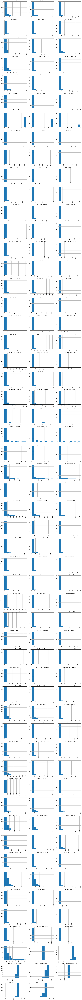

In [84]:
plotGraphForEachFeature(churned_df, nCol, 3)

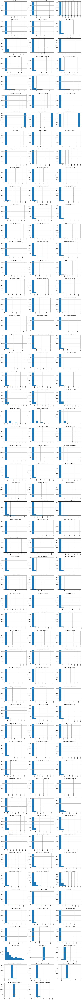

In [85]:
plotGraphForEachFeature(non_churned_df, nCol, 3)

In [86]:
mem_usage()

657.6171875

### Scatter and density plots

Analyse 8th month data

In [87]:
month_cols = master_df.columns[master_df.columns.str.contains(pat = '8|churn')]
month_df = master_df[sorted(month_cols)].select_dtypes(exclude=['category'])
month_df.head(1)

,arpu_2g_8,arpu_3g_8,arpu_8,av_rech_amt_data_8,churn,count_rech_2g_8,count_rech_3g_8,fb_user_8,ic_others_8,isd_ic_mou_8,isd_og_mou_8,last_day_rch_amt_8,loc_ic_mou_8,loc_ic_t2f_mou_8,loc_ic_t2m_mou_8,loc_ic_t2t_mou_8,loc_og_mou_8,loc_og_t2c_mou_8,loc_og_t2f_mou_8,loc_og_t2m_mou_8,loc_og_t2t_mou_8,max_rech_amt_8,max_rech_data_8,monthly_2g_8,monthly_3g_8,night_pck_user_8,offnet_mou_8,og_others_8,onnet_mou_8,roam_ic_mou_8,roam_og_mou_8,sachet_2g_8,sachet_3g_8,spl_ic_mou_8,spl_og_mou_8,std_ic_mou_8,std_ic_t2f_mou_8,std_ic_t2m_mou_8,std_ic_t2t_mou_8,std_og_mou_8,std_og_t2f_mou_8,std_og_t2m_mou_8,std_og_t2t_mou_8,total_data_rech_8,total_ic_mou_8,total_og_mou_8,total_rech_amt_8,total_rech_data_8,total_rech_num_8,vbc_3g_8,vol_2g_mb_8,vol_3g_mb_8
0,212.17,212.17,213.803,252.0,1,0.0,1.0,1,0.0,0.0,0.0,252,5.44,1.15,4.13,0.16,0.0,0.0,0.0,0.0,0.0,252,252.0,0,1,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,252.0,5.44,0.0,252,1.0,2,30.4,5.75,109.61


Plotting 17 row(s) of scatter and density plots...


<Figure size 300x300 with 0 Axes>

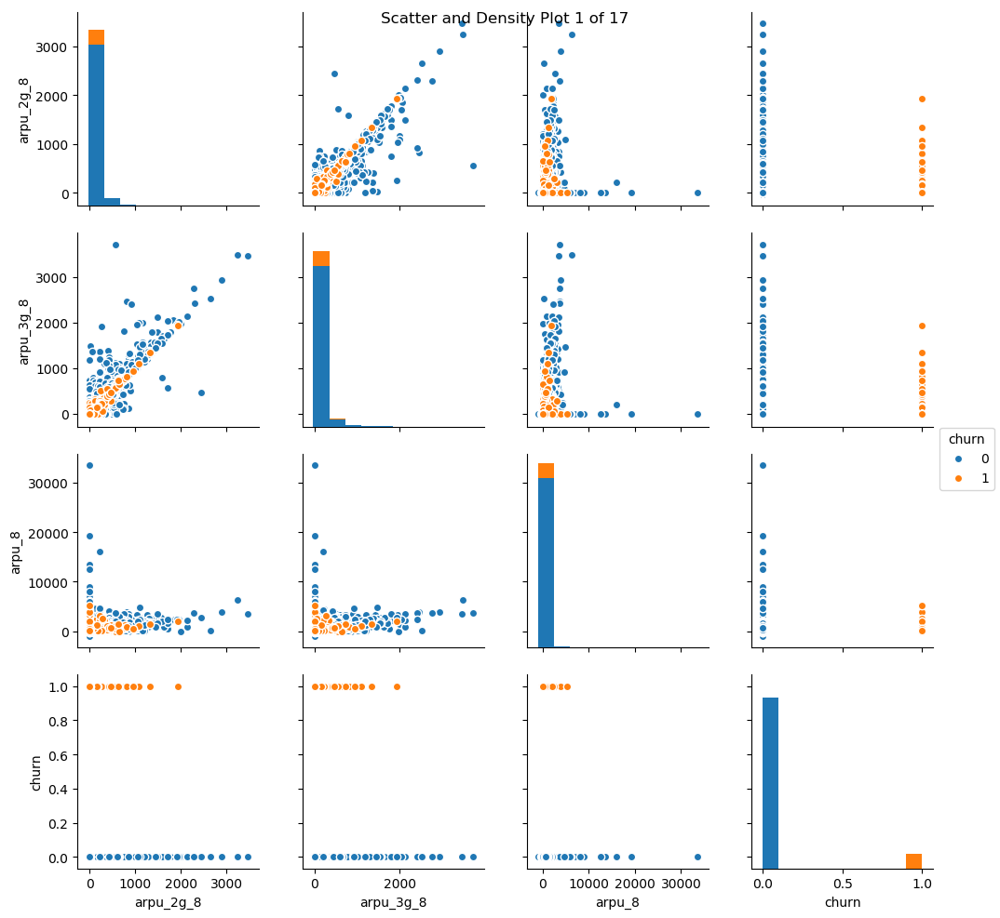

<Figure size 300x300 with 0 Axes>

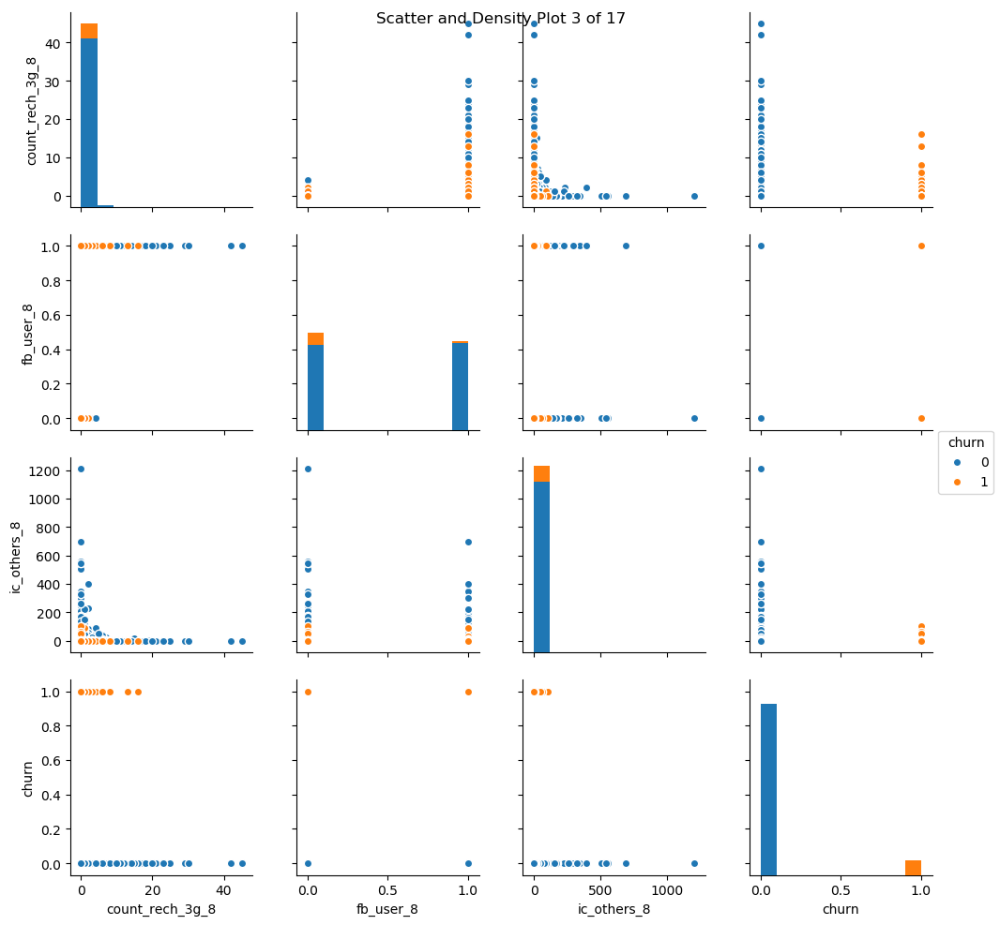

<Figure size 300x300 with 0 Axes>

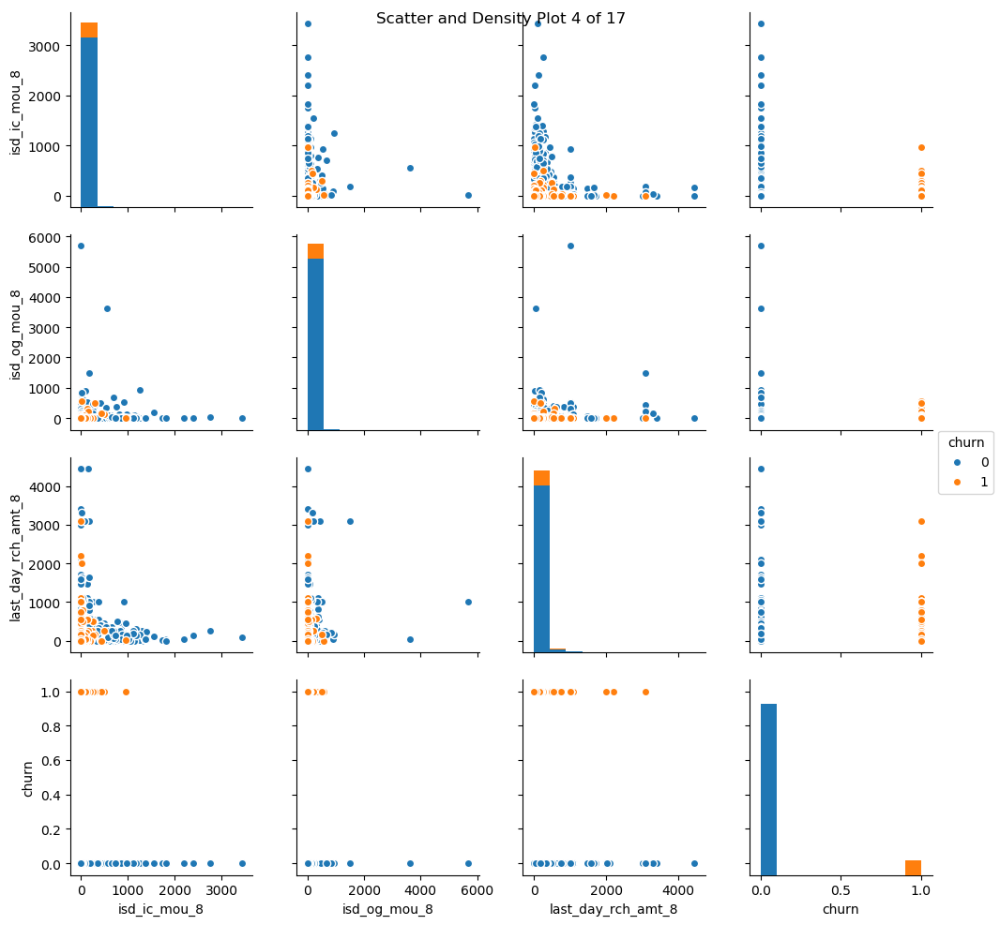

<Figure size 300x300 with 0 Axes>

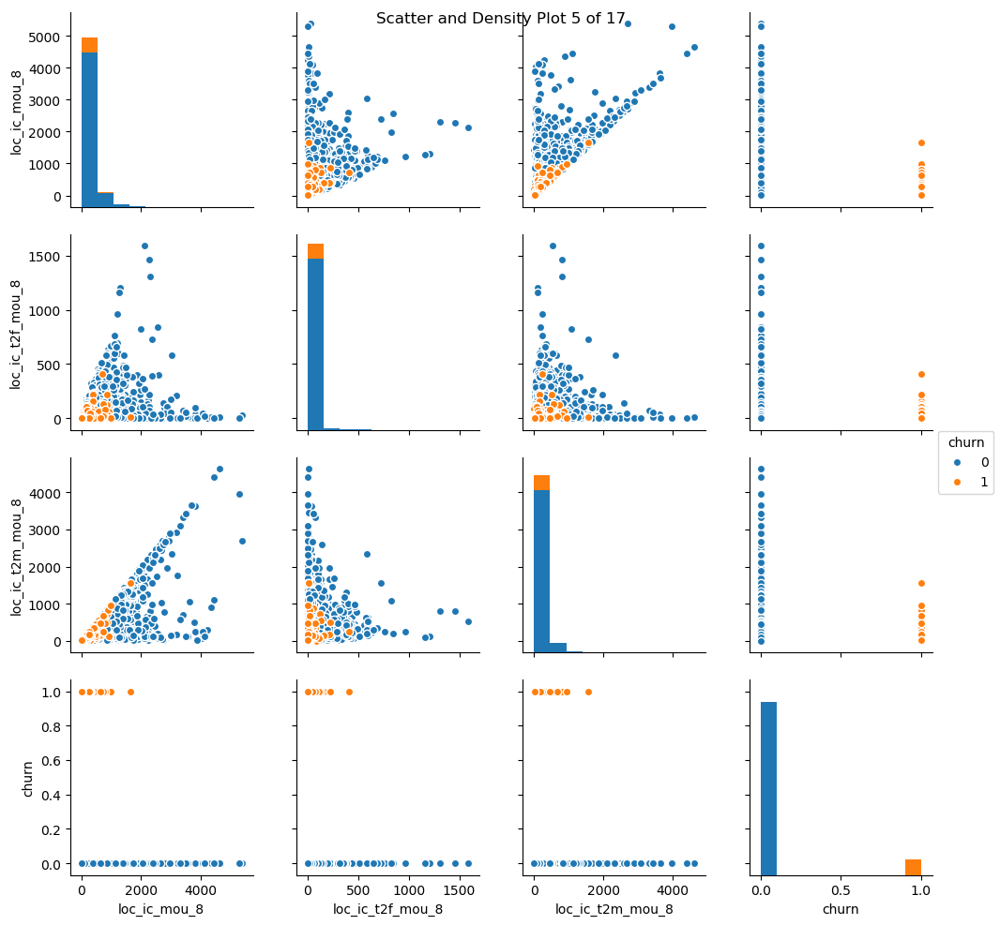

<Figure size 300x300 with 0 Axes>

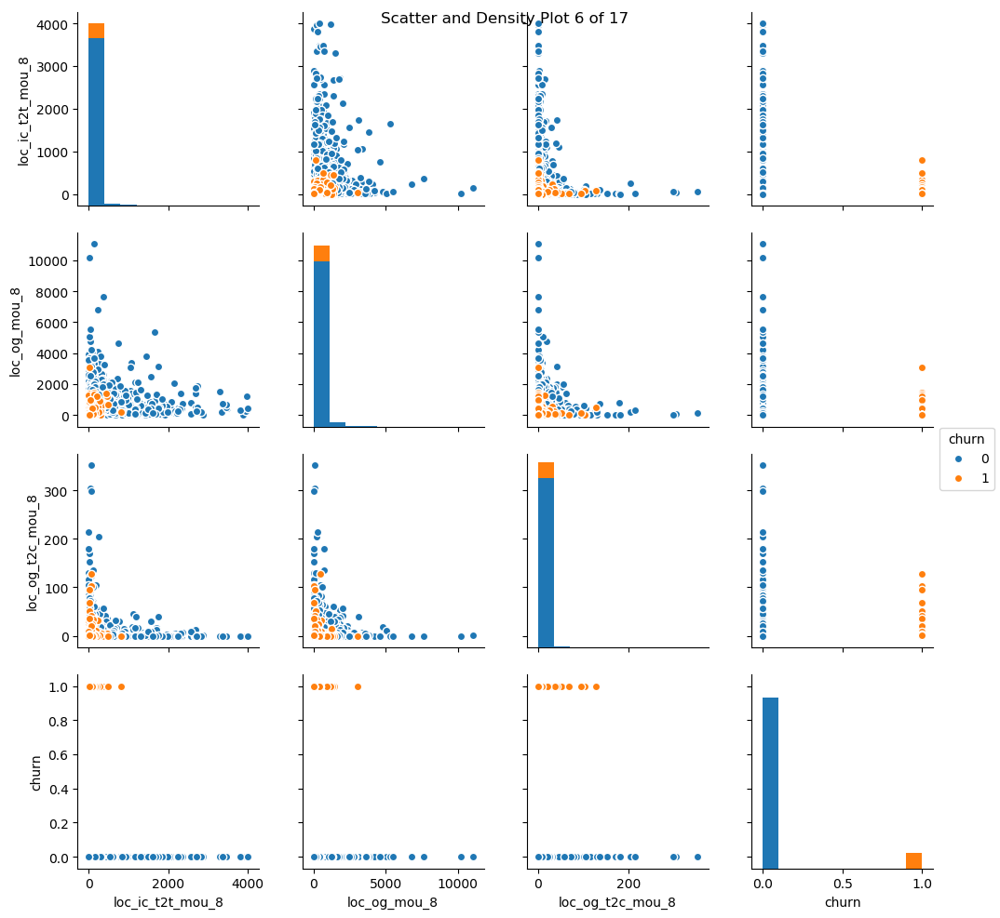

<Figure size 300x300 with 0 Axes>

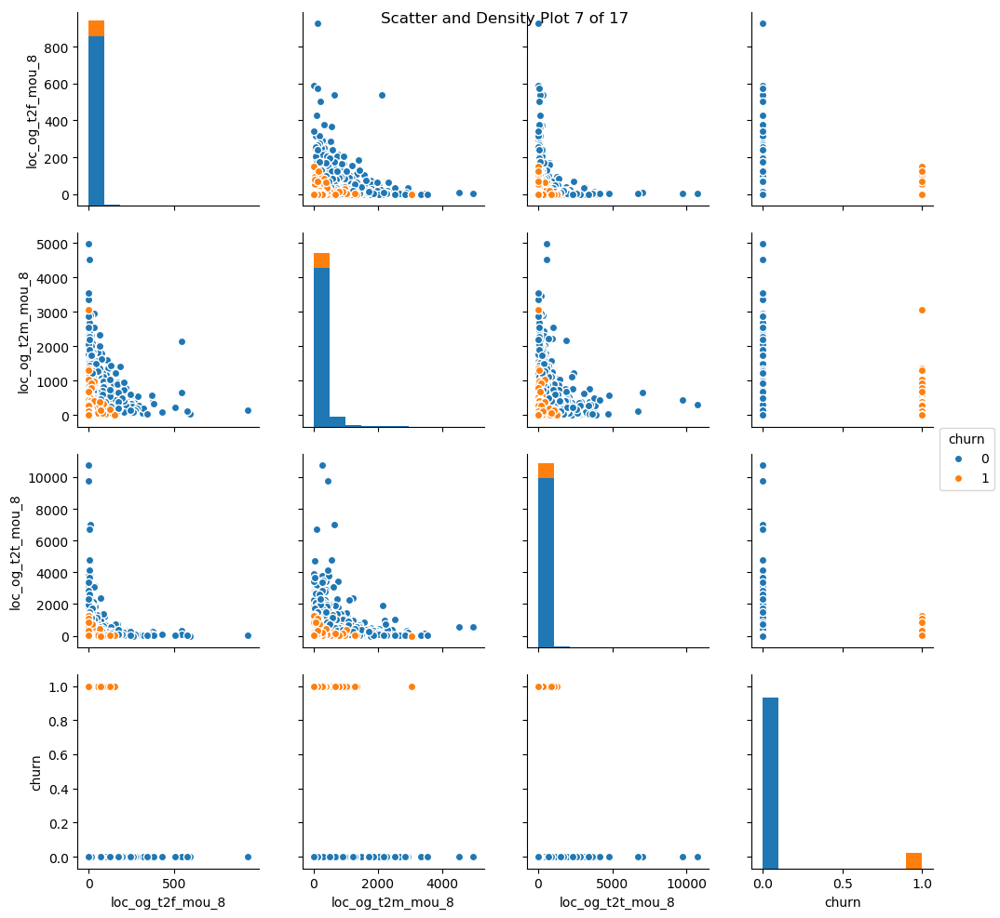

<Figure size 300x300 with 0 Axes>

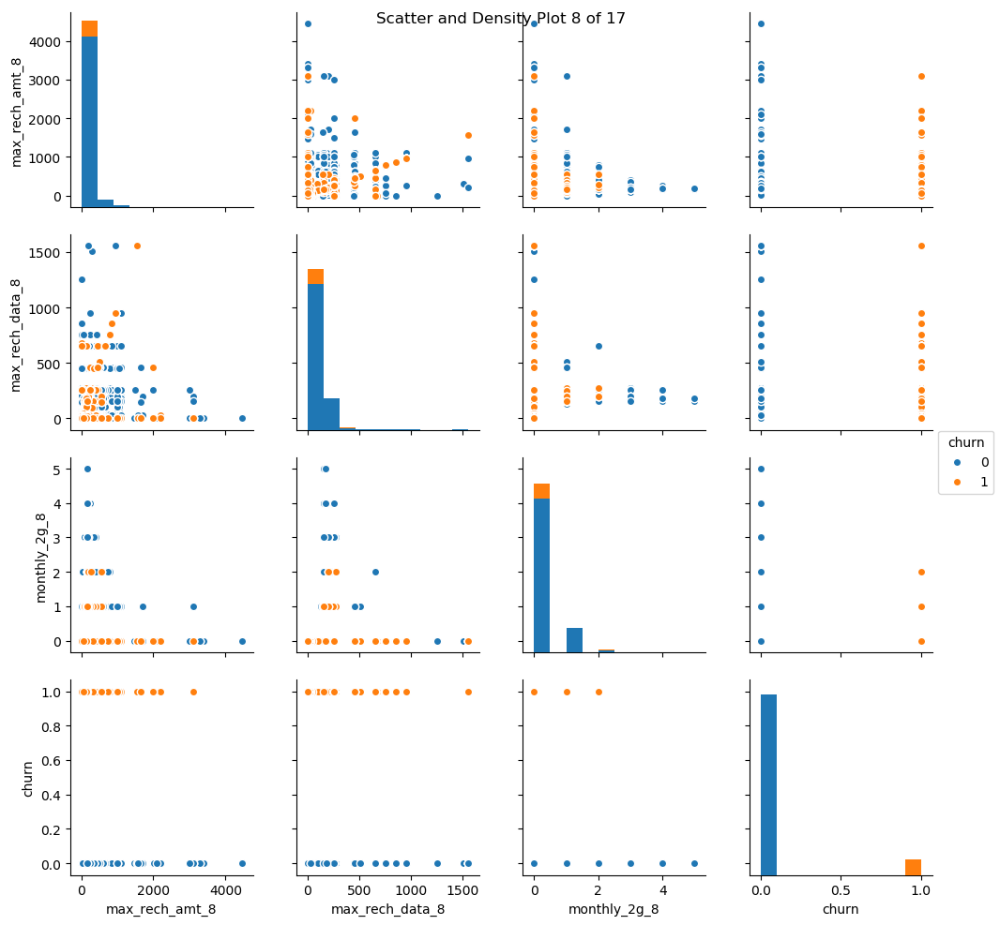

<Figure size 300x300 with 0 Axes>

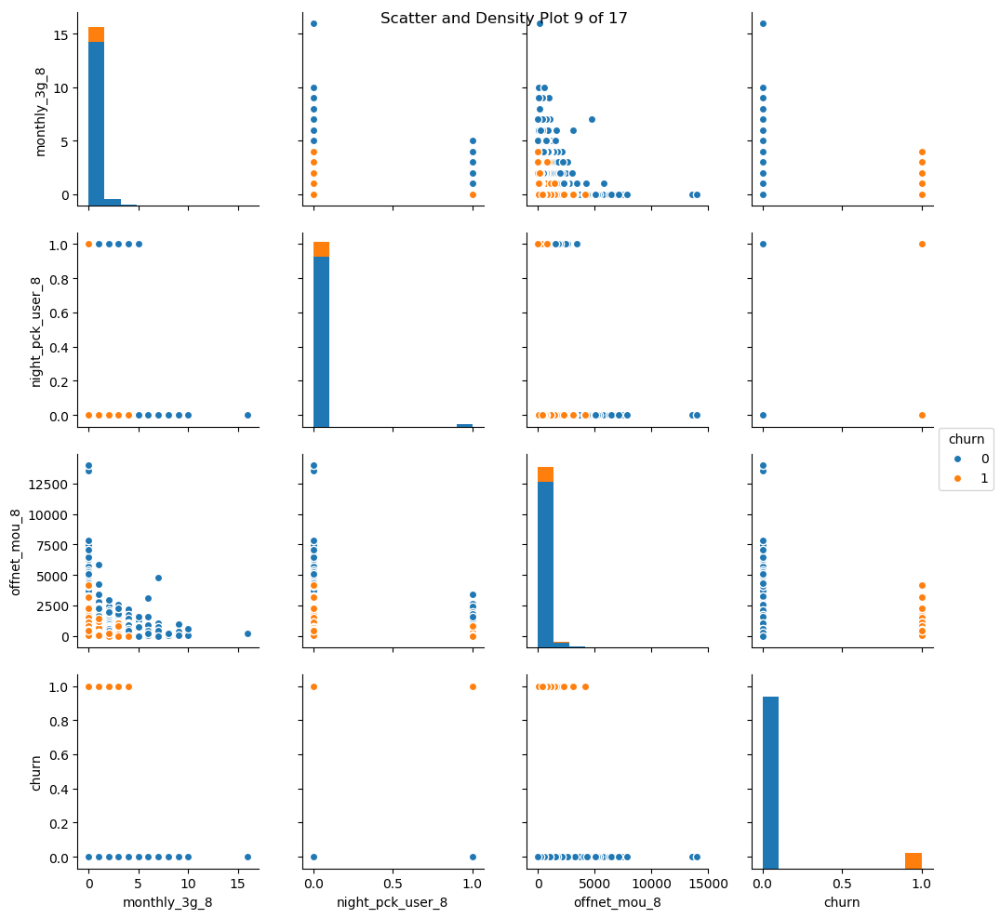

<Figure size 300x300 with 0 Axes>

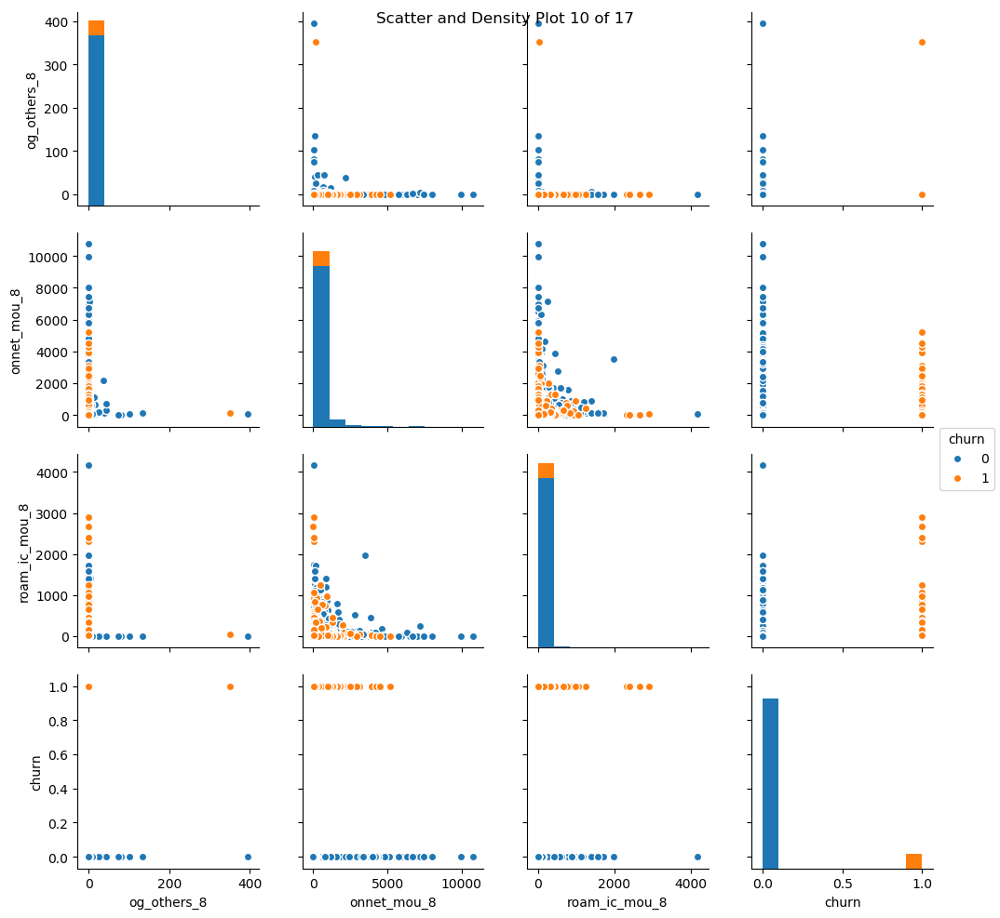

<Figure size 300x300 with 0 Axes>

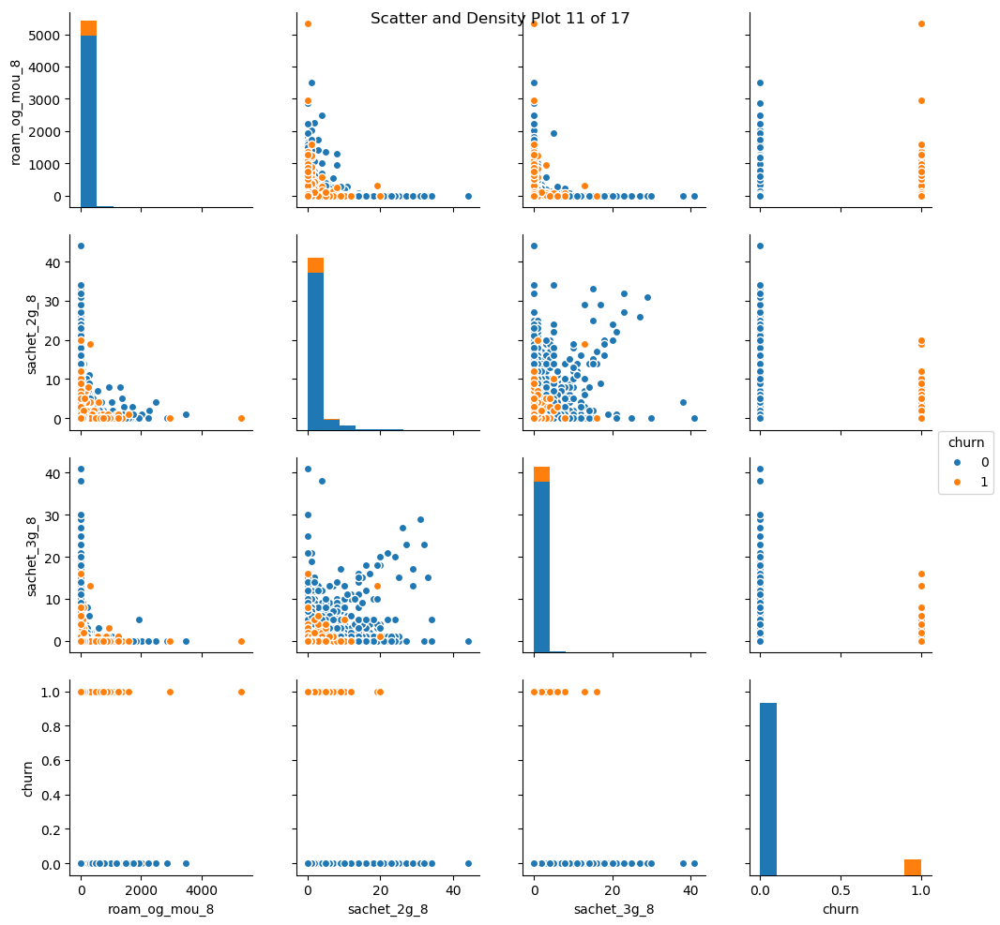

<Figure size 300x300 with 0 Axes>

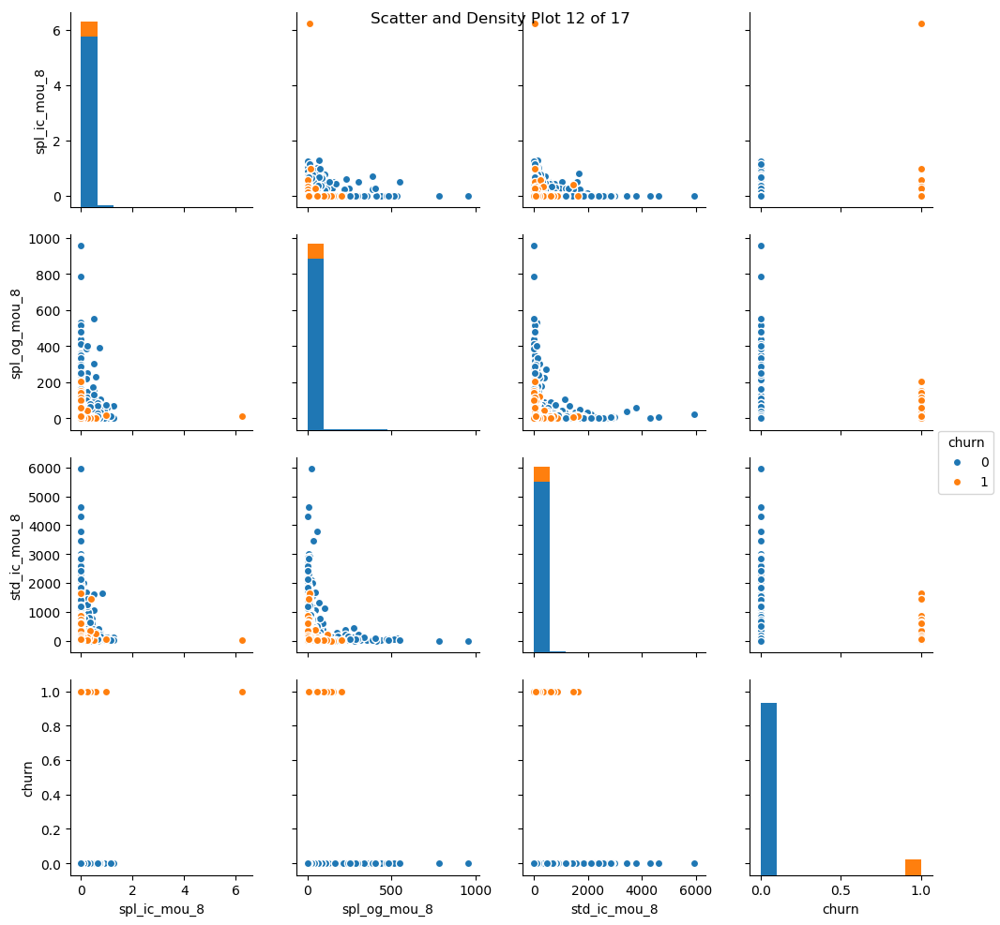

<Figure size 300x300 with 0 Axes>

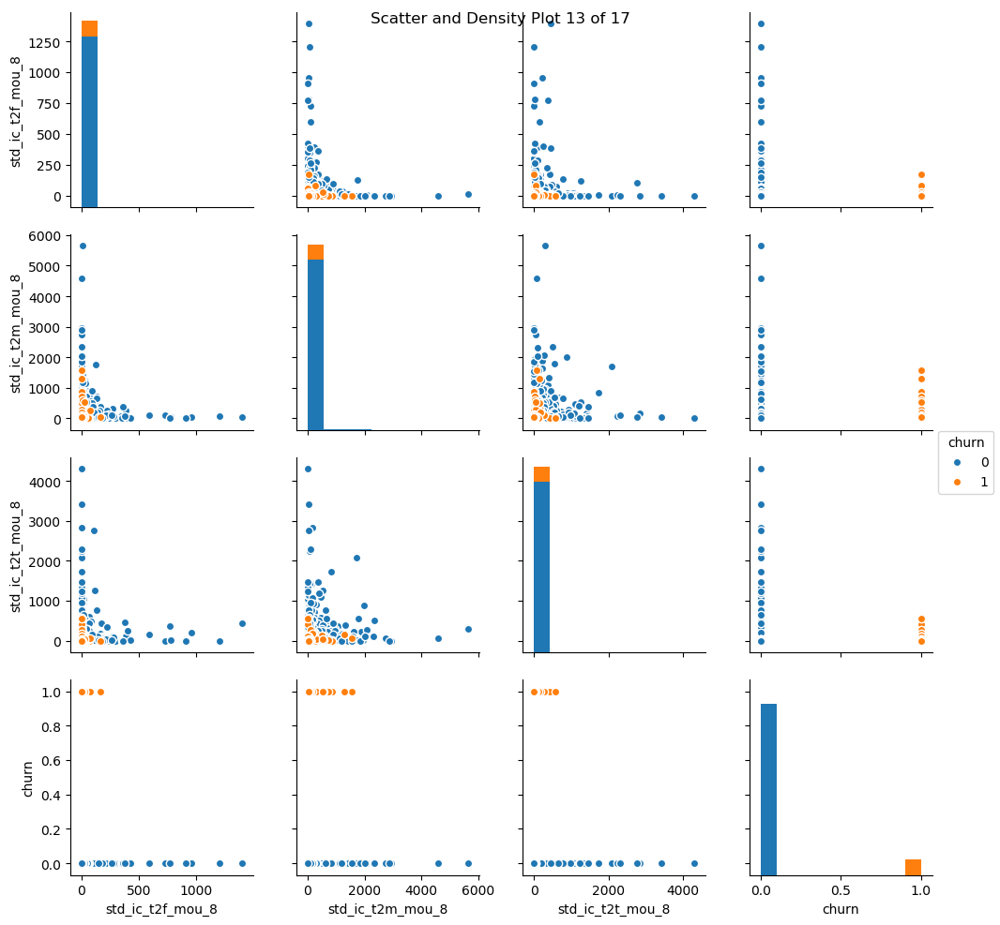

<Figure size 300x300 with 0 Axes>

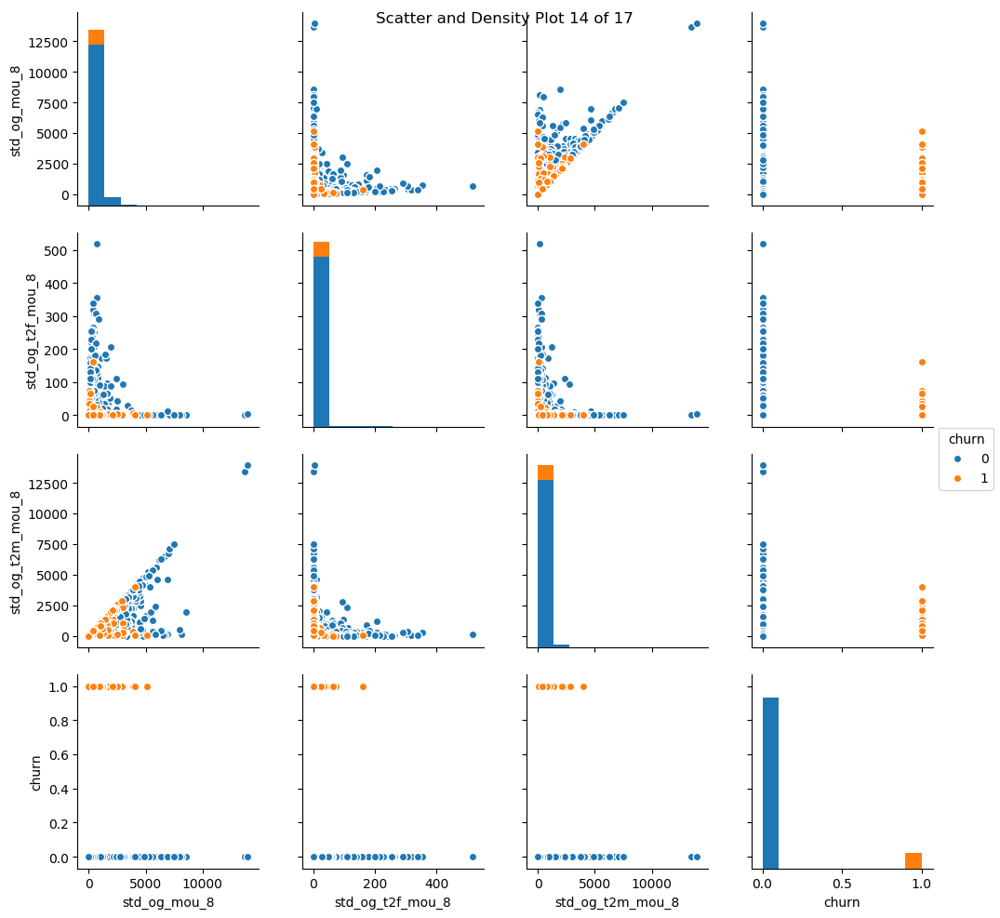

<Figure size 300x300 with 0 Axes>

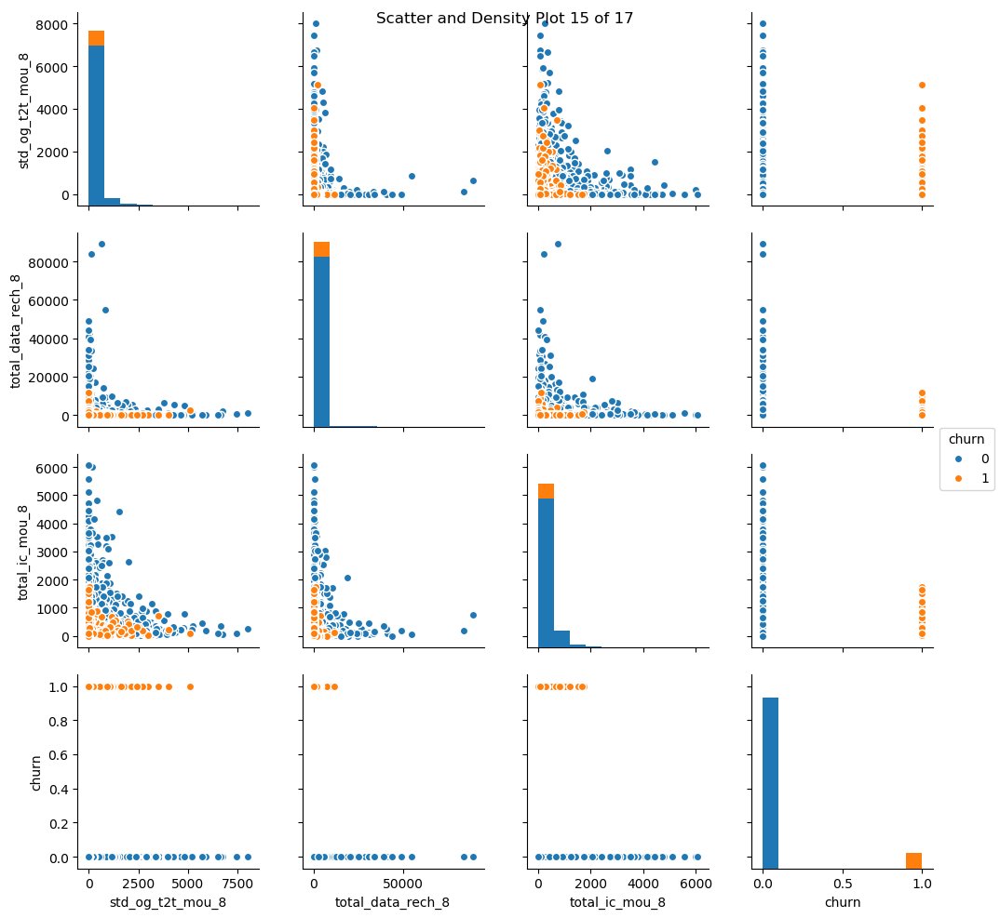

<Figure size 300x300 with 0 Axes>

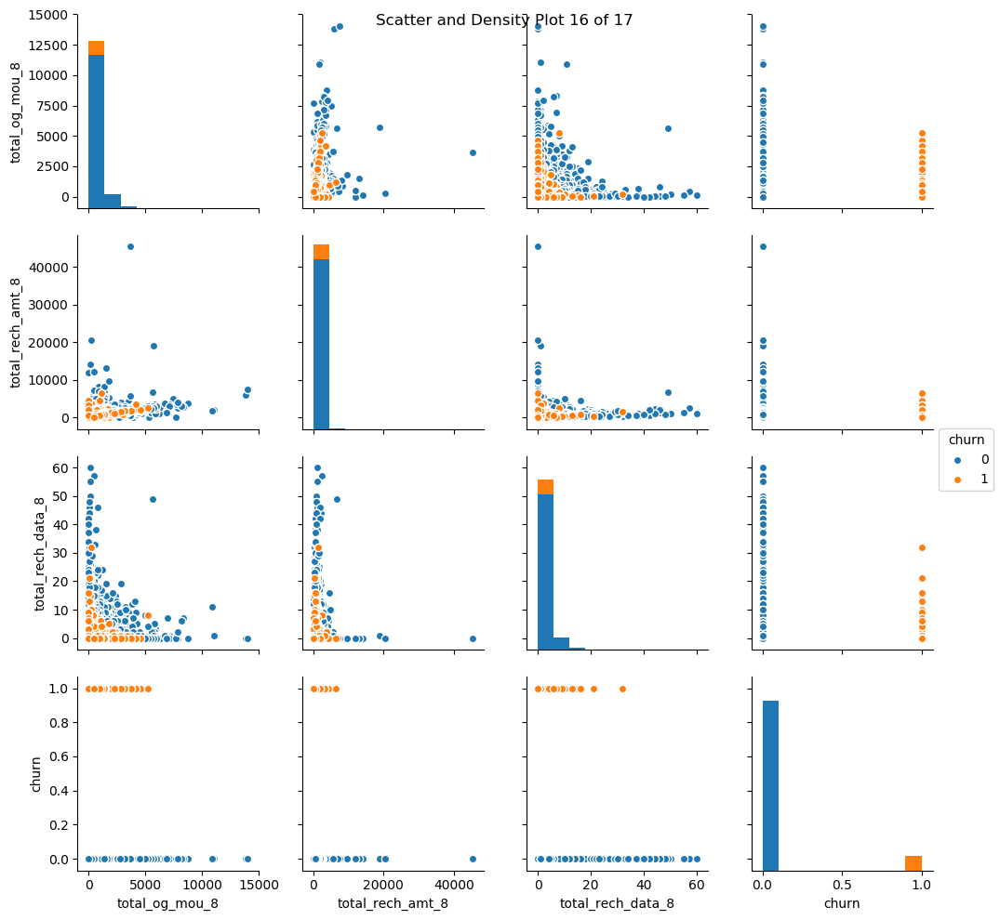

<Figure size 300x300 with 0 Axes>

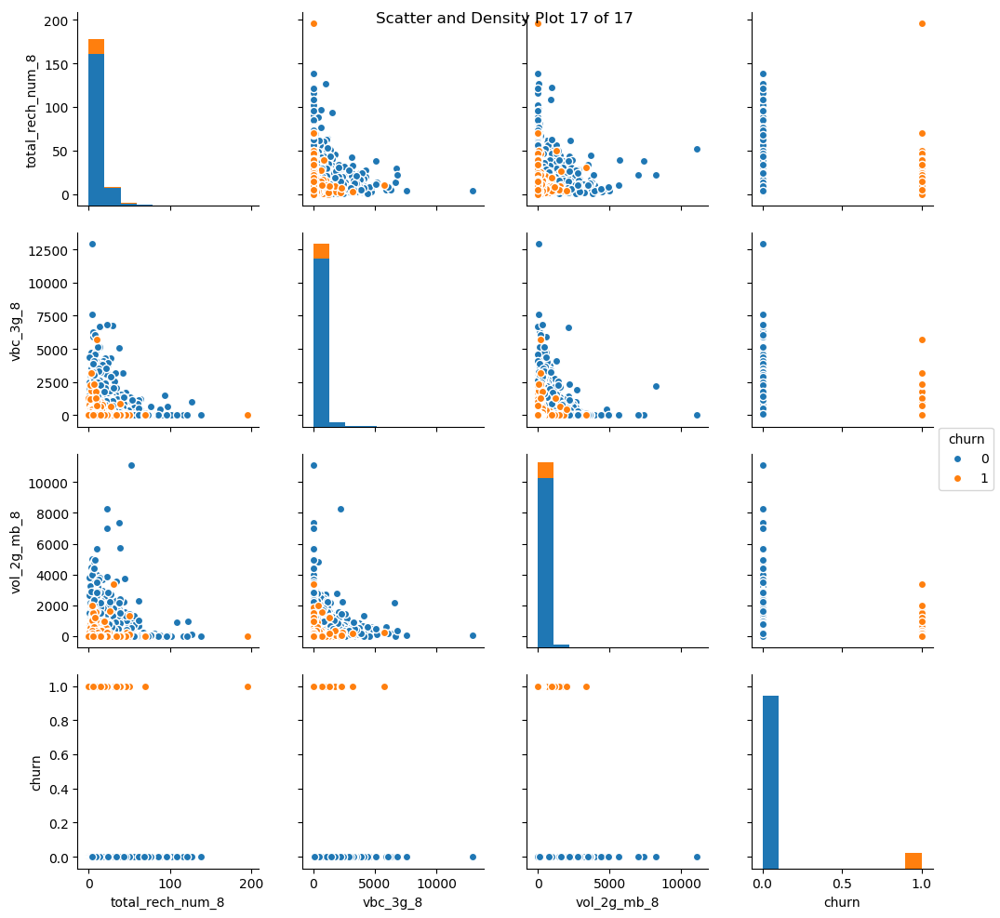

In [88]:
plotScatterForEachFeature(month_df, 'churn', 3, 3)

Analyse non monthly features

In [89]:
non_month_cols = master_df.columns[~master_df.columns.str.contains(pat = '6|7|8|9')]
non_month_df = master_df[sorted(non_month_cols)].select_dtypes(exclude=['category'])
non_month_df.head(1)

,aon,arpu_difference,churn,isd_ic_mou_difference,isd_og_mou_difference,loc_ic_mou_difference,loc_og_mou_difference,offnet_mou_difference,onnet_mou_difference,roam_ic_mou_difference,roam_og_mou_difference,spl_ic_mou_difference,spl_og_mou_difference,std_ic_mou_difference,std_og_mou_difference,total_data_rech_difference,total_ic_mou_difference,total_og_mou_difference,total_rech_amt_difference,vbc_3g_difference,vol_2g_mb_difference,vol_3g_mb_difference
0,968,7.7025,1,0.0,0.0,5.44,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.44,0.0,-55.0,-20.2,-9.975,-7.555


Plotting 7 row(s) of scatter and density plots...


<Figure size 300x300 with 0 Axes>

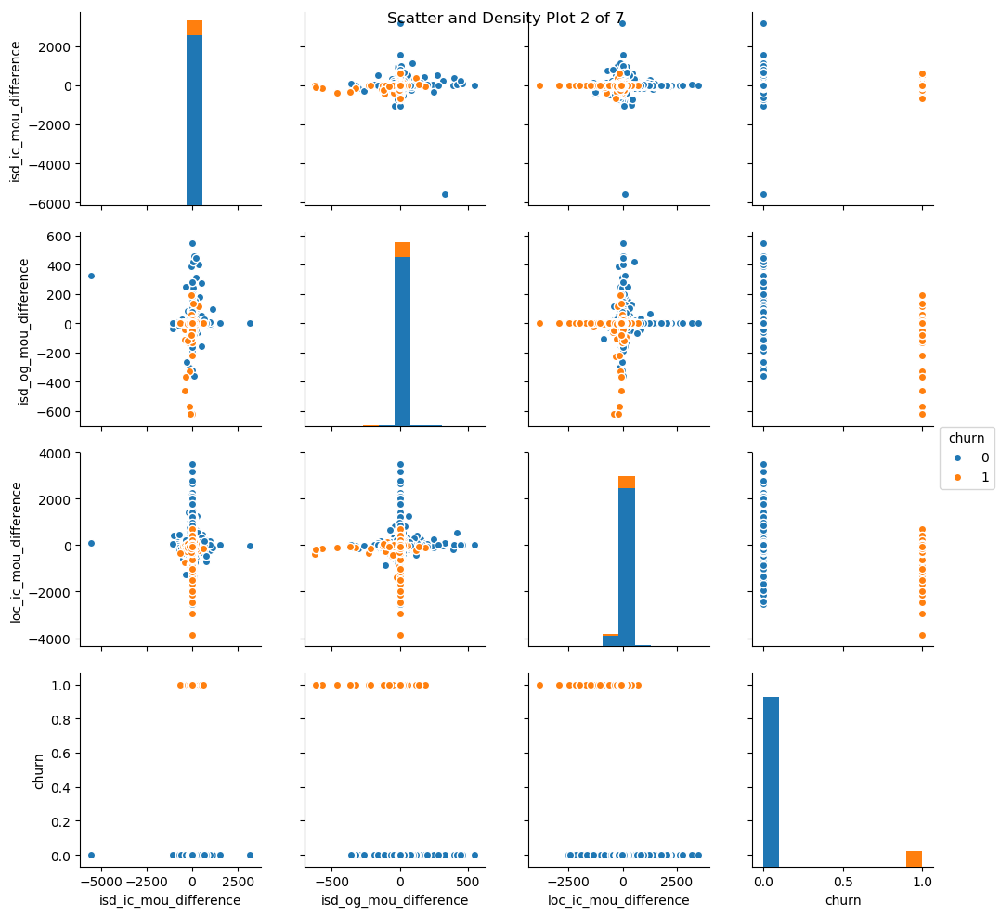

<Figure size 300x300 with 0 Axes>

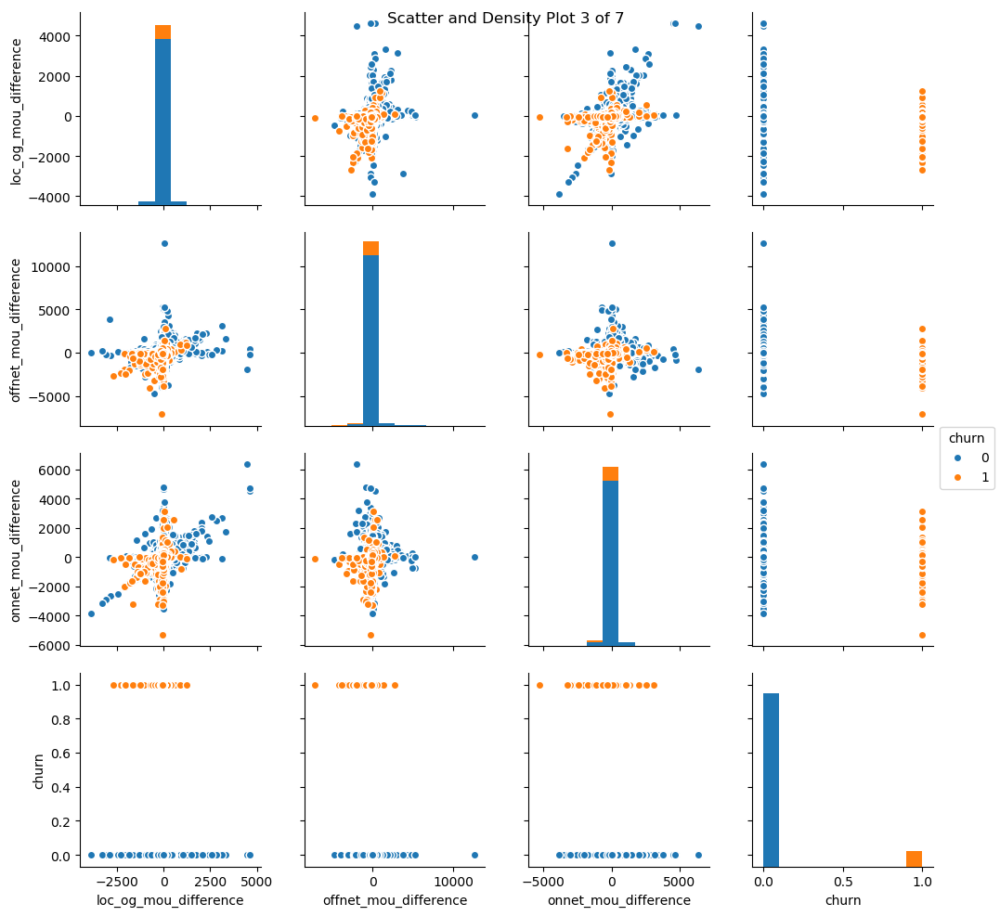

<Figure size 300x300 with 0 Axes>

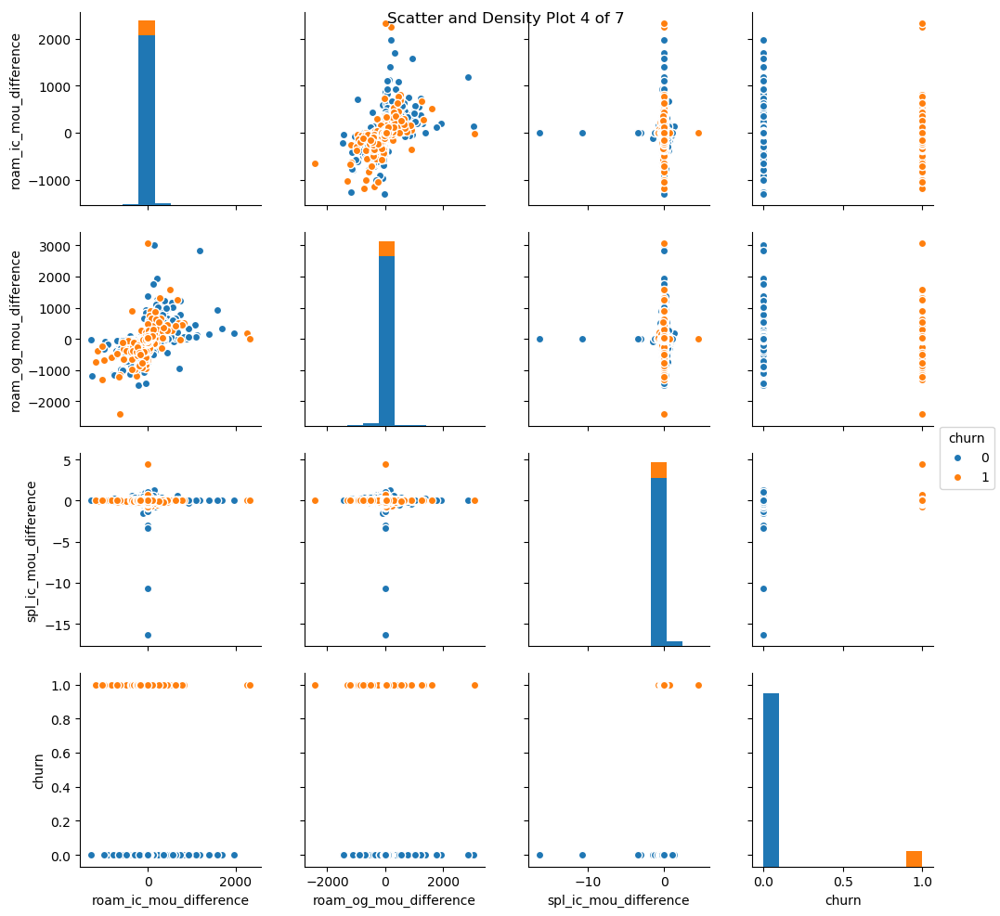

<Figure size 300x300 with 0 Axes>

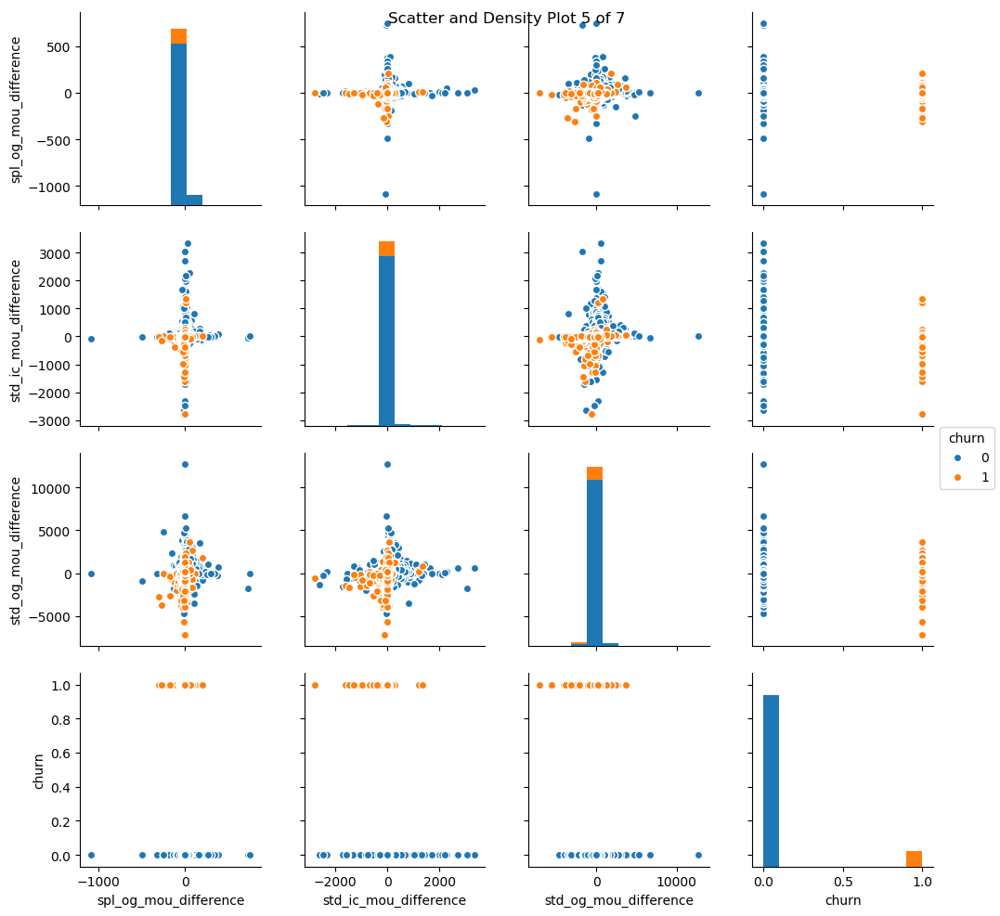

<Figure size 300x300 with 0 Axes>

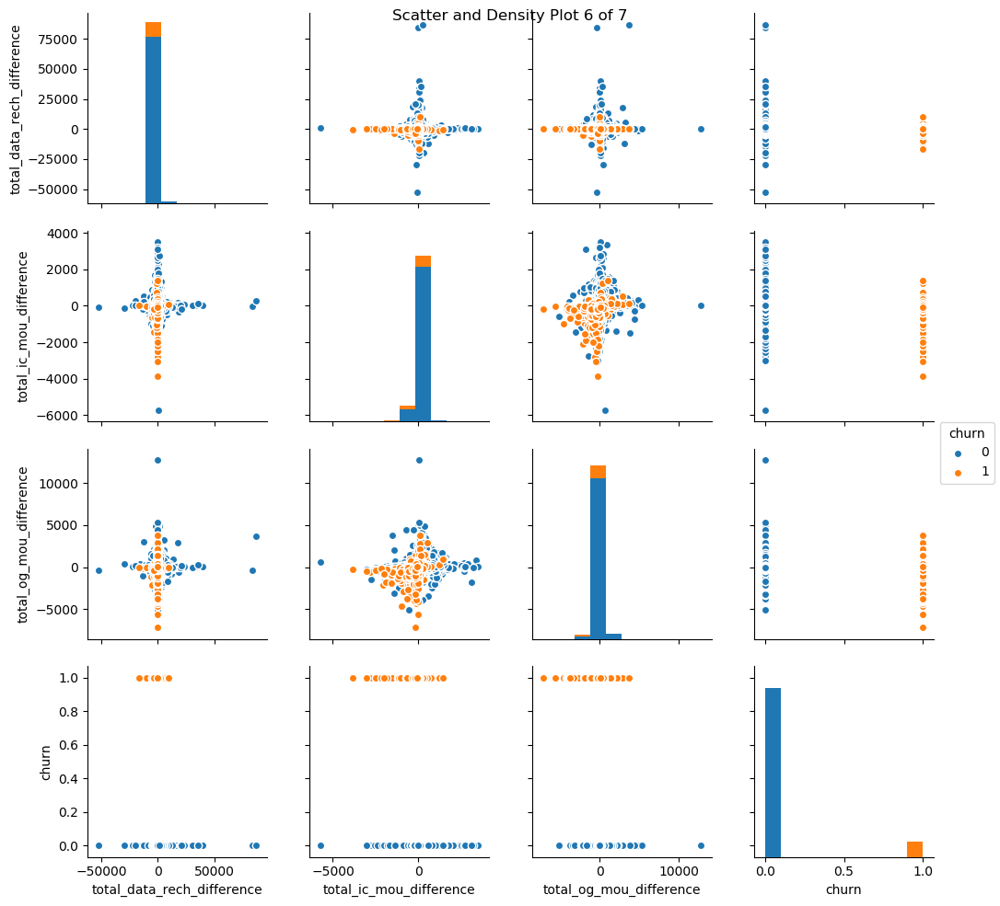

<Figure size 300x300 with 0 Axes>

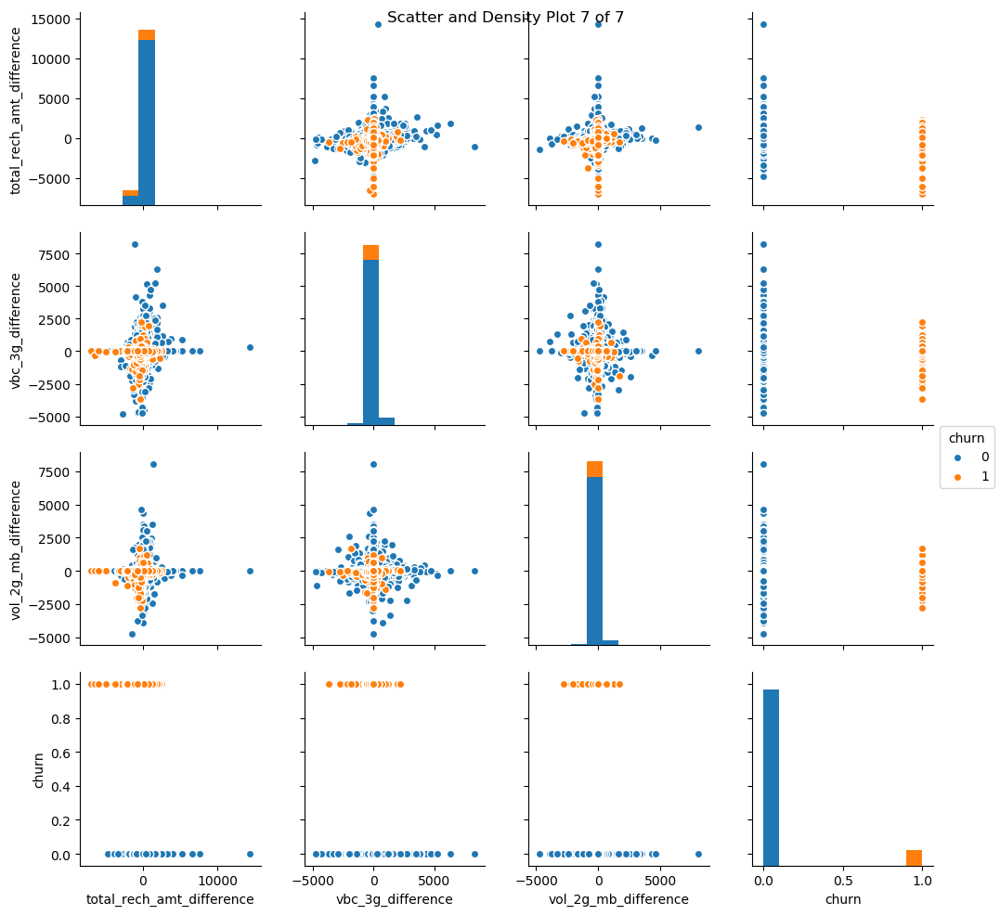

In [90]:
plotScatterForEachFeature(non_month_df, 'churn', 3, 3)

##### From the above bar and scatter plots we can see that most of the features are linearly distributed
- Though it seems not completely linear but good for evaluating linear models

In [91]:
mem_usage()

674.40625

### AON vs Churn
- AON    =	Age on network - number of days the customer is using the operator T network

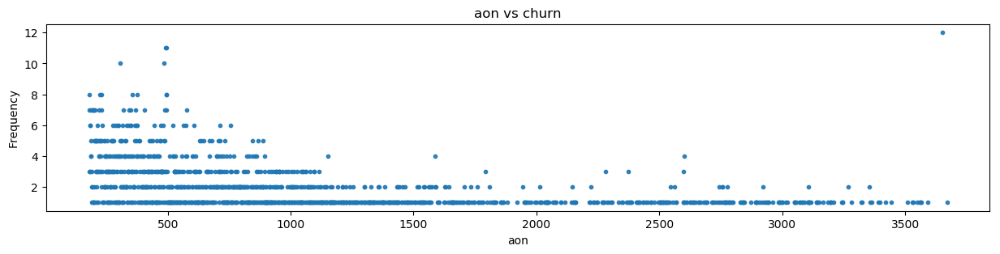

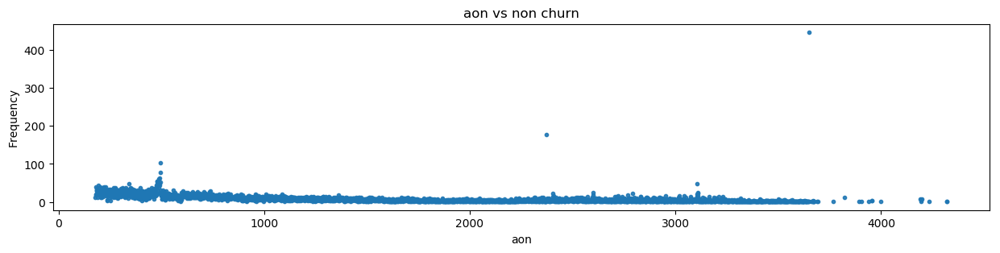

In [92]:
churn_aon_freq = churned_df.groupby(churned_df.aon).size().reset_index(name='Frequency')
non_churn_aon_freq = non_churned_df.groupby(non_churned_df.aon).size().reset_index(name='Frequency')

draw_scatter_plot(churn_aon_freq, "aon", "Frequency", "aon", "Frequency", 15, 3, 0,  'aon vs churn', None, 0.9)
draw_scatter_plot(non_churn_aon_freq, "aon", "Frequency", "aon", "Frequency", 15, 3, 0, 'aon vs non churn', None, 0.9)

#### From the above plot we can see that for churned customers the aon is significantly less then the non-churned customer

### Churned Customers - Max Recharge data anlysis for month 6,7 and 8

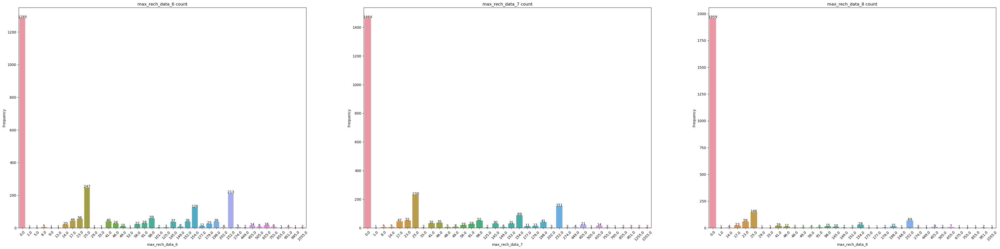

In [93]:
churn_max_rech_data_6_freq = churned_df.groupby(churned_df.max_rech_data_6).size().reset_index(name='Frequency')
churn_max_rech_data_7_freq = churned_df.groupby(churned_df.max_rech_data_7).size().reset_index(name='Frequency')
churn_max_rech_data_8_freq = churned_df.groupby(churned_df.max_rech_data_8).size().reset_index(name='Frequency')

# Plotting the distribution plot to visualise their distribution
columnName = "max_rech_data_6"
draw_bar_chart_subplot(churn_max_rech_data_6_freq, columnName, 'Frequency', columnName + ' count', 
                       columnName, 'Frequency', 50, 25, 45, None, '', True, False, 2, 3, 1)

columnName = "max_rech_data_7"
draw_bar_chart_subplot(churn_max_rech_data_7_freq, columnName, 'Frequency',  columnName + ' count', 
                       columnName, '', 50, 25, 45, None, '', True, False, 2, 3, 2)

columnName = "max_rech_data_8"
draw_bar_chart_subplot(churn_max_rech_data_8_freq, columnName, 'Frequency', columnName + ' count', 
                       columnName, '', 50, 25, 45, None, '', True, True, 2, 3, 3)

### Non Churned Customers - Max Recharge data anlysis for month 6,7 and 8


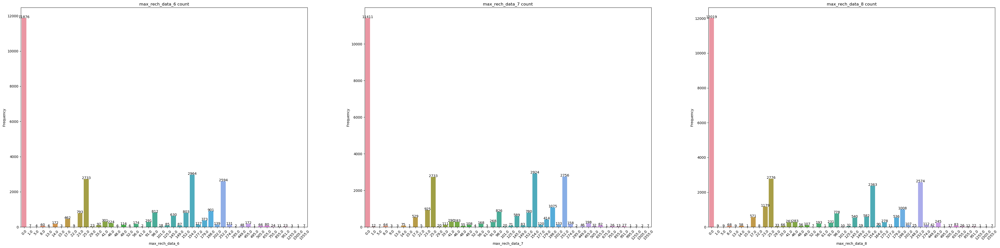

In [94]:
non_churn_max_rech_data_6_freq = non_churned_df.groupby(non_churned_df.max_rech_data_6).size().reset_index(name='Frequency')
non_churn_max_rech_data_7_freq = non_churned_df.groupby(non_churned_df.max_rech_data_7).size().reset_index(name='Frequency')
non_churn_max_rech_data_8_freq = non_churned_df.groupby(non_churned_df.max_rech_data_8).size().reset_index(name='Frequency')

# Plotting the distribution plot to visualise their distribution
columnName = "max_rech_data_6"
draw_bar_chart_subplot(non_churn_max_rech_data_6_freq, columnName, 'Frequency', columnName + ' count', 
                       columnName, 'Frequency', 50, 25, 45, None, '', True, False, 2, 3, 1)

columnName = "max_rech_data_7"
draw_bar_chart_subplot(non_churn_max_rech_data_7_freq, columnName, 'Frequency', columnName + ' count', 
                       columnName, '', 50, 25, 45, None, '', True, False, 2, 3, 2)

columnName = "max_rech_data_8"
draw_bar_chart_subplot(non_churn_max_rech_data_8_freq, columnName, 'Frequency', columnName + ' count',
                       columnName, '', 50, 25, 45, None, '', True, True, 2, 3, 3)

From the aobve plots we can see that for churned customers that max_rech_data is reducing over period of months specially for higher values

### Churned Customers - recharge of count 2g and 3g

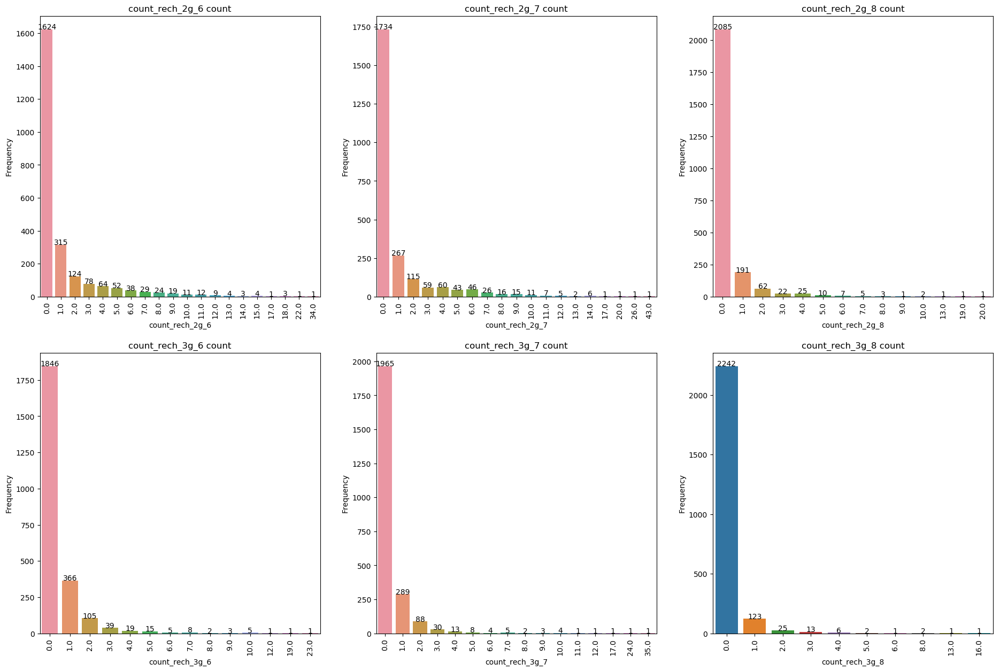

In [95]:
churn_count_rech_2g_6 = churned_df.groupby(churned_df.count_rech_2g_6).size().reset_index(name='Frequency')
churn_count_rech_2g_7 = churned_df.groupby(churned_df.count_rech_2g_7).size().reset_index(name='Frequency')
churn_count_rech_2g_8 = churned_df.groupby(churned_df.count_rech_2g_8).size().reset_index(name='Frequency')
churn_count_rech_3g_6 = churned_df.groupby(churned_df.count_rech_3g_6).size().reset_index(name='Frequency')
churn_count_rech_3g_7 = churned_df.groupby(churned_df.count_rech_3g_7).size().reset_index(name='Frequency')
churn_count_rech_3g_8 = churned_df.groupby(churned_df.count_rech_3g_8).size().reset_index(name='Frequency')

# Plotting the distribution plot to visualise their distribution
columnName = "count_rech_2g_6"
draw_bar_chart_subplot(churn_count_rech_2g_6, columnName, 'Frequency', columnName + ' count', columnName, 'Frequency',
                       23, 15, 90, None, '', True, False, 2, 3, 1)

columnName = "count_rech_2g_7"
draw_bar_chart_subplot(churn_count_rech_2g_7, columnName, 'Frequency', columnName + ' count', columnName, '', 23, 15, 90,
                       None, '', True, False, 2, 3, 2)

columnName = "count_rech_2g_8"
draw_bar_chart_subplot(churn_count_rech_2g_8, columnName, 'Frequency', columnName + ' count', columnName, '', 23, 15, 90,
                       None, '', True, False, 2, 3, 3)

columnName = "count_rech_3g_6"
draw_bar_chart_subplot(churn_count_rech_3g_6, columnName, 'Frequency', columnName + ' count', columnName, 'Frequency', 
                       23, 15, 90, None, '', True, False, 2, 3, 4)

columnName = "count_rech_3g_7"
draw_bar_chart_subplot(churn_count_rech_3g_7, columnName, 'Frequency', columnName + ' count', columnName, '', 23, 15, 90,
                       None, '', True, False, 2, 3, 5)

columnName = "count_rech_3g_8"
draw_bar_chart_subplot(churn_count_rech_3g_8, columnName, 'Frequency', columnName + ' count', columnName, '', 23, 15, 90,
                       None, '', True, True, 2, 3, 6)

### Non Churned Customers - recharge of count 2g and 3g

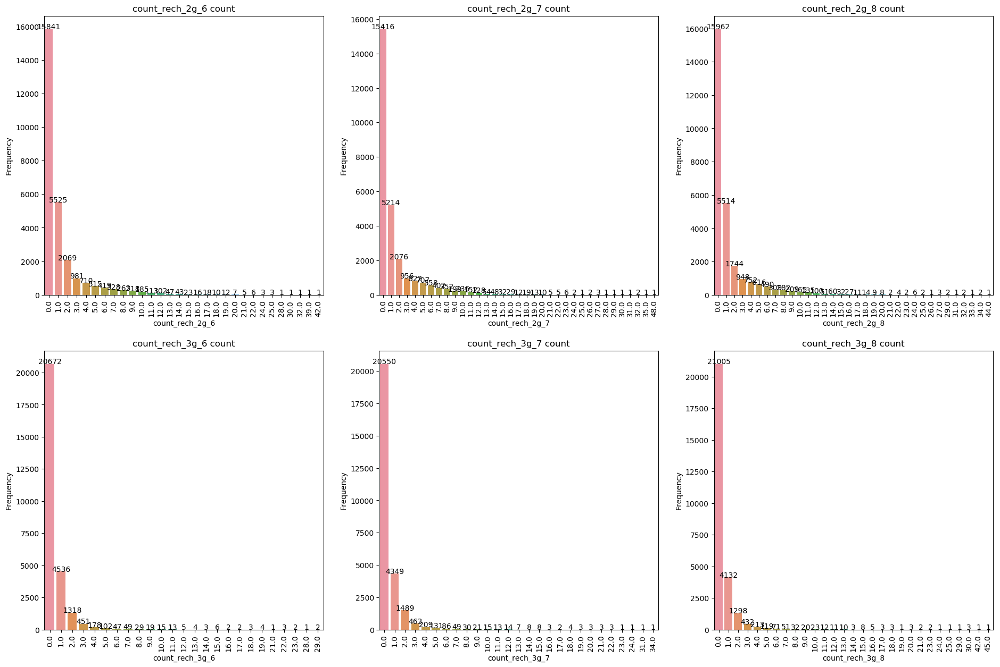

In [96]:
non_churn_count_rech_2g_6 = non_churned_df.groupby(non_churned_df.count_rech_2g_6).size().reset_index(name='Frequency')
non_churn_count_rech_2g_7 = non_churned_df.groupby(non_churned_df.count_rech_2g_7).size().reset_index(name='Frequency')
non_churn_count_rech_2g_8 = non_churned_df.groupby(non_churned_df.count_rech_2g_8).size().reset_index(name='Frequency')
non_churn_count_rech_3g_6 = non_churned_df.groupby(non_churned_df.count_rech_3g_6).size().reset_index(name='Frequency')
non_churn_count_rech_3g_7 = non_churned_df.groupby(non_churned_df.count_rech_3g_7).size().reset_index(name='Frequency')
non_churn_count_rech_3g_8 = non_churned_df.groupby(non_churned_df.count_rech_3g_8).size().reset_index(name='Frequency')

# Plotting the distribution plot to visualise their distribution
columnName = "count_rech_2g_6"
draw_bar_chart_subplot(non_churn_count_rech_2g_6, columnName, 'Frequency', columnName + ' count', columnName, 'Frequency',
                       23, 15, 90, None, '', True, False, 2, 3, 1)

columnName = "count_rech_2g_7"
draw_bar_chart_subplot(non_churn_count_rech_2g_7, columnName, 'Frequency', columnName + ' count', columnName, '', 23, 15, 
                       90, None, '', True, False, 2, 3, 2)

columnName = "count_rech_2g_8"
draw_bar_chart_subplot(non_churn_count_rech_2g_8, columnName, 'Frequency', columnName + ' count', columnName, '', 23, 15,
                       90, None, '', True, False, 2, 3, 3)

columnName = "count_rech_3g_6"
draw_bar_chart_subplot(non_churn_count_rech_3g_6, columnName, 'Frequency', columnName + ' count', columnName, 'Frequency', 
                       23, 15, 90, None, '', True, False, 2, 3, 4)

columnName = "count_rech_3g_7"
draw_bar_chart_subplot(non_churn_count_rech_3g_7, columnName, 'Frequency', columnName + ' count', columnName, '', 23, 15,
                       90, None, '', True, False, 2, 3, 5)

columnName = "count_rech_3g_8"
draw_bar_chart_subplot(non_churn_count_rech_3g_8, columnName, 'Frequency', columnName + ' count', columnName, '', 23, 15,
                       90, None, '', True, True, 2, 3, 6)

From the plots we can see a similar behaviour as above that for churned customers that count_rech_3g , count_rech_2g is reducing over period of months specially for higher values

### Churned Customers - Total Recharge data

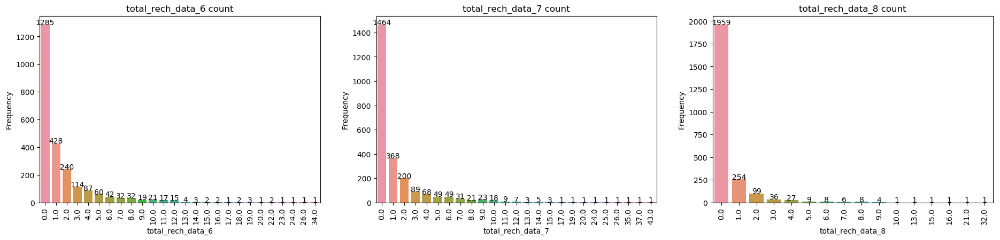

In [97]:
churn_total_rech_data_6_freq = churned_df.groupby(churned_df.total_rech_data_6).size().reset_index(name='Frequency')
churn_total_rech_data_7_freq = churned_df.groupby(churned_df.total_rech_data_7).size().reset_index(name='Frequency')
churn_total_rech_data_8_freq = churned_df.groupby(churned_df.total_rech_data_8).size().reset_index(name='Frequency')

# Plotting the distribution plot to visualise their distribution
columnName = "total_rech_data_6"
draw_bar_chart_subplot(churn_total_rech_data_6_freq, columnName, 'Frequency', columnName + ' count', columnName, 
                       'Frequency', 23, 10, 90,  None, '', True, False, 2, 3, 1)

columnName = "total_rech_data_7"
draw_bar_chart_subplot(churn_total_rech_data_7_freq, columnName, 'Frequency', columnName + ' count', columnName, '',
                       23, 10, 90, None, '', True, False, 2, 3, 2)

columnName = "total_rech_data_8"
draw_bar_chart_subplot(churn_total_rech_data_8_freq, columnName, 'Frequency', columnName + ' count', columnName, '',
                       23, 10, 90, None, '', True, True, 2, 3, 3)

### Non Churned Customers - Total Recharge data

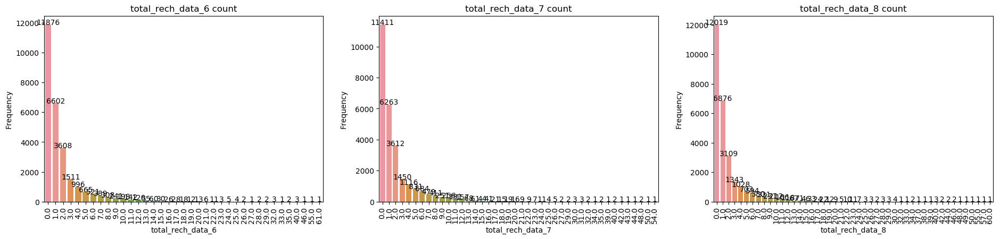

In [98]:
non_churn_total_rech_data_6_freq = non_churned_df.groupby(non_churned_df.total_rech_data_6).size().reset_index(name='Frequency')
non_churn_total_rech_data_7_freq = non_churned_df.groupby(non_churned_df.total_rech_data_7).size().reset_index(name='Frequency')
non_churn_total_rech_data_8_freq = non_churned_df.groupby(non_churned_df.total_rech_data_8).size().reset_index(name='Frequency')

# Plotting the distribution plot to visualise their distribution
columnName = "total_rech_data_6"
draw_bar_chart_subplot(non_churn_total_rech_data_6_freq, columnName, 'Frequency', columnName + ' count', columnName, 
                       'Frequency', 23, 10, 90, None, '', True, False, 2, 3, 1)

columnName = "total_rech_data_7"
draw_bar_chart_subplot(non_churn_total_rech_data_7_freq, columnName, 'Frequency', columnName + ' count', columnName, '',
                       23, 10, 90, None, '', True, False, 2, 3, 2)

columnName = "total_rech_data_8"
draw_bar_chart_subplot(non_churn_total_rech_data_8_freq, columnName, 'Frequency', columnName + ' count', columnName, '',
                       23, 10, 90, None, '', True, True, 2, 3, 3)

From the plots we can see a similar behaviour as above that for churned customers for month 8 as compared to 6 and 7 that total_rech_data is reducing over period of months specially for higher values

In [99]:
mem_usage()

659.04296875

### Outlier treatment 

In [100]:
master_df.describe(percentiles=[.25,.5,.75,.90,.95,.99,1])

,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_6,arpu_7,arpu_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,fb_user_6,fb_user_7,fb_user_8,ic_others_6,ic_others_7,ic_others_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,og_others_6,og_others_7,og_others_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,vbc_3g_6,vbc_3g_7,vbc_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,aon,churn,arpu_difference,onnet_mou_difference,offnet_mou_difference,roam_og_mou_difference,loc_og_mou_difference,std_og_mou_difference,isd_og_mou_difference,spl_og_mou_difference,total_og_mou_difference,roam_ic_mou_difference,loc_ic_mou_difference,std_ic_mou_difference,isd_ic_mou_difference,spl_ic_mou_difference,total_ic_mou_difference,vol_2g_mb_difference,vol_3g_mb_difference,vbc_3g_difference,total_rech_amt_difference,total_data_rech_difference
count,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.00

As we can see for almost all features the differnce between 99 and 100 percentile is quite huge indicating presence of heavy outliers beyond 99 percentile.

So we will cap the outliers for all the columns to 99 percentile.
Capping means any value above the 99 cutoff value will be imputed with the same value

#### Capping the dataset to 99 percentile

In [101]:
# Outlier Treatement of Columns capping at 99% percentile
for col in master_df.columns:
    upperlimit = master_df[col].quantile(0.99)
    master_df[col] = master_df[col].apply(lambda x: upperlimit if(x > upperlimit) else x)


In [102]:
master_df.describe(percentiles=[.25,.5,.75,.90,.95,.99,1])

,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_6,arpu_7,arpu_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,fb_user_6,fb_user_7,fb_user_8,ic_others_6,ic_others_7,ic_others_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,og_others_6,og_others_7,og_others_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,vbc_3g_6,vbc_3g_7,vbc_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,aon,churn,arpu_difference,onnet_mou_difference,offnet_mou_difference,roam_og_mou_difference,loc_og_mou_difference,std_og_mou_difference,isd_og_mou_difference,spl_og_mou_difference,total_og_mou_difference,roam_ic_mou_difference,loc_ic_mou_difference,std_ic_mou_difference,isd_ic_mou_difference,spl_ic_mou_difference,total_ic_mou_difference,vol_2g_mb_difference,vol_3g_mb_difference,vbc_3g_difference,total_rech_amt_difference,total_data_rech_difference
count,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.0,29883.0,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883.000000,29883

In [103]:
# print the list of columns with unique values less than 2
count = 0
cols = []
for col in master_df.columns:
    if master_df[col].nunique() < 2 or master_df[col].nunique() == nRow:
        count+=1
        print(count, " ColName = ", col,
              ",\t UniqueValues = ", master_df[col].unique(),
              ",\t Dtype = ", master_df[col].dtype)
        cols.append(col)

1  ColName =  og_others_7 ,	 UniqueValues =  [0.] ,	 Dtype =  float64
2  ColName =  og_others_8 ,	 UniqueValues =  [0.] ,	 Dtype =  float64


In [104]:
#So dropping columns og_others_7 and og_others_8 as both have single value 0 and no variance.
dropColumns(master_df, cols)

Dropping og_others_7 ...
Dropping og_others_8 ...


### Normalising the Data

In [105]:
def normalize (x): 
    return ( (x-np.min(x))/ (max(x) - min(x)))
                                            
                                              
# applying normalize ( ) to all columns 
master_df = master_df.apply(normalize)

In [106]:
master_df['churn'] = master_df['churn'].astype(np.uint8)
master_df['churn'].dtype

dtype('uint8')

## Model Building

#### Splitting Data into Training and Test Sets

In [107]:
# Putting feature variable to X
X = master_df.drop(['churn'],axis=1)

# Putting response variable to y
y = master_df['churn']

y.unique()

array([1, 0], dtype=uint64)

In [108]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

#### Check  for class imabalance
- Verify  the number of data point for Churn and non-churn category

In [109]:
count_class_0, count_class_1 = master_df.churn.value_counts()
count_class_0,count_class_1

(27467, 2416)

As the ratio of Non-churned to churned users is nearly 10:1 ,we should handle the imbalance by either up-sampling or down-sampling.
- Here we are using down-sampling as the churn-category has good number of data points(2416)

#### Handle class imbalance using SMOTE.
This will only be done for train data as test data should not be changed

In [110]:
sm = SMOTE(random_state=42)

columns = X_train.columns
X_train, y_train = sm.fit_sample(X_train, y_train)

In [111]:
X_train = pd.DataFrame(data=X_train,columns=columns )
y_train = pd.Series(y_train.tolist())

Look at fraction of churn data and confirm that the distribution rate improved

In [112]:
print(round(master_df['churn'].mean(), 2))
print(round(y_train.mean(), 2))
print(round(y_test.mean(), 2))

0.08
0.5
0.08


After Sampling using SMOTE the train data has 50% distribution which is a significant improvement from 8% initially.

Release memory by deleting unused dataframes

In [113]:
print(mem_usage()) # initial memory usage

# delete all objects which can hold reference to data frame and the temp dataframes 
del [[month_df, non_month_df, non_churned_df, churned_df]]
gc.collect() # garbage collect all deleted objects

# set to null
non_churned_df = pd.DataFrame()
churned_df = pd.DataFrame()

mem_usage() # memory usage after deleting the df

764.34375


757.90625

### PCA on the data

Computng the principal components, using the train data, and apply them later on the test data

In [114]:
X_train.shape

(38450, 172)

In [115]:
pca = PCA(svd_solver='randomized', random_state=42)
pca

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
  svd_solver='randomized', tol=0.0, whiten=False)

Doing the PCA on the train data

In [116]:
# Fit train data on pca
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
  svd_solver='randomized', tol=0.0, whiten=False)

Plotting the principal components and try to make sense of them
- We'll plot original features on the first 2 principal components as axes

In [117]:
pca.components_

array([[ 1.02415821e-01,  9.40293505e-02,  7.88372210e-02, ...,
        -4.12685087e-03,  1.58748881e-02, -2.87527678e-03],
       [ 4.74755535e-02,  7.04950296e-02,  8.31297175e-02, ...,
         4.94234024e-03,  1.71073445e-02,  3.99542749e-03],
       [-1.85746645e-01, -1.23830494e-01, -8.50122278e-02, ...,
         1.59956827e-02,  2.32019306e-02,  1.22189352e-03],
       ...,
       [-1.15936977e-03,  5.00795532e-04, -3.16965199e-04, ...,
         9.29640005e-04, -2.01800140e-03, -1.06558321e-02],
       [-1.83990225e-04, -1.01848977e-04, -6.22387885e-04, ...,
        -9.34652261e-04,  5.95072847e-03, -3.65430135e-04],
       [-3.25559187e-04,  9.32222063e-04, -4.74874963e-04, ...,
         4.56793906e-04, -7.35383311e-04, -2.82329174e-03]])

In [118]:
colnames = list(X_train.columns)
pcs_df = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1], 'Feature':colnames})
pcs_df.head()

,PC1,PC2,Feature
0,0.102416,0.047476,arpu_2g_6
1,0.094029,0.070495,arpu_2g_7
2,0.078837,0.083130,arpu_2g_8
3,0.091544,0.050999,arpu_3g_6
4,0.091451,0.074538,arpu_3g_7


Check how the features are loaded after PCA

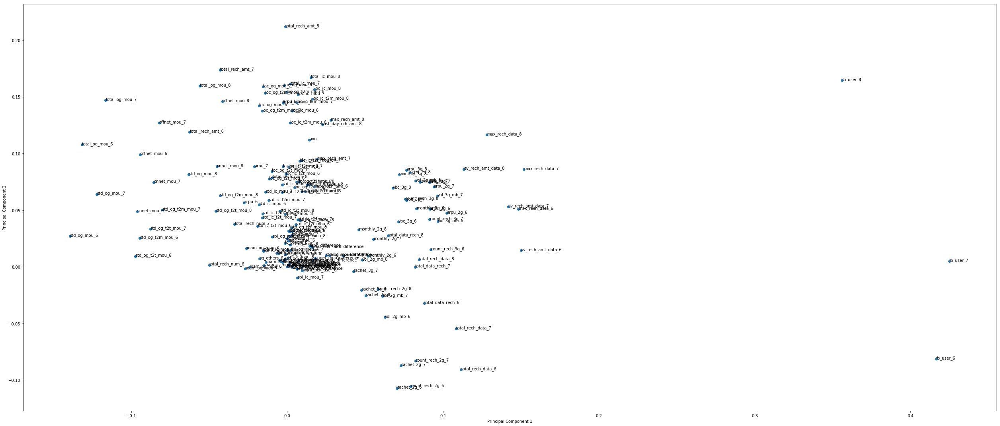

In [119]:
%matplotlib inline
import matplotlib.pyplot as plt
fig = plt.figure(figsize = (35, 15))
plt.scatter(pcs_df.PC1, pcs_df.PC2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
for i, txt in enumerate(pcs_df.Feature):
    plt.annotate(txt, (pcs_df.PC1[i],pcs_df.PC2[i]))
plt.tight_layout()
plt.show()

We see that the fist component is in the direction where the data usage are heavy

And second varibale is in the direction where minutes of usage is heavy

Looking at the screeplot to assess the number of needed principal components

In [120]:
pca.explained_variance_ratio_

array([2.14826341e-01, 9.81344052e-02, 6.35733765e-02, 6.09443585e-02,
       4.11799645e-02, 3.29734137e-02, 2.99366686e-02, 2.87719162e-02,
       2.64771323e-02, 2.51013188e-02, 2.23683407e-02, 1.68025268e-02,
       1.37603732e-02, 1.29160786e-02, 1.25257227e-02, 1.16705186e-02,
       1.12816008e-02, 1.09450990e-02, 1.06400175e-02, 9.86553038e-03,
       9.68617262e-03, 8.82211322e-03, 8.64669392e-03, 8.50353735e-03,
       8.07435227e-03, 7.61866925e-03, 7.47380076e-03, 7.04608758e-03,
       6.87617178e-03, 6.41475907e-03, 6.08222429e-03, 5.54518905e-03,
       5.30734387e-03, 5.07163485e-03, 4.95576319e-03, 4.70942274e-03,
       4.62404862e-03, 4.55054713e-03, 4.29402568e-03, 4.13827864e-03,
       4.04947302e-03, 3.79696782e-03, 3.63659365e-03, 3.51474154e-03,
       3.49919565e-03, 3.38120317e-03, 3.34972424e-03, 3.27098792e-03,
       3.19732979e-03, 3.14734317e-03, 2.98870129e-03, 2.85991384e-03,
       2.82209242e-03, 2.63006716e-03, 2.59464266e-03, 2.49661099e-03,
      

Plotting the cumulative variance against the number of components¶

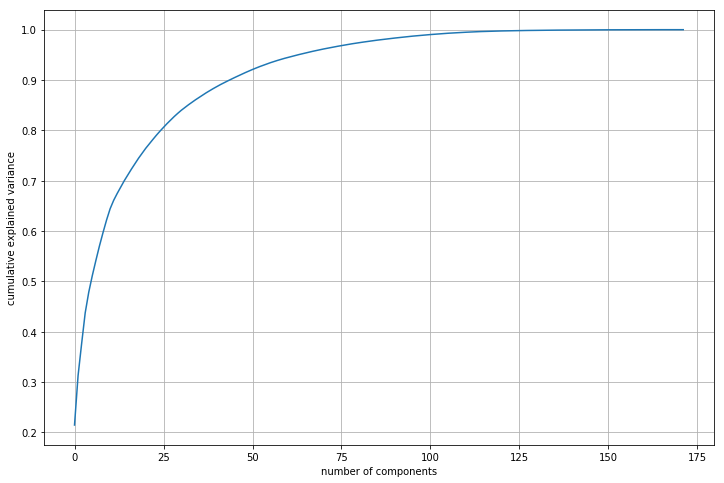

In [121]:
#Making the screeplot - plotting the cumulative variance against the number of components
%matplotlib inline
import matplotlib.pyplot as plt
fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.grid()
plt.show()

### Find the number of components that are enough to describe 90% of the variance in the dataset
- This plot tells us that selecting 45 components we can preserve something around 90% to 90.5% of the total variance of the data. 
- It makes sense, we’ll not use 100% of our variance, because it denotes all components, and we want only the principal ones. So we'll choose 90% of varience for our modeling

Let PCA select the number of components based on a variance cutoff we provide

In [122]:
pca_final = PCA(0.90)
df_train_pca = pca_final.fit_transform(X_train)
print(df_train_pca.shape)
pca_final.components_.shape

(38450, 45)


(45, 172)

Creating correlation matrix for the principal components - we expect little to no correlation

In [123]:
#creating correlation matrix for the principal components
corrmat = np.corrcoef(df_train_pca.transpose())

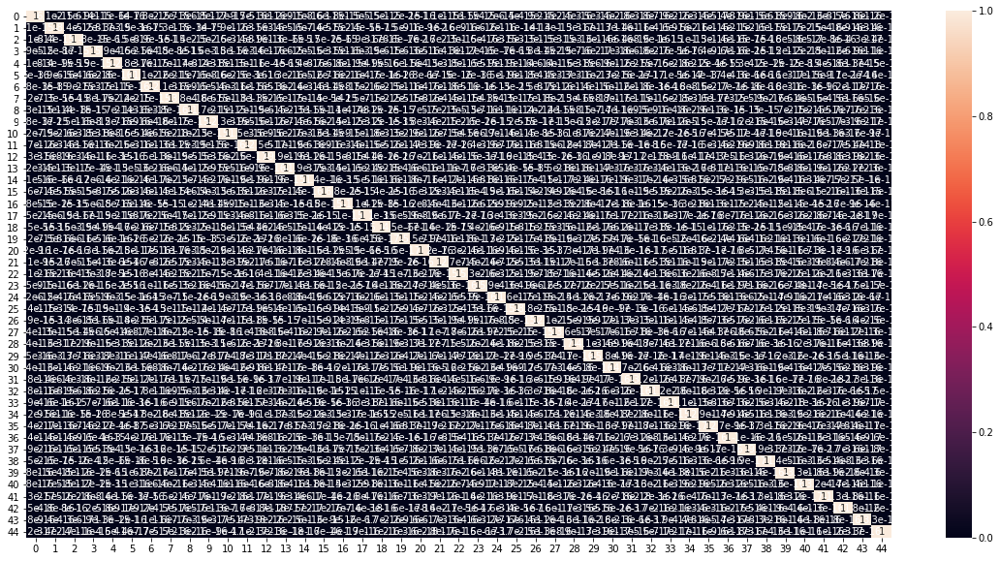

In [124]:
#plotting the correlation matrix
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure(figsize = (20,10))
sns.heatmap(corrmat,annot = True)

In [125]:
# 1s -> 0s in diagonals
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",corrmat_nodiag.max(), ", min corr: ", corrmat_nodiag.min(),)
# we see that correlations are indeed very close to 0

max corr: 1.9242498575538272e-14 , min corr:  -2.1146965418529927e-14


There are no correlation between any two components
- We effectively have removed mu`lticollinearity from our situation, and our models will be much more stable

Applying selected components to the test data

In [126]:
#Applying selected components to the test data - 24 components
df_test_pca = pca_final.transform(X_test)
print('Test Shape = ', df_test_pca.shape)

Test Shape =  (8965, 45)


### Logistic Regression with hyper parameter tuning

Applying a logistic regression on our Principal Components
- We expect to get similar model performance with significantly lower features
- If we can do so, we would have done effective dimensionality reduction without losing any import information

In [127]:
#training the regression model
logreg_pca = LogisticRegression(solver='liblinear')
model_logreg_pca = logreg_pca.fit(df_train_pca,y_train)
model_logreg_pca

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='liblinear',
          tol=0.0001, verbose=0, warm_start=False)

Create Hyperparameter Search Space

In [128]:
# Create regularization penalty space
penalty = ['l1', 'l2']

# Create regularization hyperparameter space
C = np.logspace(0, 4, 10)
C

array([1.00000000e+00, 2.78255940e+00, 7.74263683e+00, 2.15443469e+01,
       5.99484250e+01, 1.66810054e+02, 4.64158883e+02, 1.29154967e+03,
       3.59381366e+03, 1.00000000e+04])

In [129]:
# Create hyperparameter options
hyperparameters = dict(C=C, penalty=penalty)
hyperparameters

{'C': array([1.00000000e+00, 2.78255940e+00, 7.74263683e+00, 2.15443469e+01,
        5.99484250e+01, 1.66810054e+02, 4.64158883e+02, 1.29154967e+03,
        3.59381366e+03, 1.00000000e+04]), 'penalty': ['l1', 'l2']}

Create Grid Search

In [130]:
# Create grid search using 5-fold cross validation
clf = GridSearchCV(logreg_pca, hyperparameters, cv=5, n_jobs = -1, scoring='roc_auc', verbose=0)
clf

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='liblinear',
          tol=0.0001, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'C': array([1.00000e+00, 2.78256e+00, 7.74264e+00, 2.15443e+01, 5.99484e+01,
       1.66810e+02, 4.64159e+02, 1.29155e+03, 3.59381e+03, 1.00000e+04]), 'penalty': ['l1', 'l2']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=0)

Conduct Grid Search

In [131]:
# Fit grid search
best_lr_PCA_model = clf.fit(df_train_pca,y_train)
best_lr_PCA_model

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='liblinear',
          tol=0.0001, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'C': array([1.00000e+00, 2.78256e+00, 7.74264e+00, 2.15443e+01, 5.99484e+01,
       1.66810e+02, 4.64159e+02, 1.29155e+03, 3.59381e+03, 1.00000e+04]), 'penalty': ['l1', 'l2']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=0)

View Hyperparameter Values Of Best Model

In [132]:
# View best hyperparameters
print('Best Penalty:', best_lr_PCA_model.best_estimator_.get_params()['penalty'])
print('Best C:', best_lr_PCA_model.best_estimator_.get_params()['C'])

Best Penalty: l2
Best C: 3593.813663804626


Predict probablity Using Best Model

In [133]:
#Making predict probablity
pred_probs_test = best_lr_PCA_model.predict_proba(df_test_pca)[:,1]
pred_probs_test

array([3.49251314e-02, 9.66796850e-01, 6.93354230e-01, ...,
       7.94844050e-01, 2.73235977e-04, 6.44466554e-01])

Compute Area Under the Receiver Operating Characteristic Curve (ROC AUC) from prediction scores.

In [134]:
roc_auc_score = "{:2.2f}".format(metrics.roc_auc_score(y_test, pred_probs_test))
print('roc_auc_score = ', roc_auc_score)

roc_auc_score =  0.89


visualize the data of features selected by pca to see if we can spot any patterns

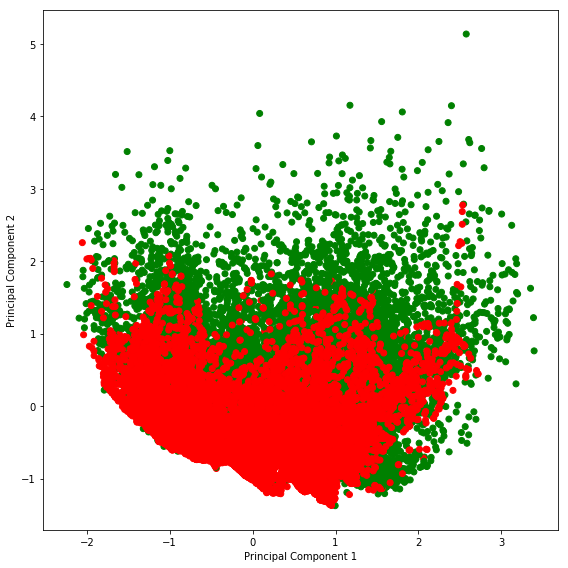

In [135]:
%matplotlib inline
import matplotlib.pyplot as plt
fig = plt.figure(figsize = (8,8))
plt.scatter(df_train_pca[:,0], df_train_pca[:,1], c = y_train.map({0:'green',1:'red'}))
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.tight_layout()
plt.show()
plt.rcdefaults()

Let's look at it in 3D, and we expect spread to be better (dimensions of variance)

matplotlib: 2.2.2


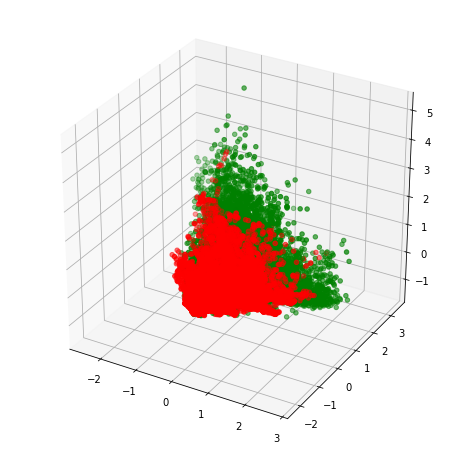

In [136]:
import matplotlib
print('matplotlib: {}'.format(matplotlib.__version__))

%matplotlib inline  
#%matplotlib notebook
import matplotlib.pyplot as plt1

fig = plt1.figure(figsize=(8,8))

# Prior to version 1.0.0, the method of creating a 3D axes was different. 
# For those using older versions of matplotlib, use ax = Axes3D(fig) 
# else use ax = fig.add_subplot(111, projection='3d').
ax = fig.add_subplot(111, projection='3d')
#ax = Axes3D(fig)

ax.scatter(df_train_pca[:,2], df_train_pca[:,0], df_train_pca[:,1], c=y_train.map({0:'green',1:'red'}))
plt1.show()

#### Make Predictions

In [137]:
# Predict target vector
y_pred = best_lr_PCA_model.predict(df_test_pca)
y_pred

array([0, 1, 1, ..., 1, 0, 1], dtype=int64)

In [138]:
# Converting pred_probs_test to a dataframe which is an array
y_pred_df = pd.DataFrame(pred_probs_test)

# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

# Putting Mob_Num_id to index
y_test_df['Mob_Num_id'] = y_test_df.index

# Removing index for both dataframes to append them side by side 
y_pred_df.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df,y_pred_df],axis=1)

# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Prob'})

# Rearranging the columns
y_pred_final = y_pred_final.reindex(['Mob_Num_id','churn','Churn_Prob'], axis=1)

y_pred_final.head()

,Mob_Num_id,churn,Churn_Prob
0,25743,0,0.034925
1,8318,1,0.966797
2,18611,0,0.693354
3,54656,0,0.043488
4,48535,0,0.007693


In [139]:
# Creating new column 'predicted' with 1 if Churn_Prob>0.5 else 0
y_pred_final['predicted'] = y_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_pred_final.head()

,Mob_Num_id,churn,Churn_Prob,predicted
0,25743,0,0.034925,0
1,8318,1,0.966797,1
2,18611,0,0.693354,1
3,54656,0,0.043488,0
4,48535,0,0.007693,0


#### Logistic Regression with PCA Model Evaluation

Note that it is more important to identify churners than the non-churners accurately 
- Choose an appropriate evaluation metric which reflects this business goal.
    - Evaluate the Sensitivity and Specificity,
    - Choose a model which has more sensitivity (Number of actual churns currectly predicted / Total actual churns)

Confusion matrix, accuracy, sensitivity, specificity, false postive rate, positive predictive value, Negative predictive value

In [140]:
compute_and_print_metrics_from_confusion_matrix(y_pred_final.churn, y_pred_final.predicted)

Confusion matrix
[[6906 1336]
 [ 138  585]]

Overall accuracy =  0.8355828220858895
True positive = 585, true negatives = 6906, false positives = 1336, false negatives = 138

Sensitivity =  0.8091286307053942
specificity =  0.837903421499636

False postive rate =  0.162096578500364
positive predictive value =  0.3045288912024987
Negative predictive value =  0.9804088586030665


#### Precision, Recall and F1-Score
- Precision is the fraction of correctly predicted positives out of all predicted positives, i.e. it measures 'out of all those the model has predicted to be positive, how many are correct'. It differs from sensitivity only in the denominator.
- Recall is the same as sensitivity, and is commonly used along with precision.
- F1-score is a measure that combines both precision and recall. It is the harmonic mean of precision and recall

In [141]:
print(classification_report( y_pred_final.churn, y_pred_final.predicted ))

              precision    recall  f1-score   support

           0       0.98      0.84      0.90      8242
           1       0.30      0.81      0.44       723

   micro avg       0.84      0.84      0.84      8965
   macro avg       0.64      0.82      0.67      8965
weighted avg       0.93      0.84      0.87      8965



#### ROC Curve

An ROC curve demonstrates several things:

- It shows the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in specificity).
- The closer the curve follows the left-hand border and then the top border of the ROC space, the more accurate the test.
- The closer the curve comes to the 45-degree diagonal of the ROC space, the less accurate the test.

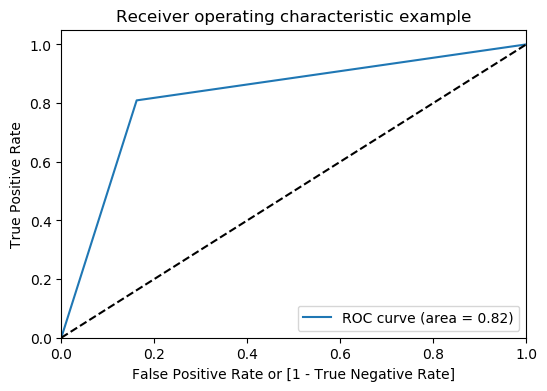

(array([0.        , 0.16209658, 1.        ]),
 array([0.        , 0.80912863, 1.        ]),
 array([2, 1, 0], dtype=int64))

In [142]:
draw_roc(y_pred_final.churn, y_pred_final.predicted)

#### Finding Optimal Cutoff Point

Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

In [143]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_pred_final[i]= y_pred_final.Churn_Prob.map( lambda x: 1 if x > i else 0)
y_pred_final.head()

,Mob_Num_id,churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,25743,0,0.034925,0,1,0,0,0,0,0,0,0,0,0
1,8318,1,0.966797,1,1,1,1,1,1,1,1,1,1,1
2,18611,0,0.693354,1,1,1,1,1,1,1,1,0,0,0
3,54656,0,0.043488,0,1,0,0,0,0,0,0,0,0,0
4,48535,0,0.007693,0,1,0,0,0,0,0,0,0,0,0


     prob  accuracy     sensi     speci
0.0   0.0  0.080647  1.000000  0.000000
0.1   0.1  0.476631  0.954357  0.434725
0.2   0.2  0.619297  0.925311  0.592453
0.3   0.3  0.714557  0.881051  0.699951
0.4   0.4  0.779699  0.840941  0.774327
0.5   0.5  0.835583  0.809129  0.837903
0.6   0.6  0.877412  0.753804  0.888255
0.7   0.7  0.904071  0.692946  0.922592
0.8   0.8  0.921026  0.591978  0.949891
0.9   0.9  0.928277  0.359613  0.978161


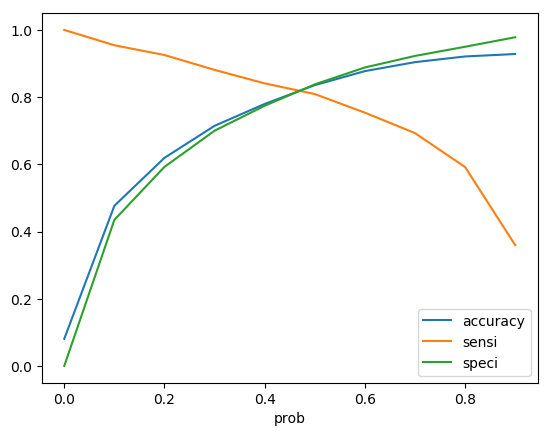

In [144]:
probability_cutoffs( y_pred_final.churn, y_pred_final )

- From the curve and table above, 0.5 is the optimum point 
- But we need to tune out model for optimum sensitivity as the business rule says 
    - "It is more important to identify churners than the non-churners accurately"

#### Since we are tuning our model for more sensitivity we will take 0.3 as the cutoff for 88% sensitivity

In [145]:
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.3 else 0)
y_pred_final.head(20)

,Mob_Num_id,churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,25743,0,0.034925,0,1,0,0,0,0,0,0,0,0,0,0
1,8318,1,0.966797,1,1,1,1,1,1,1,1,1,1,1,1
2,18611,0,0.693354,1,1,1,1,1,1,1,1,0,0,0,1
3,54656,0,0.043488,0,1,0,0,0,0,0,0,0,0,0,0
4,48535,0,0.007693,0,1,0,0,0,0,0,0,0,0,0,0
5,73394,0,0.055510,0,1,0,0,0,0,0,0,0,0,0,0
6,58177,0,0.541521,1,1,1,1,1,1,1,0,0,0,0,1
7,83589,0,0.067892,0,1,0,0,0,0,0,0,0,0,0,0
8,3390,0,0.214694,0,1,1,1,0,0,0,0,0,0,0,0
9,67629,0,0.065902,0,1,0,0,0,0,0,0,0,0,0,0


In [146]:
#Let's check the overall accuracy.
metrics.accuracy_score( y_pred_final.churn, y_pred_final.final_predicted)

0.7145566090351366

In [147]:
metrics.confusion_matrix( y_pred_final.churn, y_pred_final.final_predicted )

array([[5769, 2473],
       [  86,  637]], dtype=int64)

#### Precision, Recall and F1-Score

In [148]:
print(classification_report(y_pred_final.churn, y_pred_final.final_predicted))

              precision    recall  f1-score   support

           0       0.99      0.70      0.82      8242
           1       0.20      0.88      0.33       723

   micro avg       0.71      0.71      0.71      8965
   macro avg       0.60      0.79      0.58      8965
weighted avg       0.92      0.71      0.78      8965



#### Evaluating Error Terms

Let's now evaluate the model in terms of its assumptions. We should test that:

- The error terms are normally distributed with mean approximately 0
- There is little correlation between the predictors
- Homoscedasticity, i.e. the 'spread' or 'variance' of the error term (y_true-y_pred) is constant

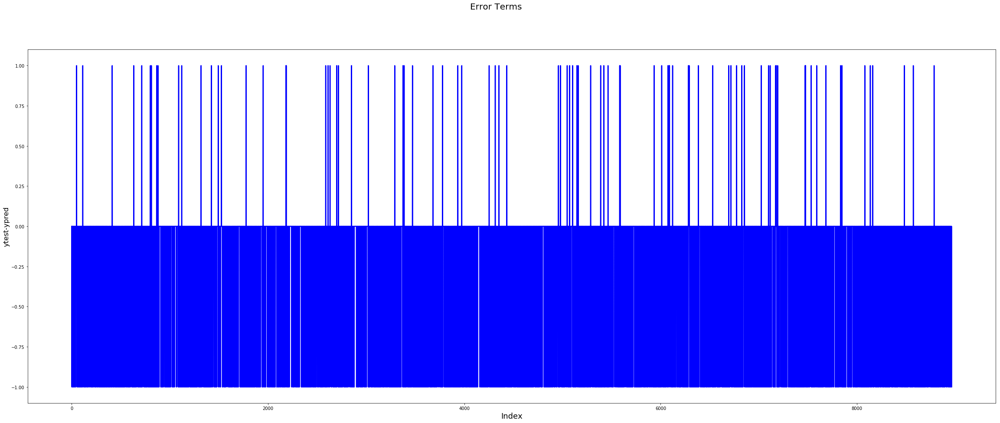

In [149]:
%matplotlib inline
import matplotlib.pyplot as plt
# Error terms
c = [i for i in range(len(y_pred_final.final_predicted))]
fig = plt.figure(figsize=(40, 15))
plt.plot(c, y_pred_final.churn-y_pred_final.final_predicted, color="blue", linewidth=2.5, linestyle="-")
fig.suptitle('Error Terms', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=18)                      # X-label
plt.ylabel('ytest-ypred', fontsize=16)                # Y-label
plt.show()

C:\Users\lenovo\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


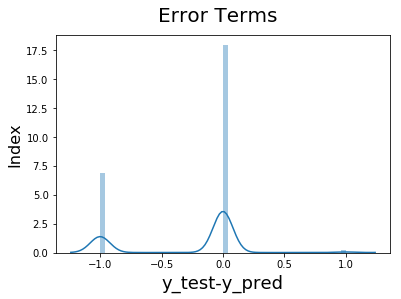

In [150]:
%matplotlib inline
import matplotlib.pyplot as plt
# Plotting the error terms to understand the distribution.
fig = plt.figure()
sns.distplot((y_pred_final.churn-y_pred_final.final_predicted),bins=50)
fig.suptitle('Error Terms', fontsize=20)                  # Plot heading 
plt.xlabel('y_test-y_pred', fontsize=18)                  # X-label
plt.ylabel('Index', fontsize=16)                          # Y-label
plt.show()

In [151]:
# mean
np.mean(y_pred_final.churn-y_pred_final.final_predicted)

-0.26625766871165646

##### Infrence for Logisitc Regression with PCA
With Logistic Regression using PCA we are getting a model with 88% Senstivity/Recall and Mean error is -0.26 which pretty good now lets evaluate other models

### Convert PCA result data set to data frame

In [152]:
pca_test = pd.DataFrame(df_test_pca)
pca_train = pd.DataFrame(df_train_pca)

print(pca_train.shape)
print(pca_test.shape)

pca_train.head()

(38450, 45)
(8965, 45)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44
0,1.454032,0.521338,-0.546424,-0.016156,-0.111640,-0.209045,-0.224879,-0.079251,-0.211397,0.003389,0.282564,-0.149913,-0.240525,-0.184153,-0.009657,-0.025526,-0.347486,-0.016222,-0.181137,0.332303,-0.282120,-0.100984,0.142106,-0.145753,0.040169,0.094739,0.004414,-0.046812,0.008730,0.292042,0.005696,0.009733,-0.371462,0.028992,-0.138170,-0.107124,-0.030095,-0.070992,-0.047394,-0.036027,-0.126084,-0.063269,-0.311301,0.070658,-0.193008
1,1.361336,1.000979,-0.478386,-0.259129,0.012716,-0.316728,-0.080981,-0.097826,-0.211821,-0.226706,-0.125606,0.295666,-0.110175,0.194464,0.262209,0.134599,-0.227535,-0.201915,-0.308842,0.275676,0.065508,-0.251971,0.381008,-0.297933,0.272416,-0.001405,0.049740,-0.117004,0.000760,-0.195582,0.215978,0.129275,-0.029832,-0.053772,-0.064202,0.282414,0.162125,-0.663220,-0.031021,0.119185,0.154323,0.011083,-0.024668,-0.158591,0.142305
2,-0.981209,1.651471,0.217703,-0.765592,0.083028,-0.249982,0.053458,0.288010,0.408562,0.126868,0.348269,0.668618,0.304678,0.126105,0.362549,0.198787,0.145708,-0.132797,-0.080052,-0.797563,-0.266942,-0.148858,0.198633,0.095333,0.060693,-0.109574,0.052538,-0.186749,0.036425,-0.919640,0.029401,-0.212461,-0.506932,-0.360238,0.152393,-0.151746,0.019050,-0.244541,0.351331,-0.167440,0.124751,-0.164547,-0.033724,0.082015,-0.127145
3,-1.523620,1.079454,0.392803,1.130481,0.128616,-0.544772,-0.094827,0.199478,0.353947,-0.387634,-0.193670,0.278397,0.014457,0.011516,0.014243,0.079897,-0.030136,0.142267,-0.115141,-0.202115,-0.045162,0.144990,-0.236767,0.090173,-0.179916,0.170408,-0.162027,-0.136054,0.262158,0.004546,-0.010453,-0.130030,0.289061,0.023250,-0.216028,-0.056084,-0.202559,-0.013935,0.142739,0.284552,0.097315,0.164698,0.002046,0.094069,-0.040659
4,1.104793,0.832780,0.183809,-0.367782,0.025204,-0.009389,0.001514,0.002629,-0.127226,-0.261270,-0.238943,0.281168,0.172506,0.569279,0.361232,0.214453,0.038192,-0.003009,-0.128879,-0.244849,0.170789,-0.201914,0.262254,-0.126988,-0.081630,0.006697,-0.055285,-0.071470,-0.060990,-0.340446,0.071178,0.113160,0.000614,-0.066292,-0.038512,0.353048,0.262937,-0.586436,0.197032,0.038084,0.109885,-0.021202,-0.089651,-0.085440,0.039412


### Decision Tree 

With Default parameters

In [153]:
# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
dt_default = DecisionTreeClassifier(max_depth=5)
dt_default.fit(pca_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

Check the evaluation metrics of our default model

In [154]:
# Making predictions
y_pred_default_dt = dt_default.predict(pca_test)

compute_and_print_metrics_from_confusion_matrix(y_test, y_pred_default_dt)
print(classification_report(y_test, y_pred_default_dt))

Confusion matrix
[[6292 1950]
 [ 179  544]]

Overall accuracy =  0.762520914668154
True positive = 544, true negatives = 6292, false positives = 1950, false negatives = 179

Sensitivity =  0.7524204702627939
specificity =  0.7634069400630915

False postive rate =  0.23659305993690852
positive predictive value =  0.2181234963913392
Negative predictive value =  0.9723381239375676
              precision    recall  f1-score   support

           0       0.97      0.76      0.86      8242
           1       0.22      0.75      0.34       723

   micro avg       0.76      0.76      0.76      8965
   macro avg       0.60      0.76      0.60      8965
weighted avg       0.91      0.76      0.81      8965



Even though we had good accuracy the recall / sensitivity score for default params is low so lets tune the hyperparameters with recall as scoring.

#### Grid Search to Find Optimal Hyperparameters

We can now use GridSearchCV to find multiple optimal hyperparameters together. Note that this time, we'll also specify the criterion (gini/entropy).

In [155]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 17, 2),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search_dt = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                              cv = 4, verbose = 1, scoring='roc_auc', n_jobs = -1, return_train_score=True)

# Fit the grid search to the data
grid_search_dt.fit(pca_train,y_train)

Fitting 4 folds for each of 48 candidates, totalling 192 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   45.8s
[Parallel(n_jobs=-1)]: Done 192 out of 192 | elapsed:  3.0min finished


GridSearchCV(cv=4, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': range(5, 17, 2), 'min_samples_leaf': range(50, 150, 50), 'min_samples_split': range(50, 150, 50), 'criterion': ['entropy', 'gini']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='roc_auc', verbose=1)

In [156]:
# cv results
cv_results = pd.DataFrame(grid_search_dt.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,3.334195,0.019577,0.018239,5.535207e-03,entropy,5,50,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.853627,0.866934,0.861149,0.852505,0.858554,0.005870,41,0.869461,0.865017,0.864874,0.867304,0.866664,0.001881
1,3.136316,0.019930,0.013742,2.276527e-03,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.853627,0.866934,0.861149,0.852505,0.858554,0.005870,41,0.869461,0.865017,0.864874,0.867304,0.866664,0.001881
2,3.075104,0.008452,0.013242,1.918494e-03,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.851897,0.865806,0.860374,0.851858,0.857483,0.005926,43,0.868360,0.864429,0.863668,0.866441,0.865724,0.001828
3,3.548563,0.016655,0.013992,1.730962e-03,entropy,5,100,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.851897,0.865806,0.860374,0.851858,0.857483,0.005926,43,0.868360,0.864429,0.863668,0.866441,0.865724,0.001828
4,4.349320,0.038667,0.012243,4.330846e-04,entropy,7,50,50,"{'criterion': 'entropy', 'max_depth': 7, 'min_...",0.883075,0.893055,0.892813,0.882931,0.887969,0.004967,34,0.905205,0.901249,0.903798,0.904442,0.903673,0.001486
5,4.213904,0.017026,0.013494,1.118193e-03,entropy,7,50,100,"{'criterion': 'entropy', 'max_depth': 7, 'min_...",0.883023,0.893088,0.892762,0.883018,0.887972,0.004954,33,0.905205,0.901249,0.903798,0.904442,0.903673,0.001486
6,3.988042,0.020609,0.012493,8.661347e-04,entropy,7,100,50,"{'criterion': 'entropy', 'max_depth': 7, 'min_...",0.879039,0.890091,0.887185,0.880242,0.884139,0.004634,39,0.901034,0.898040,0.898527,0.901289,0.899722,0.001452
7,3.999037,0.009598,0.011993,7.072242e-04,entropy,7,100,100,"{'criterion': 'entropy', 'max_depth': 7, 'min_...",0.878760,0.890116,0.887211,0.880273,0.884090,0.004718,40,0.901034,0.898040,0.898527,0.901289,0.899722,0.001452
8,4.916472,0.023537,0.012243,4.337728e-04,entropy,9,50,50,"{'criterion': 'entropy', 'max_depth': 9, 'min_...",0.899008,0.909442,0.906996,0.900565,0.904003,0.004339,14,0.930992,0.928162,0.927595,0.928923,0.928918,0.001287
9,5.873382,0.049037,0.012493,5.003227e-04,entropy,9,50,100,"{'criterion': 'entropy', 'max_depth': 9, 'min_...",0.899645,0.909418,0.907068,0.900316,0.904112,0.004221,13,0.930854,0.928162,0.927595,0.928923,0.928884,0.001232


In [157]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy = ", grid_search_dt.best_score_)
print("\nbest_estimator = ", grid_search_dt.best_estimator_)

best accuracy =  0.9133067189220359

best_estimator =  DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=15,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=100,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


In [158]:
cv_results[cv_results.mean_test_score > 0.85][['param_max_depth','mean_test_score']]

,param_max_depth,mean_test_score
0,5,0.858554
1,5,0.858554
2,5,0.857483
3,5,0.857483
4,7,0.887969
5,7,0.887972
6,7,0.884139
7,7,0.884090
8,9,0.904003
9,9,0.904112


As we can see though the best score for recall comes with max_depth of 15 ,the recall score improvement is very minimal from depth 9 to 15.So we think its better to go with 9 as it decreases the complexity hence overfitting of the model quite a bit.

Running the model with best parameters obtained from grid search.

In [159]:
# model with optimal hyperparameters
clf_entropy = DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=9,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
clf_entropy.fit(pca_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=9,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

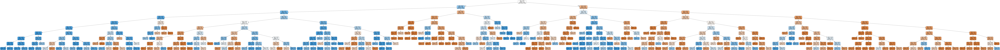

In [160]:
# Importing required packages for visualization
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz
import os

# If you're on windows:
# Specifing path for dot file.
if os.sys.platform == 'win32':
    if 'PROGRAMFILES' in os.environ:
        # os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/graphviz-2.38/release/bin/'
        os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/'
    else:
        os.environ["PATH"] += os.pathsep + "C:/Program Files/Graphviz2.38/bin/"

# plotting the tree
dot_data = StringIO()
export_graphviz(clf_entropy, out_file=dot_data,filled=True,rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [161]:
# Making predictions
y_pred_dt = clf_entropy.predict(pca_test)

In [162]:
compute_and_print_metrics_from_confusion_matrix(y_test,y_pred_dt)

# classification metrics
print(classification_report(y_test, y_pred_dt))

Confusion matrix
[[6782 1460]
 [ 202  521]]

Overall accuracy =  0.8146123814835471
True positive = 521, true negatives = 6782, false positives = 1460, false negatives = 202

Sensitivity =  0.7206085753803596
specificity =  0.8228585294831352

False postive rate =  0.17714147051686485
positive predictive value =  0.2629984856133266
Negative predictive value =  0.9710767468499427
              precision    recall  f1-score   support

           0       0.97      0.82      0.89      8242
           1       0.26      0.72      0.39       723

   micro avg       0.81      0.81      0.81      8965
   macro avg       0.62      0.77      0.64      8965
weighted avg       0.91      0.81      0.85      8965



#### Evaluating Error Terms

Let's now evaluate the model in terms of its assumptions. We should test that:

- The error terms are normally distributed with mean approximately 0
- There is little correlation between the predictors
- Homoscedasticity, i.e. the 'spread' or 'variance' of the error term (y_true-y_pred) is constant

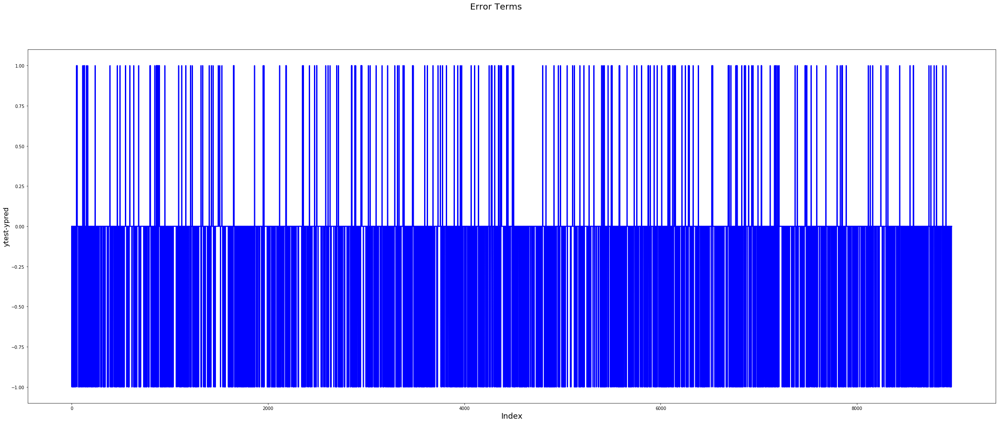

In [163]:
%matplotlib inline
import matplotlib.pyplot as plt
# Error terms
c = [i for i in range(len(y_pred_dt))]
fig = plt.figure(figsize=(40, 15))
plt.plot(c, y_test-y_pred_dt, color="blue", linewidth=2.5, linestyle="-")
fig.suptitle('Error Terms', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=18)                      # X-label
plt.ylabel('ytest-ypred', fontsize=16)                # Y-label
plt.show()

C:\Users\lenovo\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


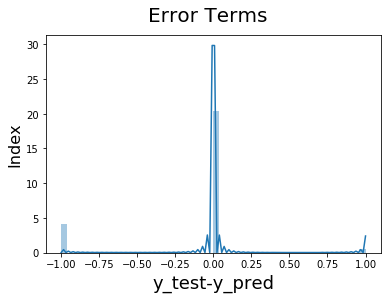

In [164]:
%matplotlib inline
import matplotlib.pyplot as plt
# Plotting the error terms to understand the distribution.
fig = plt.figure()
sns.distplot((y_test-y_pred_dt),bins=50)
fig.suptitle('Error Terms', fontsize=20)                  # Plot heading 
plt.xlabel('y_test-y_pred', fontsize=18)                  # X-label
plt.ylabel('Index', fontsize=16)                          # Y-label
plt.show()

In [165]:
# mean
np.mean(y_test-y_pred_dt)

-0.1403234802007808

##### Infrence for Decision Tree with PCA
With Decision Tree using PCA we are getting a model with 72% Senstivity/Recall which is low as compared to Logistic Regression model above

### Random Forest

Let's first fit a random forest model with default hyperparameters.

In [166]:
# Running the random forest with default parameters.
rfc = RandomForestClassifier()
# fit
rfc.fit(pca_train,y_train)

C:\Users\lenovo\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:248: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [167]:
# Making predictions
rfc_predictions = rfc.predict(pca_test)

In [168]:
compute_and_print_metrics_from_confusion_matrix(y_test, rfc_predictions)
print(classification_report(y_test, rfc_predictions))

Confusion matrix
[[7823  419]
 [ 411  312]]

Overall accuracy =  0.9074177356385945
True positive = 312, true negatives = 7823, false positives = 419, false negatives = 411

Sensitivity =  0.4315352697095436
specificity =  0.9491628245571463

False postive rate =  0.050837175442853676
positive predictive value =  0.426812585499316
Negative predictive value =  0.9500850133592421
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      8242
           1       0.43      0.43      0.43       723

   micro avg       0.91      0.91      0.91      8965
   macro avg       0.69      0.69      0.69      8965
weighted avg       0.91      0.91      0.91      8965



Even though we had good accuracy the recall / sensitivity score for default params is low so lets tune the hyperparameters with recall as scoring.

#### Tuning max_depth

Let's try to find the optimum values for max_depth and understand how the value of max_depth impacts the overall accuracy of the ensemble.

In [169]:
# GridSearchCV to find optimal n_estimators
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# parameters to build the model on
parameters = {'n_estimators': [10], 'max_depth': range(2, 20, 5)}

# instantiate the model
rf = RandomForestClassifier()

# fit tree on training data
rf = GridSearchCV(rf, parameters, cv=4, n_jobs = -1, scoring="roc_auc", return_train_score=True)
rf.fit(pca_train, y_train)

GridSearchCV(cv=4, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'n_estimators': [10], 'max_depth': range(2, 20, 5)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='roc_auc', verbose=0)

In [170]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,1.034611,0.047075,0.027734,0.001919,2,10,"{'max_depth': 2, 'n_estimators': 10}",0.810603,0.840743,0.830469,0.842425,0.831059,0.012667,4,0.818925,0.834563,0.833438,0.846705,0.833408,0.009847
1,2.363043,0.280980,0.065461,0.035745,7,10,"{'max_depth': 7, 'n_estimators': 10}",0.907227,0.915989,0.916463,0.914682,0.913590,0.003732,3,0.927657,0.923318,0.929909,0.929506,0.927598,0.002613
2,3.116080,0.250912,0.079702,0.017487,12,10,"{'max_depth': 12, 'n_estimators': 10}",0.959061,0.962451,0.962561,0.959592,0.960916,0.001601,2,0.982502,0.984690,0.983737,0.984265,0.983799,0.000821
3,3.344462,0.207028,0.081701,0.024239,17,10,"{'max_depth': 17, 'n_estimators': 10}",0.976092,0.979319,0.976222,0.976141,0.976943,0.001372,1,0.997276,0.997647,0.997250,0.997783,0.997489,0.000231


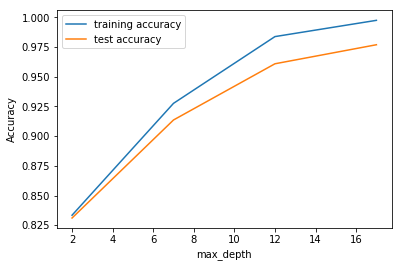

In [171]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

You can see that as we increase the value of max_depth, both train and test scores increase till 6 after that increase is marginal

We can use the range 4 to 6 as optimal value.

In [172]:
max_depth = range(4, 6, 1)
max_depth

range(4, 6)

#### Tuning n_estimators
Let's try to find the optimum values for n_estimators and understand how the value of n_estimators impacts the overall accuracy. Notice that we'll specify an appropriately low value of max_depth, so that the trees do not overfit. 

In [173]:
# parameters to build the model on
parameters = {'n_estimators': range(100, 700, 200)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(max_depth=3)

# fit tree on training data
rf = GridSearchCV(rf, parameters, cv=4, n_jobs = -1, scoring="roc_auc", return_train_score=True)
rf.fit(pca_train, y_train)

GridSearchCV(cv=4, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=3, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'n_estimators': range(100, 700, 200)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='roc_auc', verbose=0)

In [174]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,10.424329,0.499646,0.273083,0.069442,100,{'n_estimators': 100},0.866686,0.884551,0.879669,0.874578,0.876371,0.006611,3,0.881186,0.879524,0.880235,0.880530,0.880369,0.000597
1,28.551169,0.749601,0.807754,0.273462,300,{'n_estimators': 300},0.869693,0.882845,0.880977,0.873886,0.876850,0.005315,2,0.884006,0.878478,0.881327,0.879470,0.880821,0.002105
2,48.977839,0.947151,1.316941,0.489010,500,{'n_estimators': 500},0.871231,0.883262,0.879964,0.876654,0.877777,0.004443,1,0.885234,0.878795,0.880185,0.882502,0.881679,0.002443


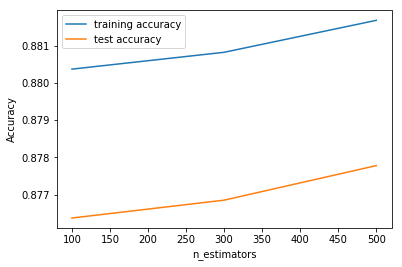

In [175]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

You can see that as we increase the value of n_estimators, both train and test scores increase till 300 after that both test and trian score increases marginally.

We can use 100 to 300.

In [176]:
n_estimators = [100, 300]

#### Tuning max_features
Let's see how the model performance varies with max_features, which is the maximum numbre of features considered for splitting at a node.

In [177]:
# parameters to build the model on
parameters = {'n_estimators': [10], 'max_features': [3, 5, 7, 9, 11, 13]}

# instantiate the model
rf = RandomForestClassifier(max_depth=4)

# fit tree on training data
rf = GridSearchCV(rf, parameters, cv=4, n_jobs = -1, scoring="roc_auc", return_train_score=True)
rf.fit(pca_train, y_train)

GridSearchCV(cv=4, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=4, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'n_estimators': [10], 'max_features': [3, 5, 7, 9, 11, 13]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='roc_auc', verbose=0)

In [178]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,0.777770,0.250106,0.027233,0.000431,3,10,"{'max_features': 3, 'n_estimators': 10}",0.853116,0.864556,0.870861,0.860641,0.862293,0.006432,6,0.871823,0.861429,0.870233,0.865343,0.867207,0.004103
1,1.241982,0.123490,0.040476,0.022240,5,10,"{'max_features': 5, 'n_estimators': 10}",0.865242,0.874163,0.872975,0.856800,0.867295,0.006960,5,0.879440,0.871169,0.874713,0.864425,0.872437,0.005478
2,1.468594,0.037902,0.027484,0.000500,7,10,"{'max_features': 7, 'n_estimators': 10}",0.863771,0.880605,0.876739,0.868394,0.872377,0.006645,4,0.876872,0.878268,0.877819,0.874024,0.876746,0.001650
3,1.981277,0.197937,0.044973,0.030583,9,10,"{'max_features': 9, 'n_estimators': 10}",0.866357,0.884731,0.873263,0.869638,0.873497,0.006931,2,0.878795,0.881626,0.876420,0.878820,0.878915,0.001844
4,2.408264,0.088458,0.038227,0.018901,11,10,"{'max_features': 11, 'n_estimators': 10}",0.868134,0.879105,0.876004,0.870721,0.873491,0.004307,3,0.878948,0.875624,0.879162,0.879822,0.878389,0.001628


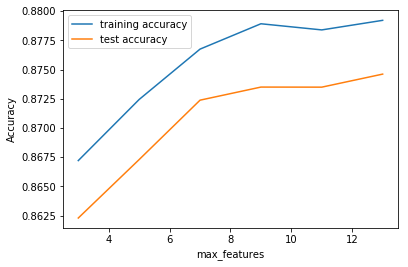

In [179]:
# plotting accuracies with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

Apparently, the training and test scores both seem to increase till 5, and then decerase.

In [180]:
max_features = [4, 5, 6]

#### Tuning min_samples_leaf

Check the optimum value for min samples leaf in our case

The hyperparameter **min_samples_leaf** is the minimum number of samples required to be at a leaf node:
- If int, then consider min_samples_leaf as the minimum number.
- If float, then min_samples_leaf is a percentage and ceil(min_samples_leaf * n_samples) are the minimum number of samples for each node.

In [181]:
# parameters to build the model on
parameters = {'n_estimators': [10], 'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier()

# fit tree on training data
rf = GridSearchCV(rf, parameters, cv=4, n_jobs = -1, scoring="roc_auc", return_train_score=True)
rf.fit(pca_train, y_train)

GridSearchCV(cv=4, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'n_estimators': [10], 'min_samples_leaf': range(100, 400, 50)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='roc_auc', verbose=0)

In [182]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,2.710079,0.590018,0.069708,0.024757,100,10,"{'min_samples_leaf': 100, 'n_estimators': 10}",0.916016,0.926904,0.923673,0.920578,0.921793,0.004016,1,0.936153,0.932978,0.935147,0.936074,0.935088,0.001281
1,2.078217,0.123827,0.069958,0.024048,150,10,"{'min_samples_leaf': 150, 'n_estimators': 10}",0.906614,0.916403,0.913437,0.912401,0.912213,0.003551,2,0.925219,0.919149,0.922077,0.924601,0.922762,0.002395
2,2.166414,0.172428,0.070208,0.021134,200,10,"{'min_samples_leaf': 200, 'n_estimators': 10}",0.900665,0.912566,0.905673,0.904158,0.905766,0.004326,3,0.918217,0.915878,0.915004,0.914234,0.915833,0.001494
3,1.969284,0.031002,0.064712,0.021426,250,10,"{'min_samples_leaf': 250, 'n_estimators': 10}",0.894488,0.904946,0.903827,0.898866,0.900531,0.004173,4,0.912383,0.905447,0.910095,0.908211,0.909034,0.002544
4,1.863850,0.233966,0.066961,0.020928,300,10,"{'min_samples_leaf': 300, 'n_estimators': 10}",0.887273,0.905271,0.895358,0.891211,0.894778,0.006699,5,0.904496,0.905787,0.900061,0.900333,0.902669,0.002516


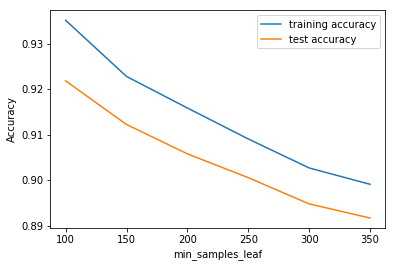

In [183]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

We can use the range 100 to 150 for  min_samples_leaf.

In [184]:
min_samples_leaf = range(100, 150, 50)

#### Tuning min_samples_split
Let's now look at the performance of the ensemble as we vary min_samples_split.

In [185]:
# parameters to build the model on
parameters = {'n_estimators': [10], 'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier()

# fit tree on training data
rf = GridSearchCV(rf, parameters, cv=4, n_jobs = -1, scoring="roc_auc", return_train_score=True)
rf.fit(pca_train, y_train)

GridSearchCV(cv=4, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'n_estimators': [10], 'min_samples_split': range(200, 500, 50)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='roc_auc', verbose=0)

In [186]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,3.780420,0.165510,0.049720,0.003559,200,10,"{'min_samples_split': 200, 'n_estimators': 10}",0.931070,0.941499,0.938757,0.936403,0.936932,0.003835,1,0.959078,0.957079,0.956235,0.957297,0.957422,0.001035
1,3.282976,0.291711,0.071457,0.014456,250,10,"{'min_samples_split': 250, 'n_estimators': 10}",0.923470,0.937657,0.935371,0.928671,0.931292,0.005595,2,0.951536,0.949543,0.950019,0.949091,0.950047,0.000920
2,3.002898,0.380528,0.078953,0.007806,300,10,"{'min_samples_split': 300, 'n_estimators': 10}",0.918630,0.933049,0.930097,0.928856,0.927658,0.005431,3,0.946382,0.944992,0.945337,0.946248,0.945740,0.000590
3,3.036627,0.035110,0.077204,0.013710,350,10,"{'min_samples_split': 350, 'n_estimators': 10}",0.918894,0.930707,0.924807,0.922159,0.924142,0.004331,4,0.941821,0.939218,0.939425,0.939070,0.939884,0.001126
4,3.141813,0.167079,0.078453,0.004029,400,10,"{'min_samples_split': 400, 'n_estimators': 10}",0.913264,0.923873,0.923427,0.921101,0.920416,0.004262,5,0.937185,0.931877,0.935119,0.935401,0.934896,0.001915


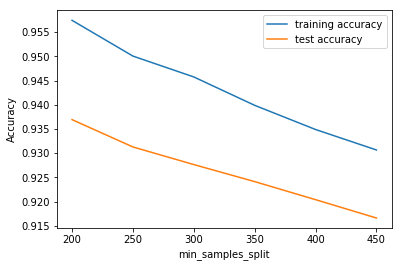

In [187]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

We can use 400 to 450 as the range

In [188]:
min_samples_split = range(400, 450, 50)

#### Grid Search to find Optimal Hyperparameters

In [189]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': max_depth,
    'min_samples_leaf': min_samples_leaf,
    'min_samples_split': min_samples_split,
    'n_estimators': n_estimators,
    'max_features': max_features
}

print(param_grid)

{'max_depth': range(4, 6), 'min_samples_leaf': range(100, 150, 50), 'min_samples_split': range(400, 450, 50), 'n_estimators': [100, 300], 'max_features': [4, 5, 6]}


In [190]:
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search_rfc = GridSearchCV(estimator = rf, param_grid = param_grid, 
                               cv = 4, n_jobs = -1, verbose = 1, scoring='roc_auc')

In [191]:
# Fit the grid search to the data
grid_search_rfc.fit(pca_train, y_train)

Fitting 4 folds for each of 12 candidates, totalling 48 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 out of  48 | elapsed:  4.9min finished


GridSearchCV(cv=4, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': range(4, 6), 'min_samples_leaf': range(100, 150, 50), 'min_samples_split': range(400, 450, 50), 'n_estimators': [100, 300], 'max_features': [4, 5, 6]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=1)

In [192]:
# printing the optimal accuracy score and hyperparameters
print(f'Accuracy = {grid_search_rfc.best_score_}\n')
print('Best Params')
print(grid_search_rfc.best_params_)

Accuracy = 0.8997489247627878

Best Params
{'max_depth': 5, 'max_features': 4, 'min_samples_leaf': 100, 'min_samples_split': 400, 'n_estimators': 300}


Fitting the final model with the best parameters for recall / sensitivity obtained from grid search.

In [193]:
# model with the best hyperparameters
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=4,
                             min_samples_leaf=150, 
                             min_samples_split=350,
                             max_features=5,
                             n_estimators=50)

In [194]:
# fit
rfc.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=4, max_features=5, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=150, min_samples_split=350,
            min_weight_fraction_leaf=0.0, n_estimators=50, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [195]:
# predict
predictions = rfc.predict(X_test)

In [196]:
compute_and_print_metrics_from_confusion_matrix(y_test, predictions)
print(classification_report(y_test, predictions))

Confusion matrix
[[7481  761]
 [ 181  542]]

Overall accuracy =  0.8949247071946459
True positive = 542, true negatives = 7481, false positives = 761, false negatives = 181

Sensitivity =  0.7496542185338866
specificity =  0.9076680417374424

False postive rate =  0.09233195826255763
positive predictive value =  0.41596316193399846
Negative predictive value =  0.9763769250848342
              precision    recall  f1-score   support

           0       0.98      0.91      0.94      8242
           1       0.42      0.75      0.54       723

   micro avg       0.89      0.89      0.89      8965
   macro avg       0.70      0.83      0.74      8965
weighted avg       0.93      0.89      0.91      8965



#### Evaluating Error Terms

Let's now evaluate the model in terms of its assumptions. We should test that:

- The error terms are normally distributed with mean approximately 0
- There is little correlation between the predictors
- Homoscedasticity, i.e. the 'spread' or 'variance' of the error term (y_true-y_pred) is constant

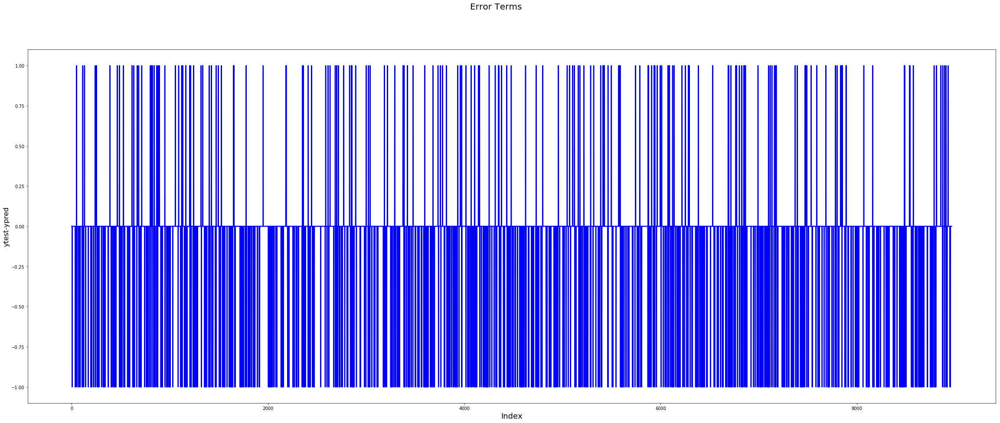

In [197]:
%matplotlib inline
import matplotlib.pyplot as plt
# Error terms
c = [i for i in range(len(predictions))]
fig = plt.figure(figsize=(40, 15))
plt.plot(c, y_test-predictions, color="blue", linewidth=2.5, linestyle="-")
fig.suptitle('Error Terms', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=18)                      # X-label
plt.ylabel('ytest-ypred', fontsize=16)                # Y-label
plt.show()

C:\Users\lenovo\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


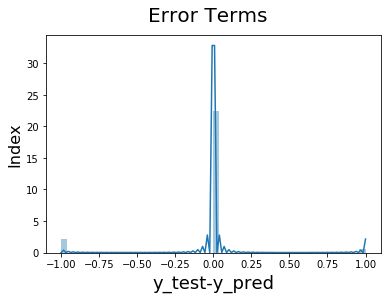

In [198]:
%matplotlib inline
import matplotlib.pyplot as plt
# Plotting the error terms to understand the distribution.
fig = plt.figure()
sns.distplot((y_test-predictions),bins=50)
fig.suptitle('Error Terms', fontsize=20)                  # Plot heading 
plt.xlabel('y_test-y_pred', fontsize=18)                  # X-label
plt.ylabel('Index', fontsize=16)                          # Y-label
plt.show()

In [199]:
# mean
np.mean(y_test-predictions)

-0.06469604015616286

The random forest doesnt seems to give good sensitivity value hence we will not recommend this model

##### Infrence for Random Forest with PCA
With Random Forest using PCA we are getting a model with 74% Senstivity/Recall which is low as compared to Logistic Regression model above

### SVM - Model Building

Non-Linear SVM

In [200]:
# using rbf kernel, C=1, default value of gamma
model = SVC(C = 1, kernel='rbf')
model.fit(pca_train, y_train)

y_pred_svc = model.predict(pca_test)

C:\Users\lenovo\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


In [201]:
compute_and_print_metrics_from_confusion_matrix(y_test, y_pred_svc)
print(classification_report(y_test, y_pred_svc))

Confusion matrix
[[7217 1025]
 [ 159  564]]

Overall accuracy =  0.867930842163971
True positive = 564, true negatives = 7217, false positives = 1025, false negatives = 159

Sensitivity =  0.7800829875518672
specificity =  0.8756369813152147

False postive rate =  0.12436301868478525
positive predictive value =  0.35494021397105097
Negative predictive value =  0.978443600867679
              precision    recall  f1-score   support

           0       0.98      0.88      0.92      8242
           1       0.35      0.78      0.49       723

   micro avg       0.87      0.87      0.87      8965
   macro avg       0.67      0.83      0.71      8965
weighted avg       0.93      0.87      0.89      8965



Even though we had good accuracy the recall / sensitivity score is low so lets try tuning the hyperparameters with recall as scoring.

#### SVM - Grid Search to Find Optimal Hyperparameters

Let's first use the RBF kernel to find the optimal C and gamma (we can consider the kernel as a hyperparameter as well, though training the model will take an exorbitant amount of time).

##Hyperparameter Tuning Hyperparameters to optimise - The choice of kernel (linear, rbf etc.) C gamma We'll use the GridSearchCV() method to tune the hyperparameters.

In [202]:
# creating a KFold object with 4 splits 
folds = KFold(n_splits = 4, shuffle = True, random_state = 4)

# specify range of hyperparameters
# Set the parameters by cross-validation
hyper_params = [ {'gamma': [1e-2, 1e-3, 1e-4],
                     'C': [1, 10, 100, 1000]}]


# specify model
model = SVC(kernel="rbf")

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = model, 
                        param_grid = hyper_params, 
                        scoring='roc_auc',
                        cv = folds,
                        n_jobs = -1,
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv.fit(pca_train, y_train)

Fitting 4 folds for each of 12 candidates, totalling 48 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 out of  48 | elapsed: 36.6min finished


GridSearchCV(cv=KFold(n_splits=4, random_state=4, shuffle=True),
       error_score='raise-deprecating',
       estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid=[{'gamma': [0.01, 0.001, 0.0001], 'C': [1, 10, 100, 1000]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='roc_auc', verbose=1)

In [203]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,91.523645,0.779908,17.034512,0.265754,1,0.01,"{'C': 1, 'gamma': 0.01}",0.912013,0.912743,0.911539,0.906826,0.910780,0.002323,6,0.911537,0.910525,0.911471,0.912740,0.911568,0.000786
1,110.306830,0.517556,21.284893,0.177845,1,0.001,"{'C': 1, 'gamma': 0.001}",0.902357,0.901721,0.900514,0.895814,0.900101,0.002562,10,0.900592,0.899160,0.900613,0.901631,0.900499,0.000880
2,160.534150,0.466390,32.848276,0.145671,1,0.0001,"{'C': 1, 'gamma': 0.0001}",0.883287,0.875875,0.876092,0.871376,0.876658,0.004265,12,0.876371,0.876433,0.876879,0.877931,0.876904,0.000625
3,76.852678,0.374508,15.340308,0.062257,10,0.01,"{'C': 10, 'gamma': 0.01}",0.924031,0.926565,0.924514,0.920380,0.923873,0.002229,3,0.926059,0.924794,0.925950,0.926670,0.925868,0.000678
4,90.784099,0.506306,17.536703,0.047098,10,0.001,"{'C': 10, 'gamma': 0.001}",0.908814,0.909224,0.908543,0.903837,0.907604,0.002189,8,0.908184,0.907365,0.907983,0.909283,0.908204,0.000692
5,110.368539,0.298080,21.114502,0.106856,10,0.0001,"{'C': 10, 'gamma': 0.0001}",0.902302,0.901674,0.900497,0.895773,0.900061,0.002559,11,0.900532,0.899107,0.900590,0.901573,0.900450,0.000879
6,91.694286,0.754420,13.704815,0.191479,100,0.01,"{'C': 100, 'gamma': 0.01}",0.939780,0.943332,0.941430,0.938465,0.940751,0.001823,2,0.945560,0.945041,0.945182,0.945546,0.945332,0.000227
7,82.147667,0.634738,15.670353,0.059356,100,0.001,"{'C': 100, 'gamma': 0.001}",0.911944,0.912788,0.912268,0.907583,0.911146,0.002079,5,0.911973,0.911322,0.911901,0.912998,0.912049,0.000603
8,90.975481,0.684049,16.654749,0.114168,100,0.0001,"{'C': 100, 'gamma': 0.0001}",0.908438,0.908838,0.908136,0.903440,0.907213,0.002193,9,0.907757,0.906972,0.907552,0.908829,0.907778,0.000672
9,243.798627,1.458445,11.571129,0.130674,1000,0.01,"{'C': 1000, 'gamma': 0.01}",0.952068,0.954802,0.954062,0.951965,0.953224,0.001237,1,0.961278,0.960983,0.961988,0.961903,0.961538,0.000422


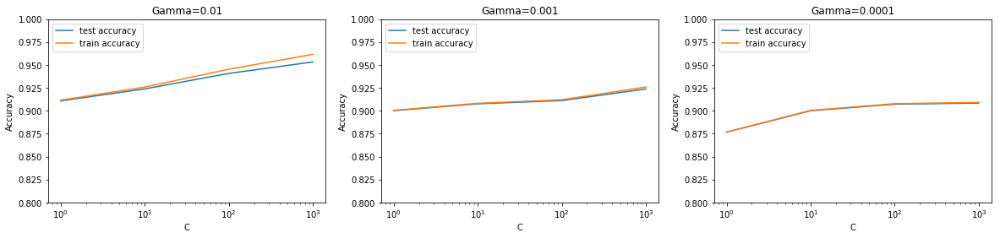

In [204]:
# converting C to numeric type for plotting on x-axis
cv_results['param_C'] = cv_results['param_C'].astype('int')

# # plotting
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure(figsize=(20,4))

# subplot 1/3
plt.subplot(131)
gamma_01 = cv_results[cv_results['param_gamma']==0.01]

plt.plot(gamma_01["param_C"], gamma_01["mean_test_score"])
plt.plot(gamma_01["param_C"], gamma_01["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("Gamma=0.01")
plt.ylim([0.80, 1])
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')

# subplot 2/3
plt.subplot(132)
gamma_001 = cv_results[cv_results['param_gamma']==0.001]

plt.plot(gamma_001["param_C"], gamma_001["mean_test_score"])
plt.plot(gamma_001["param_C"], gamma_001["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("Gamma=0.001")
plt.ylim([0.80, 1])
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')


# subplot 3/3
plt.subplot(133)
gamma_0001 = cv_results[cv_results['param_gamma']==0.0001]

plt.plot(gamma_0001["param_C"], gamma_0001["mean_test_score"])
plt.plot(gamma_0001["param_C"], gamma_0001["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("Gamma=0.0001")
plt.ylim([0.80, 1])
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')

plt.show()

In [205]:
# printing the optimal accuracy score and hyperparameters
best_score = model_cv.best_score_
best_hyperparams = model_cv.best_params_

print("The best test score is {0} corresponding to hyperparameters {1}".format(best_score, best_hyperparams))

The best test score is 0.9532241612447621 corresponding to hyperparameters {'C': 1000, 'gamma': 0.01}


In [206]:
# specify optimal hyperparameters and model
model = SVC(C=1000, gamma=0.01, kernel="rbf")

model.fit(pca_train, y_train)
y_pred_svc = model.predict(pca_test)

In [207]:
# metrics
compute_and_print_metrics_from_confusion_matrix(y_test, y_pred_svc)
print(classification_report(y_test, y_pred_svc))
print("precision = ", metrics.precision_score(y_test, y_pred_svc))

Confusion matrix
[[7265  977]
 [ 194  529]]

Overall accuracy =  0.8693809258226436
True positive = 529, true negatives = 7265, false positives = 977, false negatives = 194

Sensitivity =  0.7316735822959889
specificity =  0.8814608104828925

False postive rate =  0.1185391895171075
positive predictive value =  0.351261620185923
Negative predictive value =  0.9739911516289047
              precision    recall  f1-score   support

           0       0.97      0.88      0.93      8242
           1       0.35      0.73      0.47       723

   micro avg       0.87      0.87      0.87      8965
   macro avg       0.66      0.81      0.70      8965
weighted avg       0.92      0.87      0.89      8965

precision =  0.351261620185923


#### Evaluating Error Term

Let's now evaluate the model in terms of its assumptions. We should test that:

- The error terms are normally distributed with mean approximately 0
- There is little correlation between the predictors
- Homoscedasticity, i.e. the 'spread' or 'variance' of the error term (y_true-y_pred) is constant

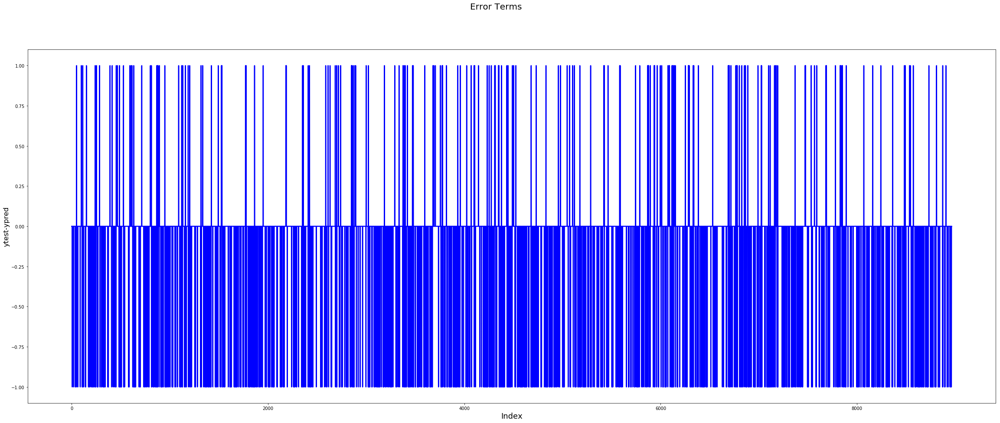

In [208]:
%matplotlib inline
import matplotlib.pyplot as plt
# Error terms
c = [i for i in range(len(y_pred_svc))]
fig = plt.figure(figsize=(40, 15))
plt.plot(c, y_test-y_pred_svc, color="blue", linewidth=2.5, linestyle="-")
fig.suptitle('Error Terms', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=18)                      # X-label
plt.ylabel('ytest-ypred', fontsize=16)                # Y-label
plt.show()

C:\Users\lenovo\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


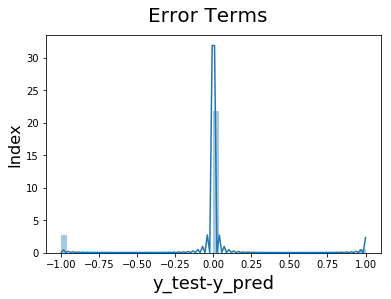

In [209]:
%matplotlib inline
import matplotlib.pyplot as plt
# Plotting the error terms to understand the distribution.
fig = plt.figure()
sns.distplot((y_test-y_pred_svc),bins=50)
fig.suptitle('Error Terms', fontsize=20)                  # Plot heading 
plt.xlabel('y_test-y_pred', fontsize=18)                  # X-label
plt.ylabel('Index', fontsize=16)                          # Y-label
plt.show()

In [210]:
# mean
np.mean(y_test-y_pred_svc)

-0.08733965421081985

##### Infrence for SVM with PCA
With SVM using PCA we are getting a model with 73% Senstivity/Recall which is low as compared to Logistic Regression model above

## Final Inference for Model Selection with PCA - Assignment Part 1
We are getting the best senstivity of 88% using Logistic Regression Model compared to Decision Tree, Random Forest and SVM 
Also SVM and Random Forest are computationaly intensive as compared to Logistic Regression.

### It is recommended to use Logistic Regression

### Model Building without PCA - to identify the important features for churn - Assignment Part 2

Though we have build the models using PCA to predict the churner,it is very diffcult to interpret the principal components to indicate which features majorly contribute to the churn.Hence the need to build model without PCA to identify the important features for churning

#### Logistic Regression

Tune the hyperparameter to select the optimum number of feature for RFE using GridSearchCV

In [211]:
# creating a KFold object with 4 splits 
folds = KFold(n_splits = 4, shuffle = True, random_state = 100)

# specify range of hyperparameters
hyper_params = [{'n_features_to_select': [9,11,13]}]

# specify model
LogRegModel_noPCA = LogisticRegression(solver='liblinear')
LogRegModel_noPCA.fit(X_train, y_train)
rfe = RFE(LogRegModel_noPCA)             

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = rfe, 
                        param_grid = hyper_params, 
                        scoring= 'roc_auc', 
                        cv = folds,
                        n_jobs = -1,
                        verbose = 1,
                        return_train_score=True)     

In [212]:
model_cv.fit(X_train, y_train)

Fitting 4 folds for each of 3 candidates, totalling 12 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed: 23.8min finished


GridSearchCV(cv=KFold(n_splits=4, random_state=100, shuffle=True),
       error_score='raise-deprecating',
       estimator=RFE(estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='liblinear',
          tol=0.0001, verbose=0, warm_start=False),
  n_features_to_select=None, step=1, verbose=0),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid=[{'n_features_to_select': [9, 11, 13]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='roc_auc', verbose=1)

In [213]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,472.547531,4.580783,0.036977,0.003534,9,{'n_features_to_select': 9},0.896747,0.888788,0.896078,0.888454,0.892517,0.003905,3,0.894392,0.888521,0.895894,0.891582,0.892597,0.002817
1,466.219176,4.163164,0.020240,0.001300,11,{'n_features_to_select': 11},0.900150,0.896128,0.896712,0.896963,0.897488,0.001567,2,0.901428,0.895965,0.895853,0.897988,0.897808,0.002256
2,459.166515,2.610143,0.013244,0.002276,13,{'n_features_to_select': 13},0.900043,0.897933,0.900634,0.903513,0.900530,0.001993,1,0.901550,0.900079,0.902213,0.903020,0.901716,0.001079


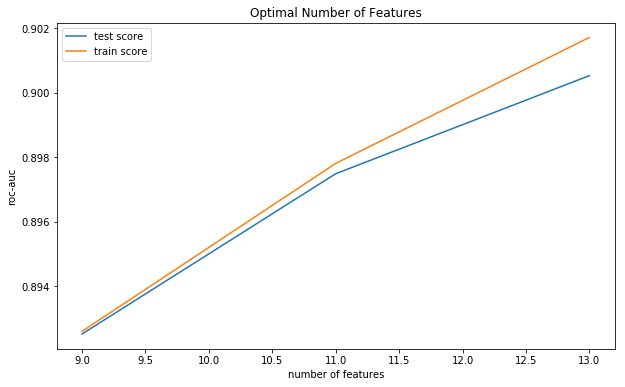

In [214]:
%matplotlib inline
# plotting cv results
plt.figure(figsize=(10,6))

plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_test_score"])
plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('roc-auc')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='upper left')
plt.show()

It can be observed from the above table and figure that we get mean test score of 0.896 and after that the increase is marginal so we decide to build model with 9 features.

In [215]:
LogRegModel_noPCA_final = LogisticRegression(solver='liblinear')
rfe_final = RFE(LogRegModel_noPCA,9)   
rfe_final = rfe_final.fit(X,y)

print(rfe_final.support_)           # Printing the boolean results
print(rfe_final.ranking_)

[False False False False False False False False False False False False
 False False  True False False False False False False False False False
 False False False False False False False False  True False False  True
 False False False False False  True False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
  True False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False  True  True False False
 False False False False False False False False False False False False
  True False False False False False False False  True False False False
 False False False False False False False False Fa

Select only the features as selected by RFE for further analysis

In [216]:
X_train_final = X_train.iloc[:,rfe_final.support_]
X_test_final = X_test.iloc[:,rfe_final.support_]

X_train_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38450 entries, 0 to 38449
Data columns (total 9 columns):
count_rech_2g_8       38450 non-null float64
last_day_rch_amt_8    38450 non-null float64
loc_ic_mou_8          38450 non-null float64
loc_ic_t2m_mou_8      38450 non-null float64
spl_ic_mou_8          38450 non-null float64
total_ic_mou_7        38450 non-null float64
total_ic_mou_8        38450 non-null float64
vbc_3g_8              38450 non-null float64
arpu_difference       38450 non-null float64
dtypes: float64(9)
memory usage: 2.6 MB


Build a Logistic Regression model and analyse the summary

In [217]:
logsk = LogisticRegression(solver='liblinear')
logsk.fit(X_train_final, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='liblinear',
          tol=0.0001, verbose=0, warm_start=False)

In [218]:
import statsmodels.api as sm
logm = sm.GLM(y_train,(sm.add_constant(X_train_final)), family = sm.families.Binomial())
logm.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                38450
Model:                            GLM   Df Residuals:                    38440
Model Family:                Binomial   Df Model:                            9
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16103.
Date:                Sun, 18 Nov 2018   Deviance:                       32206.
Time:                        23:31:14   Pearson chi2:                 3.41e+05
No. Iterations:                     7   Covariance Type:             nonrobust
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 11.7873      0.308     38.209      0.000      11.183      12.392
count_rech_2g_8       -4.1339      0.138    -29.912      0.000      -4.405      -3.863
last_day_rch_amt_8    -2.4496      0.102    -24.088      0.000      -2.649      -2.250
loc_ic_mou_8          -7.1816      0.653    -11.001      0.000      -8.461      -5.902
loc_ic_t2m_mou_8       0.0213      0.524      0.041      0.968      -1.005       1.048
spl_ic_mou_8          -3.8168      0.200    -19.072      0.000      -4.209      -3.425
total_ic_mou_7         3.9788      0.205     19.416      0.000       3.577       4.380
total_ic_mou_8        -7.5438      0.417    -18.072      0.000      -8.362      -6.726
vbc_3g_8              -2.8332      0.144    -19.654      0.000      -3.116      -2.551
arpu_difference      -12.4369      0.368    -33.826      0.000     -13.158     -11.716
======================================================================================
"""

It can be observed there are still few columns like "loc_ic_t2m_mou_8" which has p-value more than 0.05

Lets check the vif of the feature to see strong corelation exists between feature

In [219]:
Cols = X_train_final.columns
Cols  = Cols.insert(11,'churn')
Cols

Index(['count_rech_2g_8', 'last_day_rch_amt_8', 'loc_ic_mou_8',
       'loc_ic_t2m_mou_8', 'spl_ic_mou_8', 'total_ic_mou_7', 'total_ic_mou_8',
       'vbc_3g_8', 'arpu_difference', 'churn'],
      dtype='object')

In [220]:
vif_cal(input_data=master_df[Cols], dependent_col='churn')

,Var,Vif
2,loc_ic_mou_8,15.46
6,total_ic_mou_8,13.45
3,loc_ic_t2m_mou_8,7.64
5,total_ic_mou_7,5.91
8,arpu_difference,3.06
1,last_day_rch_amt_8,1.86
0,count_rech_2g_8,1.32
7,vbc_3g_8,1.25
4,spl_ic_mou_8,1.08


Observe that the field "loc_ic_t2m_mou_8" also has high VIF(>4)> along with high P  value hence we can delete the feature and proceed with analysis

Drop the feature "loc_ic_t2m_mou_8" and redo the logistic regression analysis

In [221]:
try:
    Cols = Cols.drop('loc_ic_t2m_mou_8')
except:
    print("Column name not present")
logsk = RedoLogisticModel(['loc_ic_t2m_mou_8'])

Dropping loc_ic_t2m_mou_8 ...


C:\Users\lenovo\Anaconda3\lib\site-packages\pandas\core\frame.py:3694: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                38450
Model:                            GLM   Df Residuals:                    38441
Model Family:                Binomial   Df Model:                            8
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16103.
Date:                Sun, 18 Nov 2018   Deviance:                       32206.
Time:                        23:31:15   Pearson chi2:                 3.41e+05
No. Iterations:                     7   Covariance Type:             nonrobust
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 11.7875      0.308     38.213      0.000      11.183      12.392
count_rech_2g_8       -4.133

In [222]:
vif_cal(input_data=master_df[Cols], dependent_col='churn')

,Var,Vif
5,total_ic_mou_8,13.45
2,loc_ic_mou_8,9.35
4,total_ic_mou_7,5.90
7,arpu_difference,3.04
1,last_day_rch_amt_8,1.85
0,count_rech_2g_8,1.32
6,vbc_3g_8,1.25
3,spl_ic_mou_8,1.08


Observe that the field "loc_ic_mou_8" whcih has high VIF(>4)>Hence we can delete the feature and proceed with analysis

Drop the feature "loc_ic_mou_8" and redo the logistic regression analysis

In [223]:
try:
    Cols = Cols.drop('loc_ic_mou_8')
except:
    print("Column name not present")
logsk = RedoLogisticModel(['loc_ic_mou_8'])

Dropping loc_ic_mou_8 ...


C:\Users\lenovo\Anaconda3\lib\site-packages\pandas\core\frame.py:3694: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                38450
Model:                            GLM   Df Residuals:                    38442
Model Family:                Binomial   Df Model:                            7
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16252.
Date:                Sun, 18 Nov 2018   Deviance:                       32503.
Time:                        23:31:16   Pearson chi2:                 1.81e+06
No. Iterations:                     7   Covariance Type:             nonrobust
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 11.7329      0.308     38.084      0.000      11.129      12.337
count_rech_2g_8       -4.199

Lets have a look a the VIF table 

In [224]:
vif_cal(input_data=master_df[Cols], dependent_col='churn')

,Var,Vif
3,total_ic_mou_7,5.90
4,total_ic_mou_8,5.85
6,arpu_difference,3.04
1,last_day_rch_amt_8,1.85
0,count_rech_2g_8,1.32
5,vbc_3g_8,1.25
2,spl_ic_mou_8,1.08


The VIFs although above 4 for "total_ic_mou_7" and "total_ic_mou_8"	but since p value is 0 for these features and from buisness need they are important so we decide to keep them as key features.

So we can finalise these features and see the model performance 

Predict the probability of y('churn') using the final model and selected features and put it in a DataFrame

In [225]:
y_pred = logsk.predict_proba(X_test[X_train_final.columns])

# Converting y_pred to a dataframe which is an array
y_pred_df = pd.DataFrame(y_pred)
# Converting to column dataframe
y_pred_1 = y_pred_df.iloc[:,[1]]

# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

y_test_df.head()

,churn
25743,0
8318,1
18611,0
54656,0
48535,0


In [226]:
# Putting CustID to index
y_test_df['CustID'] = y_test_df.index

# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df,y_pred_1],axis=1)

Merging the Actual and predcited 'churn' into one dataFrame for ease of analysis and visualisation

In [227]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 1 : 'Churn_Prob'})

y_pred_final.head()

,churn,CustID,Churn_Prob
0,0,25743,0.031399
1,1,8318,0.927920
2,0,18611,0.439415
3,0,54656,0.168537
4,0,48535,0.007477


To start with the model evaluation lets take the churn probability more than 50% and churned else non-churn

In [228]:
# Creating new column 'predicted' with 1 if Churn_Prob>0.5 else 0
y_pred_final['predicted'] = y_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_pred_final.head()

,churn,CustID,Churn_Prob,predicted
0,0,25743,0.031399,0
1,1,8318,0.927920,1
2,0,18611,0.439415,0
3,0,54656,0.168537,0
4,0,48535,0.007477,0


Anlayse the Confusion metrics and observe the values for accuracy,sensitivity and specificity. 

As in this case it is more important to predict the churned customers correctly ,We should be concentrating more on high sensitvity or recall value

In [229]:
# Confusion matrix 
confusion = metrics.confusion_matrix( y_pred_final.churn, y_pred_final.predicted )
confusion

array([[6557, 1685],
       [ 133,  590]], dtype=int64)

In [230]:
compute_and_print_metrics_from_confusion_matrix(y_pred_final.churn, y_pred_final.predicted)
print("precision = ", metrics.precision_score(y_pred_final.churn, y_pred_final.predicted))

Confusion matrix
[[6557 1685]
 [ 133  590]]

Overall accuracy =  0.7972113775794757
True positive = 590, true negatives = 6557, false positives = 1685, false negatives = 133

Sensitivity =  0.8160442600276625
specificity =  0.7955593302596458

False postive rate =  0.20444066974035427
positive predictive value =  0.25934065934065936
Negative predictive value =  0.980119581464873
precision =  0.25934065934065936


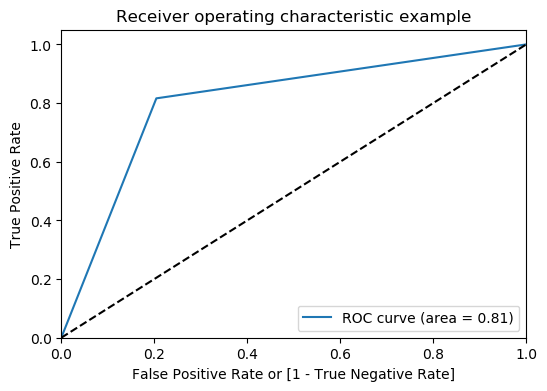

(array([0.        , 0.20444067, 1.        ]),
 array([0.        , 0.81604426, 1.        ]),
 array([2, 1, 0], dtype=int64))

In [231]:
draw_roc(y_pred_final.churn, y_pred_final.predicted)

In [232]:
print(classification_report(y_pred_final.churn, y_pred_final.predicted))

              precision    recall  f1-score   support

           0       0.98      0.80      0.88      8242
           1       0.26      0.82      0.39       723

   micro avg       0.80      0.80      0.80      8965
   macro avg       0.62      0.81      0.64      8965
weighted avg       0.92      0.80      0.84      8965



As we can see above the Sensitivity is nearly 82% ,it appears to be a good model for prediction. Though it can be further tuned to improve the sensitivity or recall score.

Lets do that by anaysing the the sensitivity and specificity for diffrent values of probability cutoff.

In [233]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_pred_final[i]= y_pred_final.Churn_Prob.map( lambda x: 1 if x > i else 0)
y_pred_final.head()

,churn,CustID,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,25743,0.031399,0,1,0,0,0,0,0,0,0,0,0
1,1,8318,0.927920,1,1,1,1,1,1,1,1,1,1,1
2,0,18611,0.439415,0,1,1,1,1,1,0,0,0,0,0
3,0,54656,0.168537,0,1,1,0,0,0,0,0,0,0,0
4,0,48535,0.007477,0,1,0,0,0,0,0,0,0,0,0


     prob  accuracy     sensi     speci
0.0   0.0  0.080647  1.000000  0.000000
0.1   0.1  0.413162  0.965422  0.364717
0.2   0.2  0.541885  0.937759  0.507158
0.3   0.3  0.641495  0.907331  0.618175
0.4   0.4  0.722588  0.871369  0.709537
0.5   0.5  0.797211  0.816044  0.795559
0.6   0.6  0.861238  0.760719  0.870056
0.7   0.7  0.909202  0.699862  0.927566
0.8   0.8  0.931623  0.515906  0.968090
0.9   0.9  0.928500  0.193638  0.992963


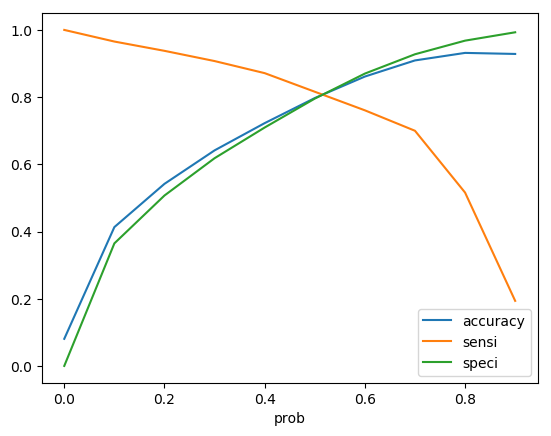

In [234]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
probability_cutoffs(y_pred_final.churn, y_pred_final)

As we can see from the above plot that having a probability cut-off of 30% , the sensitivity is at 91% with fairly good accuracy and specificity as well. So we can take 0.3 as prob cut off

In [235]:
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.3 else 0)

print(classification_report(y_pred_final.churn, y_pred_final.final_predicted))

              precision    recall  f1-score   support

           0       0.99      0.62      0.76      8242
           1       0.17      0.91      0.29       723

   micro avg       0.64      0.64      0.64      8965
   macro avg       0.58      0.76      0.53      8965
weighted avg       0.92      0.64      0.72      8965



#### Evaluating Error Terms

Let's now evaluate the model in terms of its assumptions. We should test that:

- The error terms are normally distributed with mean approximately 0
- There is little correlation between the predictors
- Homoscedasticity, i.e. the 'spread' or 'variance' of the error term (y_true-y_pred) is constant

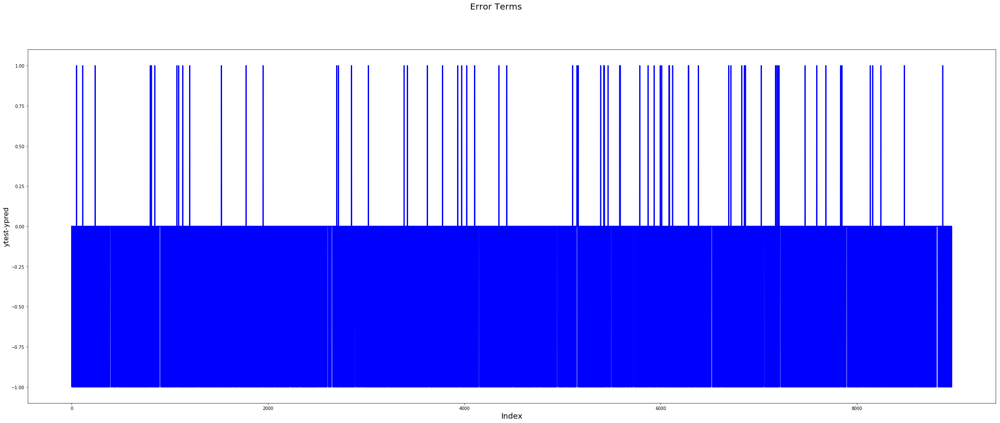

In [236]:
%matplotlib inline
import matplotlib.pyplot as plt
# Error terms
c = [i for i in range(len(y_pred_final.final_predicted))]
fig = plt.figure(figsize=(40, 15))
plt.plot(c, y_pred_final.churn-y_pred_final.final_predicted, color="blue", linewidth=2.5, linestyle="-")
fig.suptitle('Error Terms', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=18)                      # X-label
plt.ylabel('ytest-ypred', fontsize=16)                # Y-label
plt.show()

C:\Users\lenovo\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


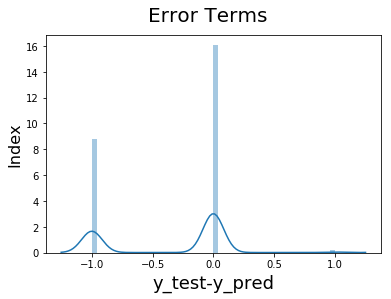

In [237]:
%matplotlib inline
import matplotlib.pyplot as plt
# Plotting the error terms to understand the distribution.
fig = plt.figure()
sns.distplot((y_pred_final.churn-y_pred_final.final_predicted),bins=50)
fig.suptitle('Error Terms', fontsize=20)                  # Plot heading 
plt.xlabel('y_test-y_pred', fontsize=18)                  # X-label
plt.ylabel('Index', fontsize=16)                          # Y-label
plt.show()

In [238]:
# mean
np.mean(y_pred_final.churn-y_pred_final.final_predicted)

-0.34355828220858897

###### As we have got  a fairly good logistic regression model with nearly 91% sensitivity, that is 91% accuracy in predicting the churns we can conclude the feature used to build this final model effects the churning most .
The feature names are as follows:

In [239]:
i = 1
print('Features effects the churning most are')
for col in Cols:
    if col != 'churn':
        print(f'{i}. {col}')
        i=i+1

Features effects the churning most are
1. count_rech_2g_8
2. last_day_rch_amt_8
3. spl_ic_mou_8
4. total_ic_mou_7
5. total_ic_mou_8
6. vbc_3g_8
7. arpu_difference


In [240]:
coefs = logsk.coef_[0]
coefs = coefs.tolist()

try:
    Cols = Cols.drop('churn')
except:
    print("Column name not present")

coef_df = pd.DataFrame({'Feature Name': Cols,
                         'Coeffiecient(effect on churn)': coefs,
                        })

## Conclusion :

##### Below table showing key features effecting the Churn and there respective coefficients/weights 

In [241]:
coef_df.head(7)

,Feature Name,Coeffiecient(effect on churn)
0,count_rech_2g_8,-4.262364
1,last_day_rch_amt_8,-2.617976
2,spl_ic_mou_8,-3.642528
3,total_ic_mou_7,3.785573
4,total_ic_mou_8,-13.211343
5,vbc_3g_8,-2.883101
6,arpu_difference,-10.437132


### Key Recommendations :
1. Voice usage(incoming) in mostly "action phase" seems a key feature in determining the Churn and hence company should keep track on the voice usage and also provide incentives/offers to users who are categorised by the model as potential churners

2. Difference or change(decrease) in the arpu should be taken as key hint for the user to churn and necessary  action should be taken to for the user showing significant change in the arpu

3. Recharge amount is a key indicator to decide if customer is likely to churn or not